In [384]:
import numpy as np
import pymc as pm
import arviz as az
# -- use this line at the beginning of your notebook to turn on interactive plots
%matplotlib notebook
import scipy.io
# note these imports, thay may be useful in your own task

import matplotlib.pyplot as plt  # plotting library
import numpy as np  # work with numeric arrays without labeled axes
import xarray as xr  # work with arrays with labeled axes
import pandas as pd

In [388]:
file_path = 'LH_metal_DB_v1.12.csv'  # 替换为你的文件路径
df = pd.read_csv(file_path)
df.loc[:, 'TOK'] = df['TOK'].str.strip()
df['IP']=df['IP'].abs()/1000000
df['BT']=df['BT'].abs()
df['PLTH']=df['PLTH']/1000000
df['NEL']=df['NEL']/1e19


df.loc[:, 'TOK'] = df['TOK'].str.strip()

reference_dict = {
    1.00:  "Hydrogen",
    2.00:  "Deuterium",
    2.50:  "Deuterium and tritium",
    3.00:  "3He or tritium",
    4.00:  "4He",
    14.01: "Nitrogen"
}

# 定义一个函数，用来根据某一观测值PGASA，返回对应的分类名称
def categorize_pgasa(value, ref_dict, tolerance=0.2):
    """
    value: 待分类的数值
    ref_dict: {参考值: 分类名称}
    tolerance: 容忍度，即 |value - 参考值| 需小于等于该值才视为同一类
    """
    # 1) 找到离 value 最近的参考值
    closest_ref = min(ref_dict.keys(), key=lambda x: abs(x - value))
    # 2) 判断两者差值是否在容忍度以内
    if abs(closest_ref - value) <= tolerance:
        return ref_dict[closest_ref]
    else:
        return np.nan  # 或者 "Other"

# 将 categorize_pgasa 应用于 df["PGASA"] 列，生成新的分类列
df["Category"] = df["PGASA"].apply(lambda x: categorize_pgasa(x, reference_dict, tolerance=0.1))




# 假设 subset1 是你的数据框
colors = df['SELEC2024'].map({1: 'red', 0: 'blue'})


# 分类 BT 值
#subset2_2 = df[(ip < 2.6) & (ip >=2.4)&(bt < 3.2) & (bt >=2.8)& (df['Category'] == 'Deuterium')& (df['DIVCON'] == 'VT')]
#df = df.drop(subset2_2.index)

import statsmodels.api as sm
print(df.columns.tolist())

# 指定你想在新 DataFrame 中包含的列
columns_to_include = ['TOK', 'SPLASMA','AMIN','BT','IP','RGEO','PLTH','NEL','PGASA','KAPPA','Q95','AUXHEAT',"DIVCON"]
new_df = df[df['SELEC2024'] == 0][columns_to_include].copy()
mu0 = 4 * np.pi * 1e-7

new_df['BP']=1000000*(mu0 * new_df['IP']) / (new_df['SPLASMA']/(2 * np.pi * new_df['RGEO']))

new_df['PLTH/S/2']=new_df['PLTH']/(new_df['SPLASMA']*2)
new_df['a1']=new_df['SPLASMA']/(np.pi*new_df['RGEO']*2)
new_df['a']=new_df['AMIN']/new_df['RGEO']
#new_df['PLTH/S/2']=new_df['PLTH']
# 显示新 DataFrame



columns_to_include_for_regre = ['BP','IP','BT','a','AMIN','RGEO','KAPPA','Q95','PLTH/S/2','NEL','PGASA']
unique_divcon = new_df['DIVCON'].unique()
unique_heating = new_df['AUXHEAT'].unique()
print(unique_heating)
# 2. 向原始 DataFrame 添加新列
for divcon_type in unique_divcon:
    new_df[divcon_type] = (new_df['DIVCON'] == divcon_type).astype(int)
multi_df = new_df[columns_to_include_for_regre].copy()
multi_df = multi_df.apply(np.log)
x = multi_df[['BP','BT','IP','NEL','PGASA']] 
#x = multi_df[['BT','NEL','PGASA']]
x[unique_divcon] = new_df[unique_divcon]
#x['Xp'] = x[['Xptref','Xpthigh','Xptin']].max(axis=1)
x.drop(['STANDARD'], axis=1, inplace=True)
x.drop(['Xptref','Xptin'], axis=1, inplace=True)
#x['CV'] = x[['CORNER','VT']].max(axis=1)
x.drop(['V5L','HT3'], axis=1, inplace=True)

X_with_intercept = sm.add_constant(x)
y=multi_df["PLTH/S/2"]
model = sm.OLS(y, X_with_intercept)
results = model.fit()

# 打印详细统计结果
print(results.summary())
print(unique_divcon)
# 输出系数和标准误差
coefficients = results.params
std_errors = results.bse

labels = X_with_intercept.columns  # 获取变量名
for label, coef, std_err in zip(labels, coefficients, std_errors):
    print(f"{label}: {coef:.3f} ± {std_err:.3f}")
    # 打印 RMSE
y_pred = results.predict(X_with_intercept)  # 预测值
rmse = np.sqrt(np.mean((y - y_pred) ** 2))  # 计算 RMSE

print(f"RMSE: {rmse:.3f}")
# 获取 90% 置信区间
conf_int_90 = results.conf_int(alpha=0.1)


print("\n90% 置信区间：\n", conf_int_90)


['TOK', 'SHOT', 'TIME', 'PHASE', 'PGASA', 'RGEO', 'AMIN', 'KAPPA', 'SPLASMA', 'CONFIG', 'IGRADB', 'WALMAT', 'DIVMAT', 'LIMMAT', 'EVAP', 'BT', 'IP', 'Q95', 'NEL', 'ZEFF', 'DIVNAME', 'PL', 'PLTH', 'PFLOSS', 'PRADCORE', 'DIVCON', 'FRACNMIN', 'LHTIME', 'AUXHEAT', 'SELEC2024', 'Category']
['IC' 'EC' 'NBEC' 'ECIC' 'NB' 'NBIC' nan]
                            OLS Regression Results                            
Dep. Variable:               PLTH/S/2   R-squared:                       0.911
Model:                            OLS   Adj. R-squared:                  0.906
Method:                 Least Squares   F-statistic:                     182.3
Date:                Tue, 06 May 2025   Prob (F-statistic):           3.09e-96
Time:                        15:18:49   Log-Likelihood:                 28.265
No. Observations:                 207   AIC:                            -32.53
Df Residuals:                     195   BIC:                             7.463
Df Model:                          11    

/var/folders/5g/7cwc8n193kz9d4h5lc3ky_0c0000gn/T/ipykernel_9077/2247365370.py:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x[unique_divcon] = new_df[unique_divcon]
/var/folders/5g/7cwc8n193kz9d4h5lc3ky_0c0000gn/T/ipykernel_9077/2247365370.py:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x[unique_divcon] = new_df[unique_divcon]
/var/folders/5g/7cwc8n193kz9d4h5lc3ky_0c0000gn/T/ipykernel_9077/2247365370.py:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.


In [ ]:
y=pd.DataFrame(y)
y_pred = pd.DataFrame(y_pred)
y_pred.columns = ['PLTH/S/2']
y[['DIVCON','AUXHEAT']]=new_df[['DIVCON','AUXHEAT']]
y['TOK']=new_df['TOK']
y['SPLASMA']=new_df['SPLASMA']

y_pred[['DIVCON','AUXHEAT']]=new_df[['DIVCON','AUXHEAT']]
y_pred['TOK']=new_df['TOK']
y_pred['SPLASMA']=new_df['SPLASMA']
unique_divcon = df['DIVCON'].unique()
y_pred

<IPython.core.display.Javascript object>


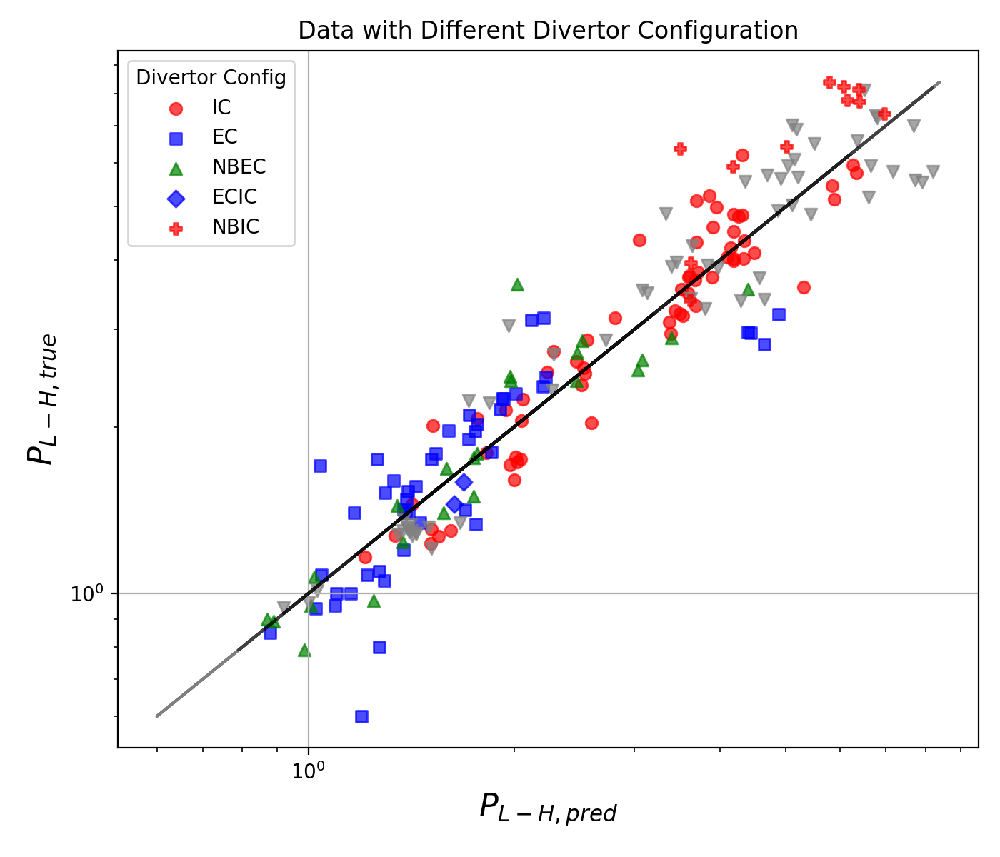

/var/folders/5g/7cwc8n193kz9d4h5lc3ky_0c0000gn/T/ipykernel_9077/3874510937.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset1['PLTH/S/2'] = np.exp(subset1['PLTH/S/2']) * subset1['SPLASMA'] * 2
/var/folders/5g/7cwc8n193kz9d4h5lc3ky_0c0000gn/T/ipykernel_9077/3874510937.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset2['PLTH/S/2'] = np.exp(subset2['PLTH/S/2']) * subset2['SPLASMA'] * 2


In [116]:
import matplotlib.pyplot as plt
import numpy as np

def plot_divcon_scatter(df, divcon_col='AUXHEAT', highlight_types=None):
    """
    根据不同的 divertor 配置，在散点图中用不同颜色或标记进行区分。
    highlight_types: 需要突出显示的 DIVCON 种类列表（最多三个）。
    """
    if highlight_types is None:
        highlight_types = []  # 如果没有指定，默认为空

    unique_divcon = df[divcon_col].unique()
    
    plt.figure(figsize=(7, 6))
    
    # 定义颜色和标记
    highlight_colors = ['red', 'blue', 'green','orange']  # 突出显示的三种颜色
    gray_color = 'gray'  # 其他种类用灰色
    markers = ['o', 's', '^', 'D', 'v', 'P', '*']  # 可自行增减

    # 用于存储图例的句柄和标签
    legend_handles = []
    legend_labels = []

    for i, div_type in enumerate(unique_heating):
        # 过滤出当前 divertor 配置的数据
        subset2 = y[y[divcon_col] == div_type]
        subset1 = y_pred[y_pred[divcon_col] == div_type]  # 如果 y_pred 是 df 的一部分，请明确其来源
        
        # 计算 PLTH/S/2
        subset1['PLTH/S/2'] = np.exp(subset1['PLTH/S/2']) * subset1['SPLASMA'] * 2
        subset2['PLTH/S/2'] = np.exp(subset2['PLTH/S/2']) * subset2['SPLASMA'] * 2
        #subset1['PLTH/S/2'] = np.exp(subset1['PLTH/S/2']) 
        #subset2['PLTH/S/2'] = np.exp(subset2['PLTH/S/2']) 
        
        # 判断是否为需要突出显示的种类
        if div_type in highlight_types:
            color = highlight_colors[highlight_types.index(div_type) % len(highlight_colors)]
            label = f"{div_type}"
            # 添加到图例
            scatter = plt.scatter(subset1['PLTH/S/2'], subset2['PLTH/S/2'],
                                  marker=markers[i % len(markers)],
                                  color=color,
                                  label=label, alpha=0.7)
            legend_handles.append(scatter)
            legend_labels.append(label)
        else:
            color = gray_color
            # 不添加到图例
            plt.scatter(subset2['PLTH/S/2'], subset1['PLTH/S/2'],
                         marker=markers[i % len(markers)],
                         color=color,
                         alpha=0.7)
        
        # 绘制对角线
        plt.plot(subset2['PLTH/S/2'], subset2['PLTH/S/2'], color='black', alpha=0.5)

    #plt.title("Data with Different TOKAMAK")
    plt.title("Data with Different Divertor Configuration")
    plt.legend(legend_handles, legend_labels, title="Divertor Config")  # 只显示有颜色的图例
    #plt.legend(legend_handles, legend_labels, title="TOKAMAK")  # 只显示有颜色的图例
    plt.grid(True)
    plt.xscale('log')
    plt.yscale('log')
    plt.xlabel('$P_{L-H, pred}$',fontsize=16)
    plt.ylabel('$P_{L-H, true}$',fontsize=16)
    plt.tight_layout()
    plt.savefig('divertor_scatter.png', dpi=300, bbox_inches='tight')  # 修改文件名
    #plt.savefig('TOK_scatter.png', dpi=300, bbox_inches='tight')  # 修改文件名
    plt.show()

# 示例调用
#highlight_types = ['IC', 'EC','NBEC',' NB','NBIC','ECIC']  # 需要突出显示的 DIVCON 种类
#highlight_types = ['AUG', 'CMOD','JET']  # 需要突出显示的 机器 种类
plot_divcon_scatter(new_df, divcon_col='AUXHEAT', highlight_types=highlight_types)


Multiprocess sampling (4 chains in 4 jobs)
CompoundStep
>NUTS: [alpha, p, eta, beta_ori, beta_m, pi, sigma2]
>CategoricalGibbsMetropolis: [S]
>BinaryGibbsMetropolis: [gamma_prev, gamma]


Output()

Sampling 4 chains for 500 tune and 3_000 draw iterations (2_000 + 12_000 draws total) took 342 seconds.
/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


<IPython.core.display.Javascript object>


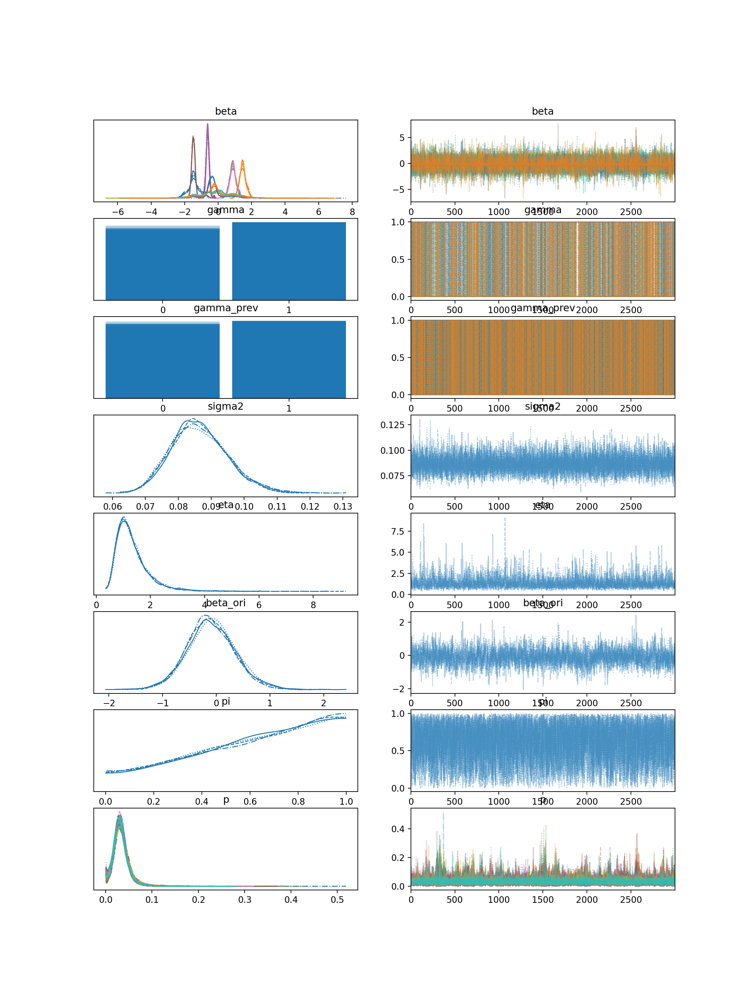

/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


          mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
beta[0] -1.431  0.369  -2.127   -0.695      0.017    0.012     510.0   
beta[1]  1.473  0.197   1.107    1.860      0.009    0.007     443.0   
beta[2]  0.876  0.196   0.515    1.265      0.006    0.005     965.0   
beta[3] -0.632  0.100  -0.817   -0.450      0.005    0.003     502.0   
beta[4] -0.611  0.093  -0.786   -0.435      0.002    0.001    2392.0   
...        ...    ...     ...      ...        ...      ...       ...   
p[25]    0.034  0.019   0.000    0.060      0.001    0.001    1064.0   
p[26]    0.033  0.017   0.000    0.058      0.000    0.000    2670.0   
p[27]    0.033  0.018   0.000    0.059      0.000    0.000    1729.0   
p[28]    0.034  0.019   0.002    0.063      0.001    0.000    1024.0   
p[29]    0.033  0.018   0.000    0.060      0.000    0.000    2353.0   

         ess_tail  r_hat  
beta[0]     599.0   1.01  
beta[1]     654.0   1.01  
beta[2]     847.0   1.00  
beta[3]     737.0   1.01  


In [150]:

# Step 1: Generate simulated data
np.random.seed(42)
N = 3000  # Number of samples
D = 12  # Number of predictors


# Step 2: Define the PyMC model
with pm.Model() as model:
    # Priors
    # Beta for regression coefficients, grouped into classes
    alpha = pm.HalfNormal("alpha", sigma=8.0)  # Dirichlet prior concentration parameter
    #alpha=1
    p = pm.Dirichlet("p", a=pm.math.ones(30) * alpha, shape=30)  # Class probabilities
 #10 0 1 2 3 4 
    S = pm.Categorical("S", p=p, shape=D)# bp=nel shape  1 1 1  # Class assignment for predictors (0-9)
    #[1 3 5 7 9]
    eta = pm.InverseGamma("eta", alpha=4, beta=4)  # Variance for beta_m
    mu_0=pm.Normal("beta_ori",mu=0,sigma=2)
    beta_m = pm.Normal("beta_m", mu=mu_0, sigma=pm.math.sqrt(eta), shape=30)  # Regression coefficients for each class
    
    # Ensure S only indexes valid categories of beta_m
    beta = pm.Deterministic("beta", beta_m[S])  # Map beta based on S
    
    # Sparsity indicator gamma
    pi = pm.Beta("pi", alpha=1, beta=1)  # Probability of gamma=1
    gamma_prev = pm.Bernoulli("gamma_prev", p=0.5, shape=D)  # 初始值
    rho = 0.8  # 控制gamma的平稳性（越接近1越稳定）
    gamma = pm.Bernoulli("gamma", p=rho * gamma_prev + (1 - rho) * pi, shape=D)

    #gamma = pm.Bernoulli("gamma", p=pi, shape=D)

    # Noise variance (sigma^2)
    sigma2 = pm.InverseGamma("sigma2", alpha=4, beta=4)  # Prior for noise variance

    # Observed data likelihood
    mu = pm.math.dot(X_with_intercept, beta * gamma)  # Predicted mean
    y_obs = pm.Normal("y_obs", mu=mu, sigma=pm.math.sqrt(sigma2), observed=y)

    # Inference
    
    trace = pm.sample(N, tune=500, chains=4,step=pm.NUTS(target_accept=0.95), return_inferencedata=True)


# Step 3: Analyze and visualize the results
az.plot_trace(trace, var_names=["beta", "gamma", "gamma_prev","sigma2", "eta", "beta_ori","pi", "p"])
plt.show()
summary=az.summary(trace, var_names=["beta", "gamma","gamma_prev", "sigma2", "eta","beta_ori", "pi", "p"])
print(summary)

In [389]:
# 从后验中随机抽取 10 个样本
num_samples = 1000
posterior_indices = np.random.choice(
    trace.posterior["beta"].stack(samples=["chain", "draw"]).shape[1], 
    size=num_samples, 
    replace=False
)

# 定义新数据
 # 新数据 (10 个样本)

# 存储预测结果
beta_new_look = []
predictions = []
S_new = []
gamma_new=[]
for idx in posterior_indices:
    beta_sample = trace.posterior["beta"].stack(samples=["chain", "draw"]).values[:, idx]
    gamma_sample = trace.posterior["gamma"].stack(samples=["chain", "draw"]).values[:, idx]
    S_sample = trace.posterior["S"].stack(samples=["chain", "draw"]).values[:, idx]
    sigma_sample = np.sqrt(trace.posterior["sigma2"].stack(samples=["chain", "draw"]).values[idx])
    #gamma_binary = (gamma_post_mean > 0.5).astype(int)
    # 计算预测值
    mu_pred = X_with_intercept @ (beta_sample * gamma_sample)  # 预测均值
    y_pred = np.random.normal(mu_pred, sigma_sample, size=X_with_intercept.shape[0])  # 从预测分布采样
    S_new.append(gamma_sample*beta_sample)
    beta_new_look.append(S_sample)
    gamma_new.append(gamma_sample)
    predictions.append(y_pred)
S_new1 = np.array(S_new)
gamma_new = np.array(gamma_new)
fig, axes = plt.subplots(nrows=3, ncols=6, figsize=(12, 9))
axes = axes.flatten()

for i in range(12):
    ax = axes[i]
    # 只考虑 gamma 为 1 的情况
    #filtered_beta = S_new1[:, i][gamma_new[:, i] == 1]
    filtered_beta = S_new1[:, i]
    ax.hist(filtered_beta, bins=30, alpha=0.75, color='blue')
    ax.set_title(f'{X_with_intercept.columns[i]}')
    ax.set_xlabel('Value')
    ax.set_ylabel('Frequency')

plt.tight_layout()
plt.savefig('distribution.png', format='png', dpi=300, transparent=True)
plt.show()
S_mean_new = np.array(S_new).mean(axis=0)
beta_new_look_new = np.array(beta_new_look).mean(axis=0)
gamma_mean = np.array(gamma_new).mean(axis=0) 
gamma_binary = (gamma_mean > 0.5).astype(int)
print(gamma_mean)

predictions = np.array(predictions).T  
pred_mean = predictions.mean(axis=1) 
print(S_mean_new)
print(beta_new_look_new)
SS_res = np.sum((pred_mean - y) ** 2)
SS_tot = np.sum((y - np.mean(y)) ** 2)
R_squared = 1 - (SS_res / SS_tot)
print(f"1000 samples' R² values=: {R_squared:.4f}")

ValueError: Dot product shape mismatch, (207, 12) vs (7,)

In [153]:

trace.to_netcdf("low_branch_trace_best.nc")

# 查看并保存summary
summary_df = az.summary(trace, var_names=["beta", "gamma","gamma_prev", "sigma2", "beta_ori","eta", "pi", "p"])
print(summary_df)
summary_df.to_csv("low_branch_trace_best.csv")

/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


          mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
beta[0] -1.431  0.369  -2.127   -0.695      0.017    0.012     510.0   
beta[1]  1.473  0.197   1.107    1.860      0.009    0.007     443.0   
beta[2]  0.876  0.196   0.515    1.265      0.006    0.005     965.0   
beta[3] -0.632  0.100  -0.817   -0.450      0.005    0.003     502.0   
beta[4] -0.611  0.093  -0.786   -0.435      0.002    0.001    2392.0   
...        ...    ...     ...      ...        ...      ...       ...   
p[25]    0.034  0.019   0.000    0.060      0.001    0.001    1064.0   
p[26]    0.033  0.017   0.000    0.058      0.000    0.000    2670.0   
p[27]    0.033  0.018   0.000    0.059      0.000    0.000    1729.0   
p[28]    0.034  0.019   0.002    0.063      0.001    0.000    1024.0   
p[29]    0.033  0.018   0.000    0.060      0.000    0.000    2353.0   

         ess_tail  r_hat  
beta[0]     599.0   1.01  
beta[1]     654.0   1.01  
beta[2]     847.0   1.00  
beta[3]     737.0   1.01  


In [387]:
import numpy as np
import matplotlib.pyplot as plt

# 修改后的变量名称列表 - 将"D for XXX"改为"$D_{XXX}$"格式
titles = ["$a_0$", "$a_{B_P}$","$a_{B_T}$","$a_{I_P}$","$a_{N_e}$","$a_{Meff}$", "$a_{VERTPLT}$", "$a_{V5}$", 
          "$D_{CORNER}$", "$D_{HT3R}$","$D_{HT3L}$","$a_{VT}$"]

S_new1 = np.array(S_new)  # 转换为 NumPy 数组
gamma_new = np.array(gamma_new)  # 确保 gamma_new 是 NumPy 数组
D = 12  # 现在有6个变量

# 计算每个变量 gamma 为 0 的概率
gamma_prob_0 = np.mean(gamma_new < 0.5, axis=0)  # 概率 = (gamma < 0.5) 的均值

# 准备数据
data = []
for i in range(D):
    if i == 0 or i in [6,7,8,9,10,11]:  # 需要exp变换的变量
        filtered_beta = np.exp(S_new1[:, i])
    else:
        filtered_beta = S_new1[:, i]
    data.append(filtered_beta)

# 创建图形
plt.figure(figsize=(8,6))  # 保持与原来相同的图形大小

# 创建小提琴图
violin_parts = plt.violinplot(data, 
                             showmeans=False, 
                             showmedians=True,
                             showextrema=True,
                             widths=0.8)

# 设置小提琴图的颜色和样式
for pc in violin_parts['bodies']:
    pc.set_facecolor('lightblue')
    pc.set_edgecolor('black')
    pc.set_alpha(0.7)

# 设置统计线的样式
violin_parts['cmedians'].set_color('red')
violin_parts['cmedians'].set_linewidth(2)
violin_parts['cmaxes'].set_color('black')
violin_parts['cmins'].set_color('black')
violin_parts['cbars'].set_color('black')

# 设置x轴标签
xticks_pos = range(1, D+1)
plt.xticks(xticks_pos, titles, rotation=45, ha='center', fontsize=14)
# 从D_VERTPLT开始画水平实线
start_idx = 4  # D_VERTPLT是第5个变量（索引4）
x_start = start_idx + 1  # 小提琴图位置从1开始
ax = plt.gca()
ax.hlines(y=1.0, xmin=x_start-0.5, xmax=len(data)+0.5,
          colors='black', linestyles='-', linewidth=1)
# 在每个小提琴上方添加gamma=0的概率标注（仅当概率>0时显示）
for pos, i in zip(xticks_pos, range(D)):
    if gamma_prob_0[i] > 0:  # 只显示非零概率
        prob_text = f"$P(γ=0)$: {gamma_prob_0[i]:.2f}"
        plt.text(pos, plt.ylim()[1]*1.05, prob_text, 
                 ha='center', va='bottom', fontsize=12, color='darkred')
# 在每个小提琴上方添加中位数标注（Med: xxx）
medians = [np.median(d) for d in data]
for pos, median in zip(xticks_pos, medians):
    plt.text(pos, y_max * 1.05, f"Med: {median:.2f}", 
             ha='center', va='bottom', fontsize=12, color='blue')

# 添加网格和标签
plt.grid(True, linestyle='--', alpha=0.5)
plt.ylabel('Value', fontsize=14)
plt.title('Posterior Distributions with Medians', fontsize=16)
plt.tick_params(axis='both', which='major', labelsize=16)

# 调整y轴范围，为标注留出空间
ylim = plt.ylim()
plt.ylim(ylim[0], ylim[1]*1.15)  # 增加15%的上部空间

# 调整布局
plt.tight_layout()
#plt.savefig('violin_plot_noverplt_cornerandvt.png', format='png', dpi=300, transparent=True)
plt.show()

# 其余统计计算保持不变
S_mean_new = S_new1.mean(axis=0)
beta_new_look_new = np.array(beta_new_look).mean(axis=0)  
gamma_mean = np.array(gamma_new).mean(axis=0) 
gamma_binary = (gamma_mean > 0.5).astype(int)

print("\nGamma means:", gamma_mean)
print("S means:", S_mean_new)
print("Beta new look means:", beta_new_look_new)

pred_mean = predictions.mean(axis=1)
print("\nPredictions shape:", pred_mean.shape)
rmse = np.sqrt(mean_squared_error(y, pred_mean))
print(f"1000 samples' RMSE: {rmse:.4f}")

IndexError: index 7 is out of bounds for axis 1 with size 7

In [291]:
file_path = 'LH_metal_DB_v1.12.csv'  # 替换为你的文件路径
df = pd.read_csv(file_path)
df.loc[:, 'TOK'] = df['TOK'].str.strip()
df['IP']=df['IP'].abs()/1000000
df['BT']=df['BT'].abs()
df['PLTH']=df['PLTH']/1000000
df['NEL']=df['NEL']/1e19


df.loc[:, 'TOK'] = df['TOK'].str.strip()

reference_dict = {
    1.00:  "Hydrogen",
    2.00:  "Deuterium",
    2.50:  "Deuterium and tritium",
    3.00:  "3He or tritium",
    4.00:  "4He",
    14.01: "Nitrogen"
}

# 定义一个函数，用来根据某一观测值PGASA，返回对应的分类名称
def categorize_pgasa(value, ref_dict, tolerance=0.2):
    """
    value: 待分类的数值
    ref_dict: {参考值: 分类名称}
    tolerance: 容忍度，即 |value - 参考值| 需小于等于该值才视为同一类
    """
    # 1) 找到离 value 最近的参考值
    closest_ref = min(ref_dict.keys(), key=lambda x: abs(x - value))
    # 2) 判断两者差值是否在容忍度以内
    if abs(closest_ref - value) <= tolerance:
        return ref_dict[closest_ref]
    else:
        return np.nan  # 或者 "Other"

# 将 categorize_pgasa 应用于 df["PGASA"] 列，生成新的分类列
df["Category"] = df["PGASA"].apply(lambda x: categorize_pgasa(x, reference_dict, tolerance=0.1))




# 假设 subset1 是你的数据框
colors = df['SELEC2024'].map({1: 'red', 0: 'blue'})


# 分类 BT 值
#subset2_2 = df[(ip < 2.6) & (ip >=2.4)&(bt < 3.2) & (bt >=2.8)& (df['Category'] == 'Deuterium')& (df['DIVCON'] == 'VT')]
#df = df.drop(subset2_2.index)

import statsmodels.api as sm
print(df.columns.tolist())

# 指定你想在新 DataFrame 中包含的列
columns_to_include = ['TOK', 'SPLASMA','AMIN','BT','IP','RGEO','PLTH','NEL','PGASA','KAPPA','Q95','AUXHEAT',"DIVCON"]
new_df = df[df['SELEC2024'] == 0][columns_to_include].copy()
mu0 = 4 * np.pi * 1e-7

new_df['BP']=1000000*(mu0 * new_df['IP']) / (new_df['SPLASMA']/(2 * np.pi * new_df['RGEO']))

new_df['PLTH/S/2']=new_df['PLTH']/2
new_df['a1']=new_df['SPLASMA']/(np.pi*new_df['RGEO']*2)
new_df['a']=new_df['AMIN']/new_df['RGEO']
#new_df['PLTH/S/2']=new_df['PLTH']
# 显示新 DataFrame



columns_to_include_for_regre = ['BP','IP','BT','a1','a','SPLASMA','AMIN','RGEO','KAPPA','Q95','PLTH/S/2','NEL','PGASA']
unique_divcon = new_df['DIVCON'].unique()
unique_heating = new_df['AUXHEAT'].unique()
print(unique_heating)
# 2. 向原始 DataFrame 添加新列
for divcon_type in unique_divcon:
    new_df[divcon_type] = (new_df['DIVCON'] == divcon_type).astype(int)
multi_df = new_df[columns_to_include_for_regre].copy()
multi_df = multi_df.apply(np.log)
x = multi_df[['BT','IP','SPLASMA','a1','a','NEL','PGASA']] 
print(x.corr())
#x = multi_df[['BT','NEL','PGASA']]
x[unique_divcon] = new_df[unique_divcon]
#x['Xp'] = x[['Xptref','Xpthigh','Xptin']].max(axis=1)
x.drop(['STANDARD'], axis=1, inplace=True)
x.drop(['Xptref','Xptin'], axis=1, inplace=True)
#x['CV'] = x[['CORNER','VT']].max(axis=1)
x.drop(['V5L','HT3','V5','CORNER','HT3R','VT','HT3L',' VERTPLT'], axis=1, inplace=True)

X_with_intercept = sm.add_constant(x)
y=multi_df["PLTH/S/2"]
model = sm.OLS(y, X_with_intercept)
results = model.fit()

# 打印详细统计结果
print(results.summary())
print(unique_divcon)
# 输出系数和标准误差
coefficients = results.params
std_errors = results.bse

labels = X_with_intercept.columns  # 获取变量名
for label, coef, std_err in zip(labels, coefficients, std_errors):
    print(f"{label}: {coef:.3f} ± {std_err:.3f}")
    # 打印 RMSE
y_pred = results.predict(X_with_intercept)  # 预测值
rmse = np.sqrt(np.mean((y - y_pred) ** 2))  # 计算 RMSE

print(f"RMSE: {rmse:.3f}")
# 获取 90% 置信区间
conf_int_90 = results.conf_int(alpha=0.1)


print("\n90% 置信区间：\n", conf_int_90)


['TOK', 'SHOT', 'TIME', 'PHASE', 'PGASA', 'RGEO', 'AMIN', 'KAPPA', 'SPLASMA', 'CONFIG', 'IGRADB', 'WALMAT', 'DIVMAT', 'LIMMAT', 'EVAP', 'BT', 'IP', 'Q95', 'NEL', 'ZEFF', 'DIVNAME', 'PL', 'PLTH', 'PFLOSS', 'PRADCORE', 'DIVCON', 'FRACNMIN', 'LHTIME', 'AUXHEAT', 'SELEC2024', 'Category']
['IC' 'EC' 'NBEC' 'ECIC' 'NB' 'NBIC' nan]
               BT        IP   SPLASMA        a1         a       NEL     PGASA
BT       1.000000 -0.083486 -0.662542 -0.663847  0.076417  0.755139  0.267119
IP      -0.083486  1.000000  0.748840  0.747601  0.332771 -0.285310  0.103753
SPLASMA -0.662542  0.748840  1.000000  0.999889  0.191660 -0.734529 -0.016805
a1      -0.663847  0.747601  0.999889  1.000000  0.198219 -0.735851 -0.012763
a        0.076417  0.332771  0.191660  0.198219  1.000000  0.044586  0.318252
NEL      0.755139 -0.285310 -0.734529 -0.735851  0.044586  1.000000 -0.118327
PGASA    0.267119  0.103753 -0.016805 -0.012763  0.318252 -0.118327  1.000000
                            OLS Regression Result

/var/folders/5g/7cwc8n193kz9d4h5lc3ky_0c0000gn/T/ipykernel_9077/203719004.py:80: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x[unique_divcon] = new_df[unique_divcon]
/var/folders/5g/7cwc8n193kz9d4h5lc3ky_0c0000gn/T/ipykernel_9077/203719004.py:80: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x[unique_divcon] = new_df[unique_divcon]
/var/folders/5g/7cwc8n193kz9d4h5lc3ky_0c0000gn/T/ipykernel_9077/203719004.py:80: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

Multiprocess sampling (4 chains in 4 jobs)
CompoundStep
>NUTS: [alpha, p, eta, beta_ori, beta_m, pi, sigma2]
>CategoricalGibbsMetropolis: [S]
>BinaryGibbsMetropolis: [gamma_prev, gamma]


Output()

Sampling 4 chains for 500 tune and 3_000 draw iterations (2_000 + 12_000 draws total) took 495 seconds.
/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
There were 157 divergences after tuning. Increase `target_accept` or reparameterize.
Chain 0 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 1 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


<IPython.core.display.Javascript object>


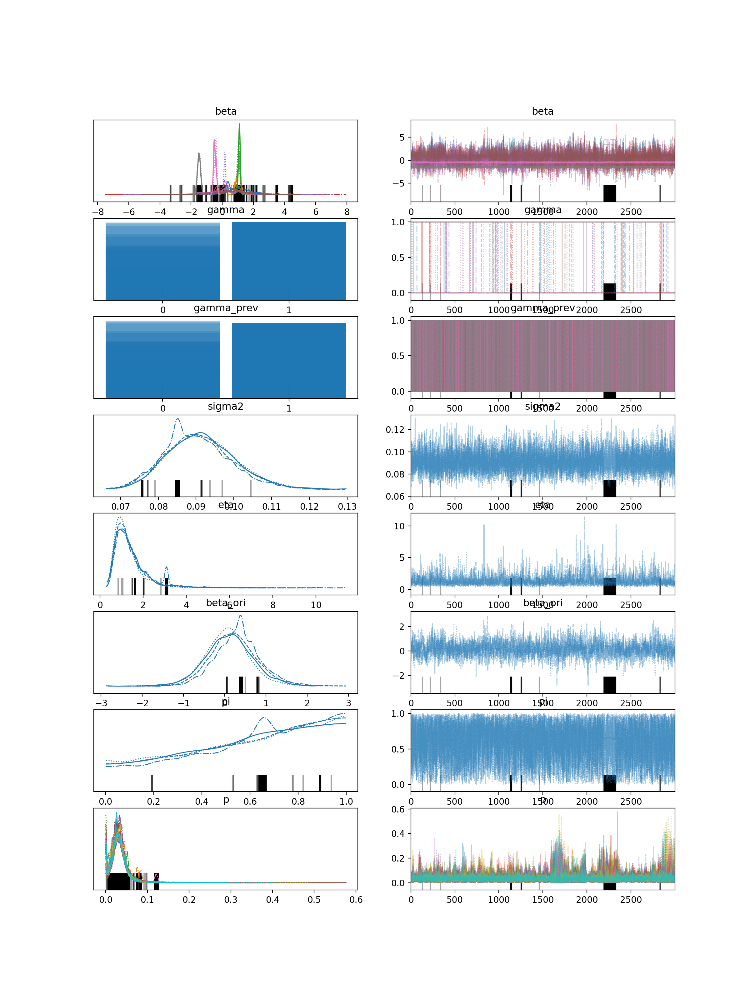

/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


                mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
beta[0]        0.852  1.238  -1.645    3.237      0.247    0.176      24.0   
beta[1]        1.049  0.156   0.728    1.337      0.008    0.006     387.0   
beta[2]        1.065  0.090   0.877    1.211      0.015    0.011      31.0   
beta[3]        0.158  1.212  -2.038    2.567      0.025    0.022    2381.0   
beta[4]        0.210  1.086  -1.822    2.384      0.025    0.066    1640.0   
beta[5]        0.572  1.165  -1.747    2.818      0.171    0.121      46.0   
beta[6]       -0.458  0.086  -0.611   -0.296      0.010    0.007      70.0   
beta[7]       -1.484  0.104  -1.681   -1.287      0.003    0.002     946.0   
gamma[0]       0.697  0.460   0.000    1.000      0.149    0.109       9.0   
gamma[1]       1.000  0.000   1.000    1.000      0.000    0.000   12000.0   
gamma[2]       1.000  0.000   1.000    1.000      0.000    0.000   12000.0   
gamma[3]       0.105  0.307   0.000    1.000      0.066    0.048

In [292]:

# Step 1: Generate simulated data
np.random.seed(42)
N = 3000  # Number of samples
D = 8  # Number of predictors


# Step 2: Define the PyMC model
with pm.Model() as model:
    # Priors
    # Beta for regression coefficients, grouped into classes
    alpha = pm.HalfNormal("alpha", sigma=8.0)  # Dirichlet prior concentration parameter
    #alpha=1
    p = pm.Dirichlet("p", a=pm.math.ones(30) * alpha, shape=30)  # Class probabilities
 #10 0 1 2 3 4 
    S = pm.Categorical("S", p=p, shape=D)# bp=nel shape  1 1 1  # Class assignment for predictors (0-9)
    #[1 3 5 7 9]
    eta = pm.InverseGamma("eta", alpha=4, beta=4)  # Variance for beta_m
    mu_0=pm.Normal("beta_ori",mu=0,sigma=2)
    beta_m = pm.Normal("beta_m", mu=mu_0, sigma=pm.math.sqrt(eta), shape=30)  # Regression coefficients for each class
    
    # Ensure S only indexes valid categories of beta_m
    beta = pm.Deterministic("beta", beta_m[S])  # Map beta based on S
    
    # Sparsity indicator gamma
    pi = pm.Beta("pi", alpha=1, beta=1)  # Probability of gamma=1
    gamma_prev = pm.Bernoulli("gamma_prev", p=0.5, shape=D)  # 初始值
    rho = 0.8  # 控制gamma的平稳性（越接近1越稳定）
    gamma = pm.Bernoulli("gamma", p=rho * gamma_prev + (1 - rho) * pi, shape=D)

    #gamma = pm.Bernoulli("gamma", p=pi, shape=D)

    # Noise variance (sigma^2)
    sigma2 = pm.InverseGamma("sigma2", alpha=4, beta=4)  # Prior for noise variance

    # Observed data likelihood
    mu = pm.math.dot(X_with_intercept, beta * gamma)  # Predicted mean
    y_obs = pm.Normal("y_obs", mu=mu, sigma=pm.math.sqrt(sigma2), observed=y)

    # Inference
    
    trace = pm.sample(N, tune=500, chains=4,step=pm.NUTS(target_accept=0.95), return_inferencedata=True)


# Step 3: Analyze and visualize the results
az.plot_trace(trace, var_names=["beta", "gamma", "gamma_prev","sigma2", "eta", "beta_ori","pi", "p"])
plt.show()
summary=az.summary(trace, var_names=["beta", "gamma","gamma_prev", "sigma2", "eta","beta_ori", "pi", "p"])
print(summary)

<IPython.core.display.Javascript object>


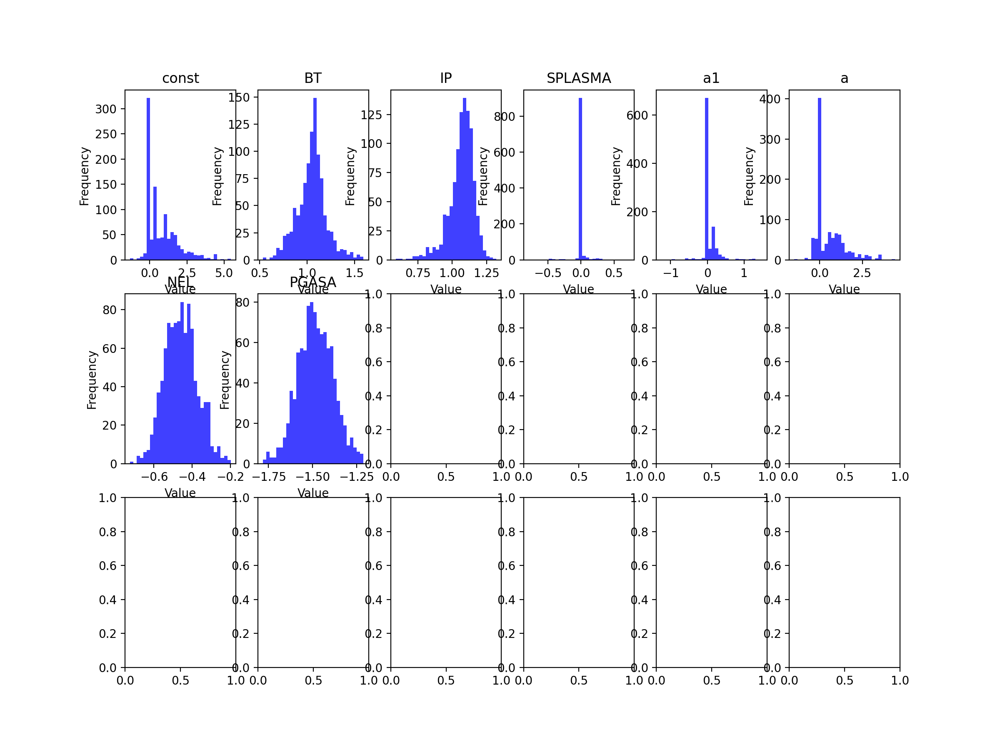

IndexError: index 8 is out of bounds for axis 1 with size 8

In [293]:
# 从后验中随机抽取 10 个样本
num_samples = 1000
posterior_indices = np.random.choice(
    trace.posterior["beta"].stack(samples=["chain", "draw"]).shape[1], 
    size=num_samples, 
    replace=False
)

# 定义新数据
 # 新数据 (10 个样本)

# 存储预测结果
beta_new_look = []
predictions = []
S_new = []
gamma_new=[]
for idx in posterior_indices:
    beta_sample = trace.posterior["beta"].stack(samples=["chain", "draw"]).values[:, idx]
    gamma_sample = trace.posterior["gamma"].stack(samples=["chain", "draw"]).values[:, idx]
    S_sample = trace.posterior["S"].stack(samples=["chain", "draw"]).values[:, idx]
    sigma_sample = np.sqrt(trace.posterior["sigma2"].stack(samples=["chain", "draw"]).values[idx])
    #gamma_binary = (gamma_post_mean > 0.5).astype(int)
    # 计算预测值
    mu_pred = X_with_intercept @ (beta_sample * gamma_sample)  # 预测均值
    y_pred = np.random.normal(mu_pred, sigma_sample, size=X_with_intercept.shape[0])  # 从预测分布采样
    S_new.append(gamma_sample*beta_sample)
    beta_new_look.append(S_sample)
    gamma_new.append(gamma_sample)
    predictions.append(y_pred)
S_new1 = np.array(S_new)
gamma_new = np.array(gamma_new)
fig, axes = plt.subplots(nrows=3, ncols=6, figsize=(12, 9))
axes = axes.flatten()

for i in range(9):
    ax = axes[i]
    # 只考虑 gamma 为 1 的情况
    #filtered_beta = S_new1[:, i][gamma_new[:, i] == 1]
    filtered_beta = S_new1[:, i]
    ax.hist(filtered_beta, bins=30, alpha=0.75, color='blue')
    ax.set_title(f'{X_with_intercept.columns[i]}')
    ax.set_xlabel('Value')
    ax.set_ylabel('Frequency')

plt.tight_layout()
plt.savefig('distribution.png', format='png', dpi=300, transparent=True)
plt.show()
S_mean_new = np.array(S_new).mean(axis=0)
beta_new_look_new = np.array(beta_new_look).mean(axis=0)
gamma_mean = np.array(gamma_new).mean(axis=0) 
gamma_binary = (gamma_mean > 0.5).astype(int)
print(gamma_mean)

predictions = np.array(predictions).T  
pred_mean = predictions.mean(axis=1) 
print(S_mean_new)
print(beta_new_look_new)
SS_res = np.sum((pred_mean - y) ** 2)
SS_tot = np.sum((y - np.mean(y)) ** 2)
R_squared = 1 - (SS_res / SS_tot)
print(f"1000 samples' R² values=: {R_squared:.4f}")

In [295]:
file_path = 'LH_metal_DB_v1.12.csv'  # 替换为你的文件路径
df = pd.read_csv(file_path)
df.loc[:, 'TOK'] = df['TOK'].str.strip()
df['IP']=df['IP'].abs()/1000000
df['BT']=df['BT'].abs()
df['PLTH']=df['PLTH']/1000000
df['NEL']=df['NEL']/1e19


df.loc[:, 'TOK'] = df['TOK'].str.strip()

reference_dict = {
    1.00:  "Hydrogen",
    2.00:  "Deuterium",
    2.50:  "Deuterium and tritium",
    3.00:  "3He or tritium",
    4.00:  "4He",
    14.01: "Nitrogen"
}

# 定义一个函数，用来根据某一观测值PGASA，返回对应的分类名称
def categorize_pgasa(value, ref_dict, tolerance=0.2):
    """
    value: 待分类的数值
    ref_dict: {参考值: 分类名称}
    tolerance: 容忍度，即 |value - 参考值| 需小于等于该值才视为同一类
    """
    # 1) 找到离 value 最近的参考值
    closest_ref = min(ref_dict.keys(), key=lambda x: abs(x - value))
    # 2) 判断两者差值是否在容忍度以内
    if abs(closest_ref - value) <= tolerance:
        return ref_dict[closest_ref]
    else:
        return np.nan  # 或者 "Other"

# 将 categorize_pgasa 应用于 df["PGASA"] 列，生成新的分类列
df["Category"] = df["PGASA"].apply(lambda x: categorize_pgasa(x, reference_dict, tolerance=0.1))




# 假设 subset1 是你的数据框
colors = df['SELEC2024'].map({1: 'red', 0: 'blue'})


# 分类 BT 值
#subset2_2 = df[(ip < 2.6) & (ip >=2.4)&(bt < 3.2) & (bt >=2.8)& (df['Category'] == 'Deuterium')& (df['DIVCON'] == 'VT')]
#df = df.drop(subset2_2.index)

import statsmodels.api as sm
print(df.columns.tolist())

# 指定你想在新 DataFrame 中包含的列
columns_to_include = ['TOK', 'SPLASMA','AMIN','BT','IP','RGEO','PLTH','NEL','PGASA','KAPPA','Q95','AUXHEAT',"DIVCON"]
new_df = df[df['SELEC2024'] == 0][columns_to_include].copy()
mu0 = 4 * np.pi * 1e-7

new_df['BP']=1000000*(mu0 * new_df['IP']) / (new_df['SPLASMA']/(2 * np.pi * new_df['RGEO']))

new_df['PLTH/S/2']=new_df['PLTH']/2
new_df['a1']=new_df['SPLASMA']/(np.pi*new_df['RGEO']*2)
new_df['a']=new_df['AMIN']/new_df['RGEO']
#new_df['PLTH/S/2']=new_df['PLTH']
# 显示新 DataFrame



columns_to_include_for_regre = ['BP','IP','BT','a1','a','SPLASMA','AMIN','RGEO','KAPPA','Q95','PLTH/S/2','NEL','PGASA']
unique_divcon = new_df['DIVCON'].unique()
unique_heating = new_df['AUXHEAT'].unique()
print(unique_heating)
# 2. 向原始 DataFrame 添加新列
for divcon_type in unique_divcon:
    new_df[divcon_type] = (new_df['DIVCON'] == divcon_type).astype(int)
multi_df = new_df[columns_to_include_for_regre].copy()
multi_df = multi_df.apply(np.log)
x = multi_df[['BT','IP','BP','a','a1','NEL','PGASA']] 
print(x.corr())
#x = multi_df[['BT','NEL','PGASA']]
x[unique_divcon] = new_df[unique_divcon]
#x['Xp'] = x[['Xptref','Xpthigh','Xptin']].max(axis=1)
x.drop(['STANDARD'], axis=1, inplace=True)
x.drop(['Xptref','Xptin'], axis=1, inplace=True)
#x['CV'] = x[['CORNER','VT']].max(axis=1)
x.drop(['V5L','HT3','V5','CORNER','HT3R','VT','HT3L',' VERTPLT'], axis=1, inplace=True)

X_with_intercept = sm.add_constant(x)
y=multi_df["PLTH/S/2"]
model = sm.OLS(y, X_with_intercept)
results = model.fit()

# 打印详细统计结果
print(results.summary())
print(unique_divcon)
# 输出系数和标准误差
coefficients = results.params
std_errors = results.bse

labels = X_with_intercept.columns  # 获取变量名
for label, coef, std_err in zip(labels, coefficients, std_errors):
    print(f"{label}: {coef:.3f} ± {std_err:.3f}")
    # 打印 RMSE
y_pred = results.predict(X_with_intercept)  # 预测值
rmse = np.sqrt(np.mean((y - y_pred) ** 2))  # 计算 RMSE

print(f"RMSE: {rmse:.3f}")
# 获取 90% 置信区间
conf_int_90 = results.conf_int(alpha=0.1)


print("\n90% 置信区间：\n", conf_int_90)


['TOK', 'SHOT', 'TIME', 'PHASE', 'PGASA', 'RGEO', 'AMIN', 'KAPPA', 'SPLASMA', 'CONFIG', 'IGRADB', 'WALMAT', 'DIVMAT', 'LIMMAT', 'EVAP', 'BT', 'IP', 'Q95', 'NEL', 'ZEFF', 'DIVNAME', 'PL', 'PLTH', 'PFLOSS', 'PRADCORE', 'DIVCON', 'FRACNMIN', 'LHTIME', 'AUXHEAT', 'SELEC2024', 'Category']
['IC' 'EC' 'NBEC' 'ECIC' 'NB' 'NBIC' nan]
             BT        IP        BP         a        a1       NEL     PGASA
BT     1.000000 -0.083486  0.815630  0.076417 -0.663847  0.755139  0.267119
IP    -0.083486  1.000000  0.358075  0.332771  0.747601 -0.285310  0.103753
BP     0.815630  0.358075  1.000000  0.190238 -0.352414  0.632469  0.164140
a      0.076417  0.332771  0.190238  1.000000  0.198219  0.044586  0.318252
a1    -0.663847  0.747601 -0.352414  0.198219  1.000000 -0.735851 -0.012763
NEL    0.755139 -0.285310  0.632469  0.044586 -0.735851  1.000000 -0.118327
PGASA  0.267119  0.103753  0.164140  0.318252 -0.012763 -0.118327  1.000000
                            OLS Regression Results               

/var/folders/5g/7cwc8n193kz9d4h5lc3ky_0c0000gn/T/ipykernel_9077/3189301646.py:80: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x[unique_divcon] = new_df[unique_divcon]
/var/folders/5g/7cwc8n193kz9d4h5lc3ky_0c0000gn/T/ipykernel_9077/3189301646.py:80: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x[unique_divcon] = new_df[unique_divcon]
/var/folders/5g/7cwc8n193kz9d4h5lc3ky_0c0000gn/T/ipykernel_9077/3189301646.py:80: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.


Multiprocess sampling (4 chains in 4 jobs)
CompoundStep
>NUTS: [alpha, p, eta, beta_ori, beta_m, pi, sigma2]
>CategoricalGibbsMetropolis: [S]
>BinaryGibbsMetropolis: [gamma_prev, gamma]


Output()

Sampling 4 chains for 500 tune and 3_000 draw iterations (2_000 + 12_000 draws total) took 371 seconds.
/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
There were 35 divergences after tuning. Increase `target_accept` or reparameterize.
Chain 0 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 1 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


<IPython.core.display.Javascript object>


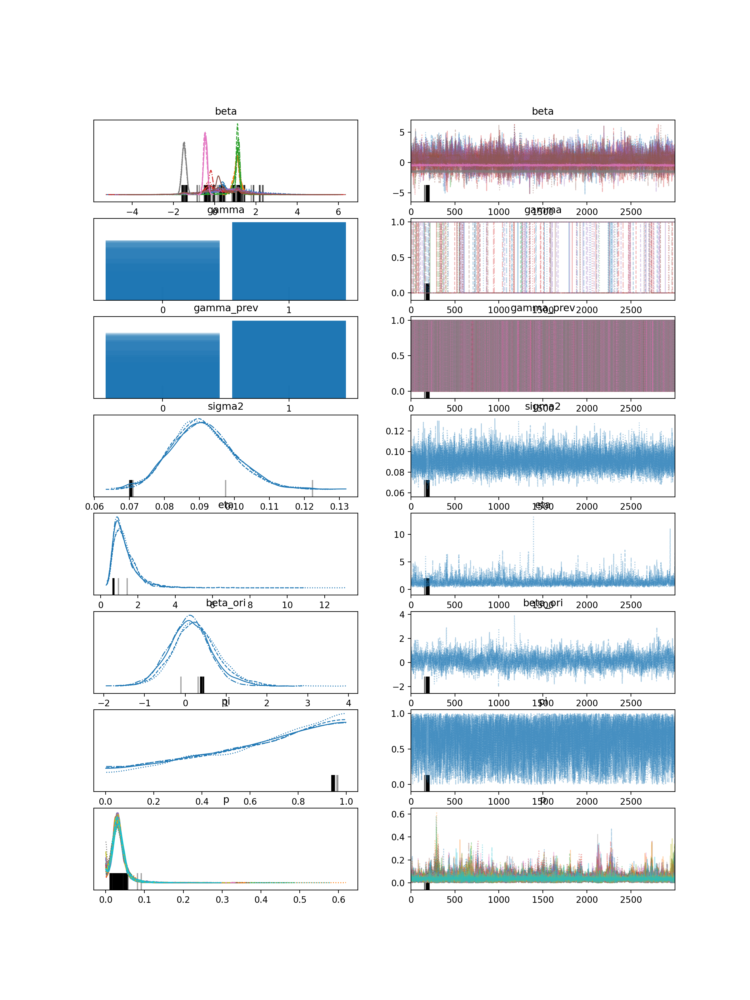

/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


                mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
beta[0]        0.775  1.162  -1.552    3.044      0.168    0.120      44.0   
beta[1]        1.082  0.173   0.732    1.413      0.009    0.007     302.0   
beta[2]        1.011  0.416   0.073    1.395      0.041    0.029      83.0   
beta[3]        0.172  1.037  -1.811    2.091      0.043    0.031     520.0   
beta[4]        0.608  1.111  -1.630    2.679      0.119    0.084      93.0   
beta[5]        0.265  1.083  -1.888    2.244      0.038    0.027     682.0   
beta[6]       -0.449  0.086  -0.603   -0.287      0.004    0.003     516.0   
beta[7]       -1.485  0.105  -1.684   -1.293      0.002    0.002    1987.0   
gamma[0]       0.725  0.446   0.000    1.000      0.050    0.036      79.0   
gamma[1]       1.000  0.000   1.000    1.000      0.000    0.000   12000.0   
gamma[2]       0.961  0.193   1.000    1.000      0.021    0.015      84.0   
gamma[3]       0.423  0.494   0.000    1.000      0.074    0.053

In [298]:

# Step 1: Generate simulated data
np.random.seed(42)
N = 3000  # Number of samples
D = 8  # Number of predictors


# Step 2: Define the PyMC model
with pm.Model() as model:
    # Priors
    # Beta for regression coefficients, grouped into classes
    alpha = pm.HalfNormal("alpha", sigma=8.0)  # Dirichlet prior concentration parameter
    #alpha=1
    p = pm.Dirichlet("p", a=pm.math.ones(30) * alpha, shape=30)  # Class probabilities
 #10 0 1 2 3 4 
    S = pm.Categorical("S", p=p, shape=D)# bp=nel shape  1 1 1  # Class assignment for predictors (0-9)
    #[1 3 5 7 9]
    eta = pm.InverseGamma("eta", alpha=4, beta=4)  # Variance for beta_m
    mu_0=pm.Normal("beta_ori",mu=0,sigma=2)
    beta_m = pm.Normal("beta_m", mu=mu_0, sigma=pm.math.sqrt(eta), shape=30)  # Regression coefficients for each class
    
    # Ensure S only indexes valid categories of beta_m
    beta = pm.Deterministic("beta", beta_m[S])  # Map beta based on S
    
    # Sparsity indicator gamma
    pi = pm.Beta("pi", alpha=1, beta=1)  # Probability of gamma=1
    gamma_prev = pm.Bernoulli("gamma_prev", p=0.5, shape=D)  # 初始值
    rho = 0.8  # 控制gamma的平稳性（越接近1越稳定）
    gamma = pm.Bernoulli("gamma", p=rho * gamma_prev + (1 - rho) * pi, shape=D)

    #gamma = pm.Bernoulli("gamma", p=pi, shape=D)

    # Noise variance (sigma^2)
    sigma2 = pm.InverseGamma("sigma2", alpha=4, beta=4)  # Prior for noise variance

    # Observed data likelihood
    mu = pm.math.dot(X_with_intercept, beta * gamma)  # Predicted mean
    y_obs = pm.Normal("y_obs", mu=mu, sigma=pm.math.sqrt(sigma2), observed=y)

    # Inference
    
    trace = pm.sample(N, tune=500, chains=4,step=pm.NUTS(target_accept=0.95), return_inferencedata=True)


# Step 3: Analyze and visualize the results
az.plot_trace(trace, var_names=["beta", "gamma", "gamma_prev","sigma2", "eta", "beta_ori","pi", "p"])
plt.show()
summary=az.summary(trace, var_names=["beta", "gamma","gamma_prev", "sigma2", "eta","beta_ori", "pi", "p"])
print(summary)

<IPython.core.display.Javascript object>


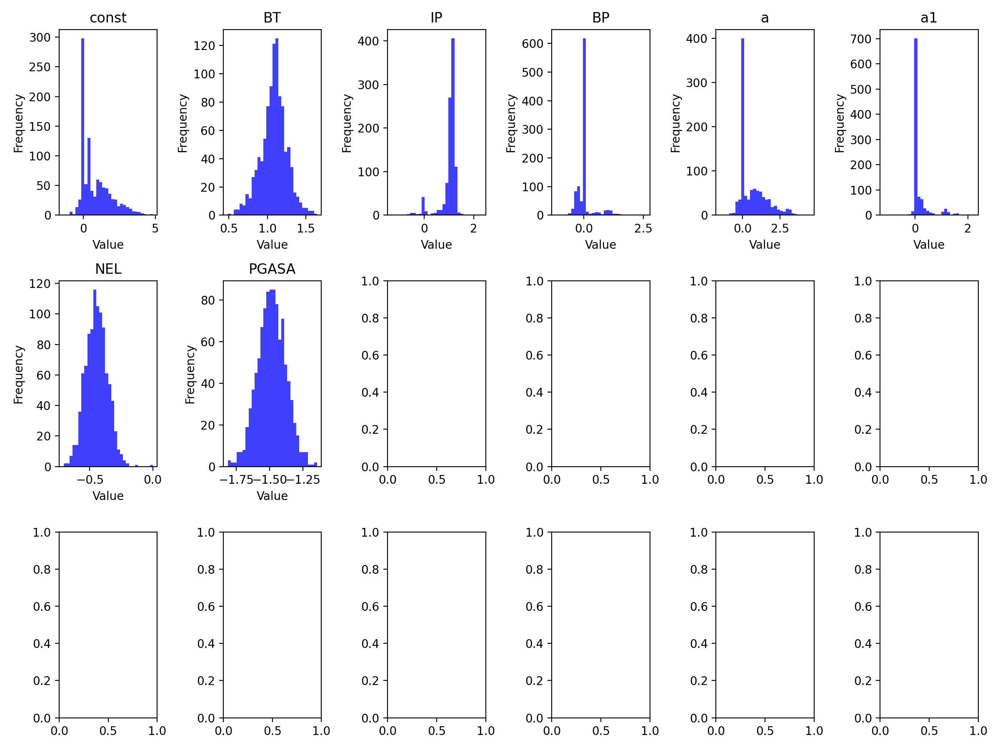

[0.73  1.    0.963 0.403 0.621 0.323 0.999 1.   ]
[ 0.83897102  1.08337875  1.00544922  0.03147537  0.66072372  0.14787948
 -0.44513062 -1.48317554]
[13.525 13.602 14.865 14.596 15.334 15.096 12.824 14.931]
1000 samples' R² values=: 0.8636


In [299]:
# 从后验中随机抽取 10 个样本
num_samples = 1000
posterior_indices = np.random.choice(
    trace.posterior["beta"].stack(samples=["chain", "draw"]).shape[1], 
    size=num_samples, 
    replace=False
)

# 定义新数据
 # 新数据 (10 个样本)

# 存储预测结果
beta_new_look = []
predictions = []
S_new = []
gamma_new=[]
for idx in posterior_indices:
    beta_sample = trace.posterior["beta"].stack(samples=["chain", "draw"]).values[:, idx]
    gamma_sample = trace.posterior["gamma"].stack(samples=["chain", "draw"]).values[:, idx]
    S_sample = trace.posterior["S"].stack(samples=["chain", "draw"]).values[:, idx]
    sigma_sample = np.sqrt(trace.posterior["sigma2"].stack(samples=["chain", "draw"]).values[idx])
    #gamma_binary = (gamma_post_mean > 0.5).astype(int)
    # 计算预测值
    mu_pred = X_with_intercept @ (beta_sample * gamma_sample)  # 预测均值
    y_pred = np.random.normal(mu_pred, sigma_sample, size=X_with_intercept.shape[0])  # 从预测分布采样
    S_new.append(gamma_sample*beta_sample)
    beta_new_look.append(S_sample)
    gamma_new.append(gamma_sample)
    predictions.append(y_pred)
S_new1 = np.array(S_new)
gamma_new = np.array(gamma_new)
fig, axes = plt.subplots(nrows=3, ncols=6, figsize=(12, 9))
axes = axes.flatten()

for i in range(8):
    ax = axes[i]
    # 只考虑 gamma 为 1 的情况
    #filtered_beta = S_new1[:, i][gamma_new[:, i] == 1]
    filtered_beta = S_new1[:, i]
    ax.hist(filtered_beta, bins=30, alpha=0.75, color='blue')
    ax.set_title(f'{X_with_intercept.columns[i]}')
    ax.set_xlabel('Value')
    ax.set_ylabel('Frequency')

plt.tight_layout()
plt.savefig('distribution.png', format='png', dpi=300, transparent=True)
plt.show()
S_mean_new = np.array(S_new).mean(axis=0)
beta_new_look_new = np.array(beta_new_look).mean(axis=0)
gamma_mean = np.array(gamma_new).mean(axis=0) 
gamma_binary = (gamma_mean > 0.5).astype(int)
print(gamma_mean)

predictions = np.array(predictions).T  
pred_mean = predictions.mean(axis=1) 
print(S_mean_new)
print(beta_new_look_new)
SS_res = np.sum((pred_mean - y) ** 2)
SS_tot = np.sum((y - np.mean(y)) ** 2)
R_squared = 1 - (SS_res / SS_tot)
print(f"1000 samples' R² values=: {R_squared:.4f}")

In [300]:

trace.to_netcdf("low_branch_trace_no_PLASMA.nc")

# 查看并保存summary
summary_df = az.summary(trace, var_names=["beta", "gamma","gamma_prev", "sigma2", "beta_ori","eta", "pi", "p"])
print(summary_df)
summary_df.to_csv("low_branch_trace_no_PLASMA.csv")

/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


                mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
beta[0]        0.775  1.162  -1.552    3.044      0.168    0.120      44.0   
beta[1]        1.082  0.173   0.732    1.413      0.009    0.007     302.0   
beta[2]        1.011  0.416   0.073    1.395      0.041    0.029      83.0   
beta[3]        0.172  1.037  -1.811    2.091      0.043    0.031     520.0   
beta[4]        0.608  1.111  -1.630    2.679      0.119    0.084      93.0   
beta[5]        0.265  1.083  -1.888    2.244      0.038    0.027     682.0   
beta[6]       -0.449  0.086  -0.603   -0.287      0.004    0.003     516.0   
beta[7]       -1.485  0.105  -1.684   -1.293      0.002    0.002    1987.0   
gamma[0]       0.725  0.446   0.000    1.000      0.050    0.036      79.0   
gamma[1]       1.000  0.000   1.000    1.000      0.000    0.000   12000.0   
gamma[2]       0.961  0.193   1.000    1.000      0.021    0.015      84.0   
gamma[3]       0.423  0.494   0.000    1.000      0.074    0.053

Multiprocess sampling (4 chains in 4 jobs)
CompoundStep
>NUTS: [alpha, p, eta, beta_ori, beta_m, pi, sigma2]
>CategoricalGibbsMetropolis: [S]
>BinaryGibbsMetropolis: [gamma_prev, gamma]


Output()

Sampling 4 chains for 500 tune and 3_000 draw iterations (2_000 + 12_000 draws total) took 375 seconds.
/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
There were 89 divergences after tuning. Increase `target_accept` or reparameterize.
Chain 0 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


<IPython.core.display.Javascript object>


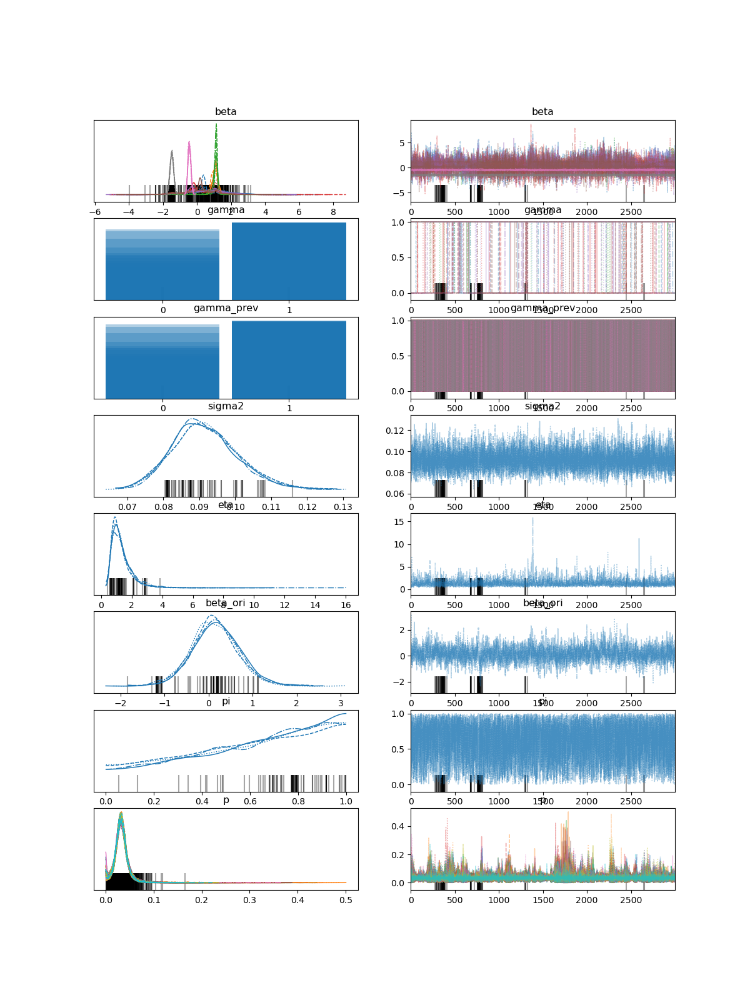

/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


                mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
beta[0]        0.641  1.162  -1.601    2.921      0.192    0.137      34.0   
beta[1]        1.057  0.171   0.721    1.381      0.012    0.008     219.0   
beta[2]        0.980  0.499  -0.205    1.429      0.044    0.031     125.0   
beta[3]        0.214  1.103  -1.845    2.308      0.046    0.033     532.0   
beta[4]        0.449  1.131  -1.684    2.577      0.160    0.114      49.0   
beta[5]        0.286  1.050  -1.842    2.201      0.049    0.035     384.0   
beta[6]       -0.449  0.088  -0.605   -0.279      0.005    0.003     391.0   
beta[7]       -1.479  0.107  -1.666   -1.265      0.004    0.003     584.0   
gamma[0]       0.623  0.485   0.000    1.000      0.109    0.079      20.0   
gamma[1]       1.000  0.000   1.000    1.000      0.000    0.000   12000.0   
gamma[2]       0.912  0.283   0.000    1.000      0.043    0.030      44.0   
gamma[3]       0.307  0.461   0.000    1.000      0.067    0.048

In [310]:

# Step 1: Generate simulated data
np.random.seed(42)
N = 3000  # Number of samples
D = 8  # Number of predictors


# Step 2: Define the PyMC model
with pm.Model() as model:
    # Priors
    # Beta for regression coefficients, grouped into classes
    alpha = pm.HalfNormal("alpha", sigma=16.0)  # Dirichlet prior concentration parameter
    #alpha=1
    p = pm.Dirichlet("p", a=pm.math.ones(30) * alpha, shape=30)  # Class probabilities
 #10 0 1 2 3 4 
    S = pm.Categorical("S", p=p, shape=D)# bp=nel shape  1 1 1  # Class assignment for predictors (0-9)
    #[1 3 5 7 9]
    eta = pm.InverseGamma("eta", alpha=4, beta=4)  # Variance for beta_m
    mu_0=pm.Normal("beta_ori",mu=0,sigma=2)
    beta_m = pm.Normal("beta_m", mu=mu_0, sigma=pm.math.sqrt(eta), shape=30)  # Regression coefficients for each class
    
    # Ensure S only indexes valid categories of beta_m
    beta = pm.Deterministic("beta", beta_m[S])  # Map beta based on S
    
    # Sparsity indicator gamma
    pi = pm.Beta("pi", alpha=1, beta=1)  # Probability of gamma=1
    gamma_prev = pm.Bernoulli("gamma_prev", p=0.5, shape=D)  # 初始值
    rho = 0.8  # 控制gamma的平稳性（越接近1越稳定）
    gamma = pm.Bernoulli("gamma", p=rho * gamma_prev + (1 - rho) * pi, shape=D)

    #gamma = pm.Bernoulli("gamma", p=pi, shape=D)

    # Noise variance (sigma^2)
    sigma2 = pm.InverseGamma("sigma2", alpha=4, beta=4)  # Prior for noise variance

    # Observed data likelihood
    mu = pm.math.dot(X_with_intercept, beta * gamma)  # Predicted mean
    y_obs = pm.Normal("y_obs", mu=mu, sigma=pm.math.sqrt(sigma2), observed=y)

    # Inference
    
    trace = pm.sample(N, tune=500, chains=4,step=pm.NUTS(target_accept=0.95), return_inferencedata=True)


# Step 3: Analyze and visualize the results
az.plot_trace(trace, var_names=["beta", "gamma", "gamma_prev","sigma2", "eta", "beta_ori","pi", "p"])
plt.show()
summary=az.summary(trace, var_names=["beta", "gamma","gamma_prev", "sigma2", "eta","beta_ori", "pi", "p"])
print(summary)

<IPython.core.display.Javascript object>


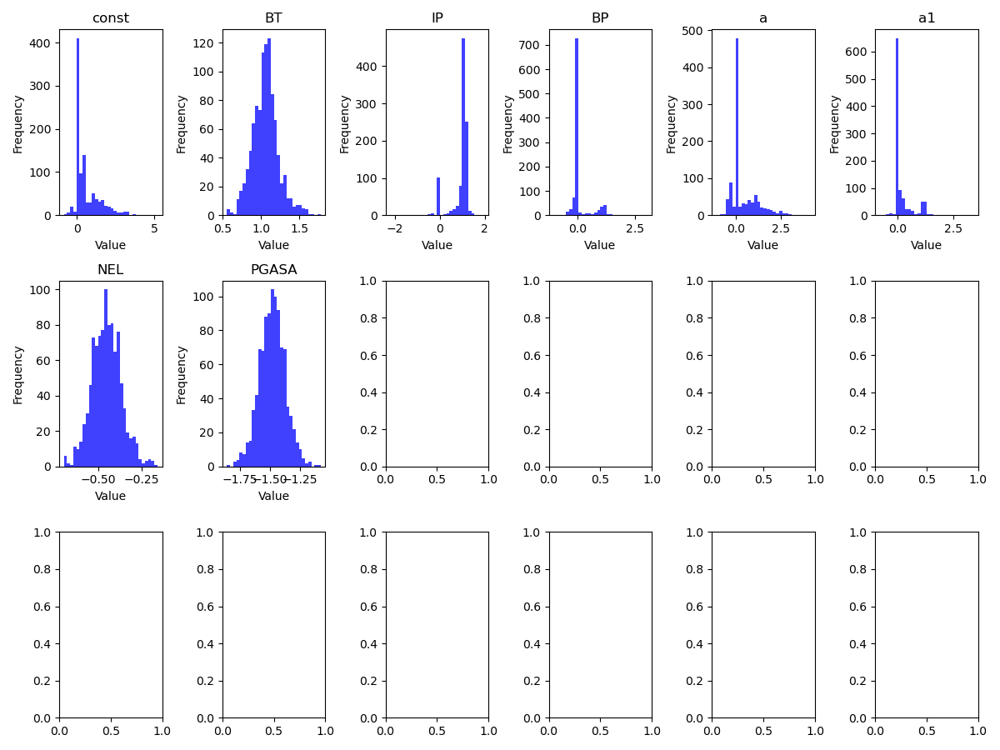

[0.606 1.    0.9   0.294 0.544 0.373 1.    1.   ]
[ 0.5880084   1.05703128  0.93930197  0.11941294  0.3832401   0.20180518
 -0.45305597 -1.48126226]
[14.535 12.757 15.232 14.437 14.024 13.5   14.335 13.245]
1000 samples' R² values=: 0.8623


In [311]:
# 从后验中随机抽取 10 个样本
num_samples = 1000
posterior_indices = np.random.choice(
    trace.posterior["beta"].stack(samples=["chain", "draw"]).shape[1], 
    size=num_samples, 
    replace=False
)

# 定义新数据
 # 新数据 (10 个样本)

# 存储预测结果
beta_new_look = []
predictions = []
S_new = []
gamma_new=[]
for idx in posterior_indices:
    beta_sample = trace.posterior["beta"].stack(samples=["chain", "draw"]).values[:, idx]
    gamma_sample = trace.posterior["gamma"].stack(samples=["chain", "draw"]).values[:, idx]
    S_sample = trace.posterior["S"].stack(samples=["chain", "draw"]).values[:, idx]
    sigma_sample = np.sqrt(trace.posterior["sigma2"].stack(samples=["chain", "draw"]).values[idx])
    #gamma_binary = (gamma_post_mean > 0.5).astype(int)
    # 计算预测值
    mu_pred = X_with_intercept @ (beta_sample * gamma_sample)  # 预测均值
    y_pred = np.random.normal(mu_pred, sigma_sample, size=X_with_intercept.shape[0])  # 从预测分布采样
    S_new.append(gamma_sample*beta_sample)
    beta_new_look.append(S_sample)
    gamma_new.append(gamma_sample)
    predictions.append(y_pred)
S_new1 = np.array(S_new)
gamma_new = np.array(gamma_new)
fig, axes = plt.subplots(nrows=3, ncols=6, figsize=(12, 9))
axes = axes.flatten()

for i in range(8):
    ax = axes[i]
    # 只考虑 gamma 为 1 的情况
    #filtered_beta = S_new1[:, i][gamma_new[:, i] == 1]
    filtered_beta = S_new1[:, i]
    ax.hist(filtered_beta, bins=30, alpha=0.75, color='blue')
    ax.set_title(f'{X_with_intercept.columns[i]}')
    ax.set_xlabel('Value')
    ax.set_ylabel('Frequency')

plt.tight_layout()
plt.savefig('distribution.png', format='png', dpi=300, transparent=True)
plt.show()
S_mean_new = np.array(S_new).mean(axis=0)
beta_new_look_new = np.array(beta_new_look).mean(axis=0)
gamma_mean = np.array(gamma_new).mean(axis=0) 
gamma_binary = (gamma_mean > 0.5).astype(int)
print(gamma_mean)

predictions = np.array(predictions).T  
pred_mean = predictions.mean(axis=1) 
print(S_mean_new)
print(beta_new_look_new)
SS_res = np.sum((pred_mean - y) ** 2)
SS_tot = np.sum((y - np.mean(y)) ** 2)
R_squared = 1 - (SS_res / SS_tot)
print(f"1000 samples' R² values=: {R_squared:.4f}")

In [312]:

trace.to_netcdf("low_branch_trace_no_PLASMA2.nc")

# 查看并保存summary
summary_df = az.summary(trace, var_names=["beta", "gamma","gamma_prev", "sigma2", "beta_ori","eta", "pi", "p"])
print(summary_df)
summary_df.to_csv("low_branch_trace_no_PLASMA2.csv")

/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


                mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
beta[0]        0.641  1.162  -1.601    2.921      0.192    0.137      34.0   
beta[1]        1.057  0.171   0.721    1.381      0.012    0.008     219.0   
beta[2]        0.980  0.499  -0.205    1.429      0.044    0.031     125.0   
beta[3]        0.214  1.103  -1.845    2.308      0.046    0.033     532.0   
beta[4]        0.449  1.131  -1.684    2.577      0.160    0.114      49.0   
beta[5]        0.286  1.050  -1.842    2.201      0.049    0.035     384.0   
beta[6]       -0.449  0.088  -0.605   -0.279      0.005    0.003     391.0   
beta[7]       -1.479  0.107  -1.666   -1.265      0.004    0.003     584.0   
gamma[0]       0.623  0.485   0.000    1.000      0.109    0.079      20.0   
gamma[1]       1.000  0.000   1.000    1.000      0.000    0.000   12000.0   
gamma[2]       0.912  0.283   0.000    1.000      0.043    0.030      44.0   
gamma[3]       0.307  0.461   0.000    1.000      0.067    0.048

In [313]:
file_path = 'LH_metal_DB_v1.12.csv'  # 替换为你的文件路径
df = pd.read_csv(file_path)
df.loc[:, 'TOK'] = df['TOK'].str.strip()
df['IP']=df['IP'].abs()/1000000
df['BT']=df['BT'].abs()
df['PLTH']=df['PLTH']/1000000
df['NEL']=df['NEL']/1e19


df.loc[:, 'TOK'] = df['TOK'].str.strip()

reference_dict = {
    1.00:  "Hydrogen",
    2.00:  "Deuterium",
    2.50:  "Deuterium and tritium",
    3.00:  "3He or tritium",
    4.00:  "4He",
    14.01: "Nitrogen"
}

# 定义一个函数，用来根据某一观测值PGASA，返回对应的分类名称
def categorize_pgasa(value, ref_dict, tolerance=0.2):
    """
    value: 待分类的数值
    ref_dict: {参考值: 分类名称}
    tolerance: 容忍度，即 |value - 参考值| 需小于等于该值才视为同一类
    """
    # 1) 找到离 value 最近的参考值
    closest_ref = min(ref_dict.keys(), key=lambda x: abs(x - value))
    # 2) 判断两者差值是否在容忍度以内
    if abs(closest_ref - value) <= tolerance:
        return ref_dict[closest_ref]
    else:
        return np.nan  # 或者 "Other"

# 将 categorize_pgasa 应用于 df["PGASA"] 列，生成新的分类列
df["Category"] = df["PGASA"].apply(lambda x: categorize_pgasa(x, reference_dict, tolerance=0.1))




# 假设 subset1 是你的数据框
colors = df['SELEC2024'].map({1: 'red', 0: 'blue'})


# 分类 BT 值
#subset2_2 = df[(ip < 2.6) & (ip >=2.4)&(bt < 3.2) & (bt >=2.8)& (df['Category'] == 'Deuterium')& (df['DIVCON'] == 'VT')]
#df = df.drop(subset2_2.index)

import statsmodels.api as sm
print(df.columns.tolist())

# 指定你想在新 DataFrame 中包含的列
columns_to_include = ['TOK', 'SPLASMA','AMIN','BT','IP','RGEO','PLTH','NEL','PGASA','KAPPA','Q95','AUXHEAT',"DIVCON"]
new_df = df[df['SELEC2024'] == 0][columns_to_include].copy()
mu0 = 4 * np.pi * 1e-7

new_df['BP']=1000000*(mu0 * new_df['IP']) / (new_df['SPLASMA']/(2 * np.pi * new_df['RGEO']))

new_df['PLTH/S/2']=new_df['PLTH']/2
new_df['a1']=new_df['SPLASMA']/(np.pi*new_df['RGEO']*2)
new_df['a']=new_df['AMIN']/new_df['RGEO']
#new_df['PLTH/S/2']=new_df['PLTH']
# 显示新 DataFrame



columns_to_include_for_regre = ['BP','IP','BT','a','AMIN','RGEO','KAPPA','Q95','PLTH/S/2','NEL','PGASA']
unique_divcon = new_df['DIVCON'].unique()
unique_heating = new_df['AUXHEAT'].unique()
print(unique_heating)
# 2. 向原始 DataFrame 添加新列
for divcon_type in unique_divcon:
    new_df[divcon_type] = (new_df['DIVCON'] == divcon_type).astype(int)
multi_df = new_df[columns_to_include_for_regre].copy()
multi_df = multi_df.apply(np.log)
x = multi_df[['BT','IP','NEL','PGASA']] 
#x = multi_df[['BT','NEL','PGASA']]
x[unique_divcon] = new_df[unique_divcon]
#x['Xp'] = x[['Xptref','Xpthigh','Xptin']].max(axis=1)
x.drop(['STANDARD'], axis=1, inplace=True)
#x.drop(['Xptref','Xptin'], axis=1, inplace=True)
#x['CV'] = x[['CORNER','VT']].max(axis=1)
#x.drop(['V5L','HT3'], axis=1, inplace=True)

X_with_intercept = sm.add_constant(x)
y=multi_df["PLTH/S/2"]
model = sm.OLS(y, X_with_intercept)
results = model.fit()

# 打印详细统计结果
print(results.summary())
print(unique_divcon)
# 输出系数和标准误差
coefficients = results.params
std_errors = results.bse

labels = X_with_intercept.columns  # 获取变量名
for label, coef, std_err in zip(labels, coefficients, std_errors):
    print(f"{label}: {coef:.3f} ± {std_err:.3f}")
    # 打印 RMSE
y_pred = results.predict(X_with_intercept)  # 预测值
rmse = np.sqrt(np.mean((y - y_pred) ** 2))  # 计算 RMSE

print(f"RMSE: {rmse:.3f}")
# 获取 90% 置信区间
conf_int_90 = results.conf_int(alpha=0.1)


print("\n90% 置信区间：\n", conf_int_90)


['TOK', 'SHOT', 'TIME', 'PHASE', 'PGASA', 'RGEO', 'AMIN', 'KAPPA', 'SPLASMA', 'CONFIG', 'IGRADB', 'WALMAT', 'DIVMAT', 'LIMMAT', 'EVAP', 'BT', 'IP', 'Q95', 'NEL', 'ZEFF', 'DIVNAME', 'PL', 'PLTH', 'PFLOSS', 'PRADCORE', 'DIVCON', 'FRACNMIN', 'LHTIME', 'AUXHEAT', 'SELEC2024', 'Category']
['IC' 'EC' 'NBEC' 'ECIC' 'NB' 'NBIC' nan]
                            OLS Regression Results                            
Dep. Variable:               PLTH/S/2   R-squared:                       0.888
Model:                            OLS   Adj. R-squared:                  0.880
Method:                 Least Squares   F-statistic:                     108.6
Date:                Fri, 18 Apr 2025   Prob (F-statistic):           3.83e-83
Time:                        15:45:03   Log-Likelihood:                 30.686
No. Observations:                 207   AIC:                            -31.37
Df Residuals:                     192   BIC:                             18.62
Df Model:                          14    

/var/folders/5g/7cwc8n193kz9d4h5lc3ky_0c0000gn/T/ipykernel_9077/320255815.py:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x[unique_divcon] = new_df[unique_divcon]
/var/folders/5g/7cwc8n193kz9d4h5lc3ky_0c0000gn/T/ipykernel_9077/320255815.py:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x[unique_divcon] = new_df[unique_divcon]
/var/folders/5g/7cwc8n193kz9d4h5lc3ky_0c0000gn/T/ipykernel_9077/320255815.py:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

Multiprocess sampling (4 chains in 4 jobs)
CompoundStep
>NUTS: [alpha, p, eta, beta_ori, beta_m, pi, sigma2]
>CategoricalGibbsMetropolis: [S]
>BinaryGibbsMetropolis: [gamma_prev, gamma]


Output()

Sampling 4 chains for 500 tune and 3_000 draw iterations (2_000 + 12_000 draws total) took 355 seconds.
/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
Chain 2 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


<IPython.core.display.Javascript object>


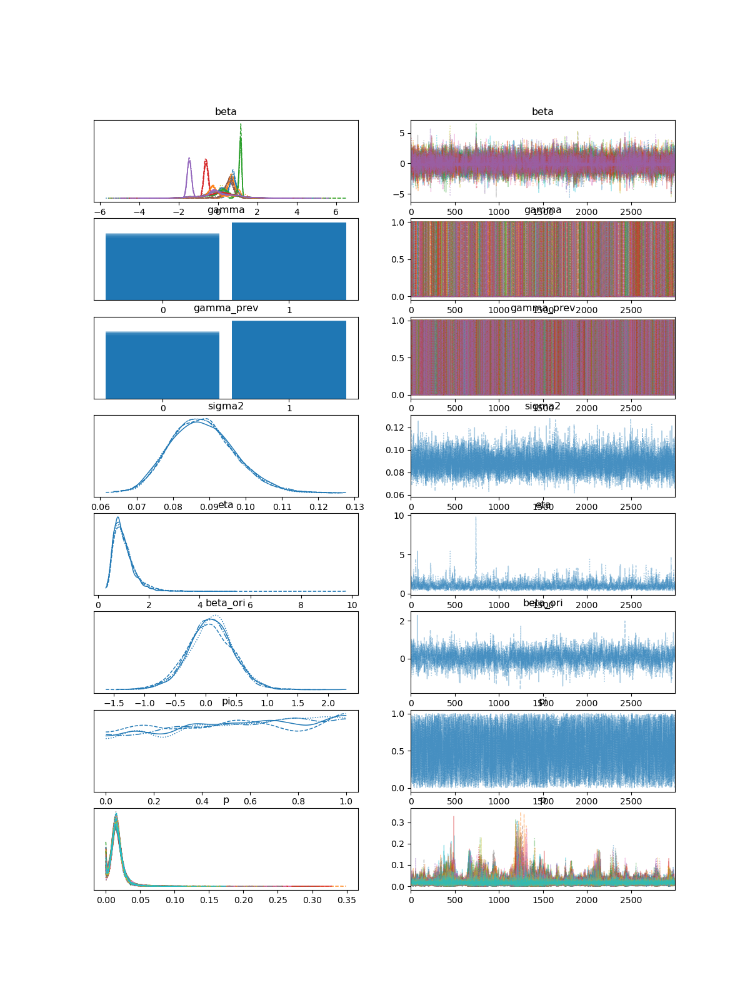

/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


          mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
beta[0]  0.713  0.295   0.256    1.165      0.031    0.022     143.0   
beta[1]  0.721  0.275   0.255    1.265      0.035    0.027      77.0   
beta[2]  1.108  0.107   0.873    1.264      0.013    0.009      96.0   
beta[3] -0.608  0.110  -0.819   -0.404      0.004    0.003     657.0   
beta[4] -1.458  0.108  -1.661   -1.253      0.002    0.002    1920.0   
...        ...    ...     ...      ...        ...      ...       ...   
p[55]    0.017  0.010   0.000    0.030      0.000    0.000    1730.0   
p[56]    0.017  0.012   0.000    0.031      0.000    0.000    1617.0   
p[57]    0.017  0.011   0.000    0.031      0.000    0.000    1410.0   
p[58]    0.017  0.010   0.000    0.030      0.000    0.000    2050.0   
p[59]    0.017  0.009   0.000    0.031      0.000    0.000    1702.0   

         ess_tail  r_hat  
beta[0]      79.0   1.04  
beta[1]      57.0   1.05  
beta[2]     105.0   1.05  
beta[3]    2014.0   1.01  


In [339]:

# Step 1: Generate simulated data
np.random.seed(42)
N = 3000  # Number of samples
D = 15  # Number of predictors


# Step 2: Define the PyMC model
with pm.Model() as model:
    # Priors
    # Beta for regression coefficients, grouped into classes
    alpha = pm.HalfNormal("alpha", sigma=8.0)  # Dirichlet prior concentration parameter
    #alpha=1
    p = pm.Dirichlet("p", a=pm.math.ones(60) * alpha, shape=60)  # Class probabilities
 #10 0 1 2 3 4 
    S = pm.Categorical("S", p=p, shape=D)# bp=nel shape  1 1 1  # Class assignment for predictors (0-9)
    #[1 3 5 7 9]
    eta = pm.InverseGamma("eta", alpha=4, beta=4)  # Variance for beta_m
    mu_0=pm.Normal("beta_ori",mu=0,sigma=2)
    beta_m = pm.Normal("beta_m", mu=mu_0, sigma=pm.math.sqrt(eta), shape=60)  # Regression coefficients for each class
    
    # Ensure S only indexes valid categories of beta_m
    beta = pm.Deterministic("beta", beta_m[S])  # Map beta based on S
    
    # Sparsity indicator gamma
    pi = pm.Beta("pi", alpha=1, beta=1)  # Probability of gamma=1
    gamma_prev = pm.Bernoulli("gamma_prev", p=0.5, shape=D)  # 初始值
    rho = 0.9  # 控制gamma的平稳性（越接近1越稳定）
    gamma = pm.Bernoulli("gamma", p=rho * gamma_prev + (1 - rho) * pi, shape=D)

    #gamma = pm.Bernoulli("gamma", p=pi, shape=D)

    # Noise variance (sigma^2)
    sigma2 = pm.InverseGamma("sigma2", alpha=4, beta=4)  # Prior for noise variance

    # Observed data likelihood
    mu = pm.math.dot(X_with_intercept, beta * gamma)  # Predicted mean
    y_obs = pm.Normal("y_obs", mu=mu, sigma=pm.math.sqrt(sigma2), observed=y)

    # Inference
    
    trace = pm.sample(N, tune=500, chains=4,step=pm.NUTS(target_accept=0.95), return_inferencedata=True)


# Step 3: Analyze and visualize the results
az.plot_trace(trace, var_names=["beta", "gamma", "gamma_prev","sigma2", "eta", "beta_ori","pi", "p"])
plt.show()
summary=az.summary(trace, var_names=["beta", "gamma","gamma_prev", "sigma2", "eta","beta_ori", "pi", "p"])
print(summary)

<IPython.core.display.Javascript object>


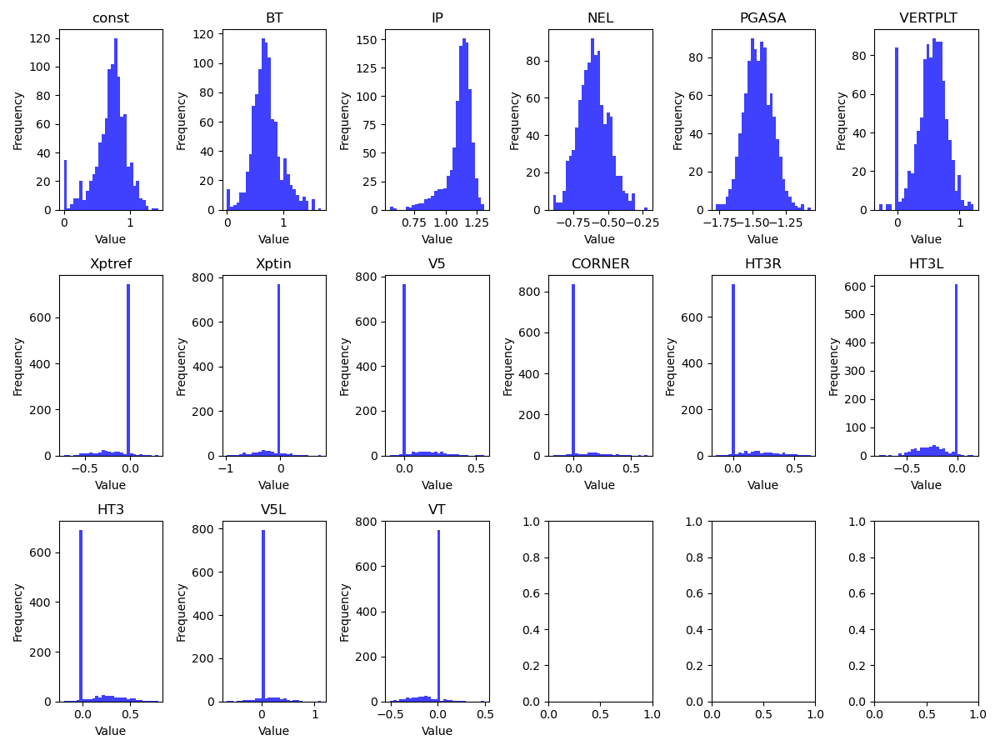

[0.965 0.987 1.    1.    1.    0.916 0.267 0.25  0.239 0.175 0.262 0.402
 0.316 0.218 0.246]
[ 0.71059638  0.70836942  1.11090376 -0.60585478 -1.45580989  0.52403637
 -0.0603633  -0.06074214  0.04200294  0.02731041  0.06213967 -0.10864197
  0.08962979  0.03411188 -0.0392463 ]
[28.867 30.425 30.37  33.66  30.894 29.191 28.854 29.825 31.424 29.886
 28.93  30.135 29.115 30.29  29.608]
1000 samples' R² values=: 0.8779


In [340]:
# 从后验中随机抽取 10 个样本
num_samples = 1000
posterior_indices = np.random.choice(
    trace.posterior["beta"].stack(samples=["chain", "draw"]).shape[1], 
    size=num_samples, 
    replace=False
)

# 定义新数据
 # 新数据 (10 个样本)

# 存储预测结果
beta_new_look = []
predictions = []
S_new = []
gamma_new=[]
for idx in posterior_indices:
    beta_sample = trace.posterior["beta"].stack(samples=["chain", "draw"]).values[:, idx]
    gamma_sample = trace.posterior["gamma"].stack(samples=["chain", "draw"]).values[:, idx]
    S_sample = trace.posterior["S"].stack(samples=["chain", "draw"]).values[:, idx]
    sigma_sample = np.sqrt(trace.posterior["sigma2"].stack(samples=["chain", "draw"]).values[idx])
    #gamma_binary = (gamma_post_mean > 0.5).astype(int)
    # 计算预测值
    mu_pred = X_with_intercept @ (beta_sample * gamma_sample)  # 预测均值
    y_pred = np.random.normal(mu_pred, sigma_sample, size=X_with_intercept.shape[0])  # 从预测分布采样
    S_new.append(gamma_sample*beta_sample)
    beta_new_look.append(S_sample)
    gamma_new.append(gamma_sample)
    predictions.append(y_pred)
S_new1 = np.array(S_new)
gamma_new = np.array(gamma_new)
fig, axes = plt.subplots(nrows=3, ncols=6, figsize=(12, 9))
axes = axes.flatten()

for i in range(15):
    ax = axes[i]
    # 只考虑 gamma 为 1 的情况
    #filtered_beta = S_new1[:, i][gamma_new[:, i] == 1]
    filtered_beta = S_new1[:, i]
    ax.hist(filtered_beta, bins=30, alpha=0.75, color='blue')
    ax.set_title(f'{X_with_intercept.columns[i]}')
    ax.set_xlabel('Value')
    ax.set_ylabel('Frequency')

plt.tight_layout()
plt.savefig('distribution.png', format='png', dpi=300, transparent=True)
plt.show()
S_mean_new = np.array(S_new).mean(axis=0)
beta_new_look_new = np.array(beta_new_look).mean(axis=0)
gamma_mean = np.array(gamma_new).mean(axis=0) 
gamma_binary = (gamma_mean > 0.5).astype(int)
print(gamma_mean)

predictions = np.array(predictions).T  
pred_mean = predictions.mean(axis=1) 
print(S_mean_new)
print(beta_new_look_new)
SS_res = np.sum((pred_mean - y) ** 2)
SS_tot = np.sum((y - np.mean(y)) ** 2)
R_squared = 1 - (SS_res / SS_tot)
print(f"1000 samples' R² values=: {R_squared:.4f}")

<IPython.core.display.Javascript object>


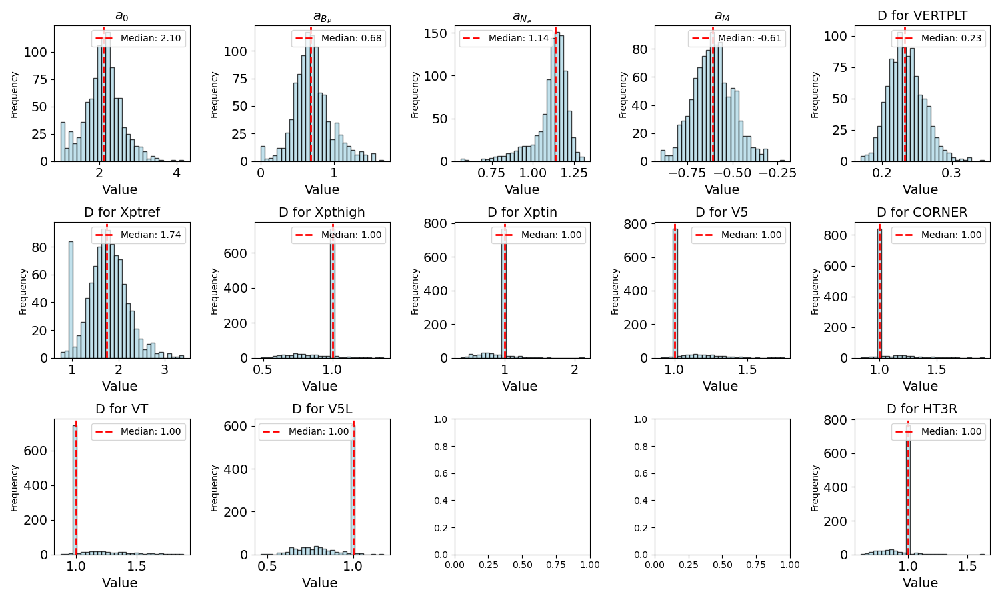

[0.965 0.987 1.    1.    1.    0.916 0.267 0.25  0.239 0.175 0.262 0.402
 0.316 0.218 0.246]
[ 0.71059638  0.70836942  1.11090376 -0.60585478 -1.45580989  0.52403637
 -0.0603633  -0.06074214  0.04200294  0.02731041  0.06213967 -0.10864197
  0.08962979  0.03411188 -0.0392463 ]
[28.867 30.425 30.37  33.66  30.894 29.191 28.854 29.825 31.424 29.886
 28.93  30.135 29.115 30.29  29.608]
(207,)
1000 samples' RMSE: 0.2178


In [341]:
import numpy as np
import matplotlib.pyplot as plt
titles = ["$a_0$", "$a_{B_P}$", "$a_{N_e}$", "$a_{M}$", "D for VERTPLT", "D for Xptref", "D for Xpthigh", "D for Xptin", "D for V5", "D for CORNER", "D for VT", "D for V5L", "D for V5E", "D for V5C", "D for HT3R"]
S_new1 = np.array(S_new)  # 转换为 NumPy 数组
gamma_new = np.array(gamma_new)
D=15
# 绘制直方图
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(15, 9))
axes = axes.flatten()

for i in range(D):
    if i ==12 or i ==13:
        continue
    else:
        ax = axes[i]


        # 只有第一张 (i=0) 和最后一张 (i=D-1) 需要 exp 变换
        if i == 0 or i in [4, 5, 6, 7, 8, 9, 10, 11, 12,13,14]:

            filtered_beta = np.exp(S_new1[:, i])  # 只对特定索引应用 exp
            xlabel_text = 'Value '
        else:
            filtered_beta = S_new1[:, i]
            xlabel_text = 'Value'

        # 计算中位数
        median_value = np.median(filtered_beta)

        # 绘制直方图（颜色设为浅蓝）
        ax.hist(filtered_beta, bins=30, alpha=0.75, color='lightblue', edgecolor='black')

        # 标出中位数
        ax.axvline(median_value, color='red', linestyle='dashed', linewidth=2, label=f'Median: {median_value:.2f}')
        ax.legend()

        # 设置标题和标签
        #ax.set_title(f'{X_with_intercept.columns[i]}')
        ax.set_title(titles[i], fontsize=14)
        ax.set_xlabel(xlabel_text, fontsize=14)
        ax.tick_params(axis='both', which='major', labelsize=14)
        ax.set_ylabel('Frequency')

plt.tight_layout()
#plt.savefig('distribution_exp_all_config_median.png', format='png', dpi=300, transparent=True)
plt.show()

# 计算均值
S_mean_new = S_new1.mean(axis=0)
beta_new_look_new = np.array(beta_new_look).mean(axis=0)  
gamma_mean = np.array(gamma_new).mean(axis=0) 
gamma_binary = (gamma_mean > 0.5).astype(int)

print(gamma_mean)
print(S_mean_new)
print(beta_new_look_new)

#predictions = np.array(predictions).T  
#pred_mean = predictions.mean(axis=1) 
'''SS_res = np.sum((pred_mean - y) ** 2)
SS_tot = np.sum((y - np.mean(y)) ** 2)
R_squared = 1 - (SS_res / SS_tot)

print(f"1000 samples' R² values=: {R_squared:.4f}")'''
from sklearn.metrics import mean_squared_error
pred_mean = predictions.mean(axis=1)  # 在采样维度上取均值，使得 pred_mean 变为 (483,)
print(pred_mean.shape)
rmse = np.sqrt(mean_squared_error(y, pred_mean))
print(f"1000 samples' RMSE: {rmse:.4f}")

In [342]:

trace.to_netcdf("low_branch_trace_different_config.nc")

# 查看并保存summary
summary_df = az.summary(trace, var_names=["beta", "gamma","gamma_prev", "sigma2", "beta_ori","eta", "pi", "p"])
print(summary_df)
summary_df.to_csv("low_branch_trace_different_config.csv")

/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


          mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
beta[0]  0.713  0.295   0.256    1.165      0.031    0.022     143.0   
beta[1]  0.721  0.275   0.255    1.265      0.035    0.027      77.0   
beta[2]  1.108  0.107   0.873    1.264      0.013    0.009      96.0   
beta[3] -0.608  0.110  -0.819   -0.404      0.004    0.003     657.0   
beta[4] -1.458  0.108  -1.661   -1.253      0.002    0.002    1920.0   
...        ...    ...     ...      ...        ...      ...       ...   
p[55]    0.017  0.010   0.000    0.030      0.000    0.000    1730.0   
p[56]    0.017  0.012   0.000    0.031      0.000    0.000    1617.0   
p[57]    0.017  0.011   0.000    0.031      0.000    0.000    1410.0   
p[58]    0.017  0.010   0.000    0.030      0.000    0.000    2050.0   
p[59]    0.017  0.009   0.000    0.031      0.000    0.000    1702.0   

         ess_tail  r_hat  
beta[0]      79.0   1.04  
beta[1]      57.0   1.05  
beta[2]     105.0   1.05  
beta[3]    2014.0   1.01  


In [345]:
file_path = 'LH_metal_DB_v1.12.csv'  # 替换为你的文件路径
df = pd.read_csv(file_path)
df.loc[:, 'TOK'] = df['TOK'].str.strip()
df['IP']=df['IP'].abs()/1000000
df['BT']=df['BT'].abs()
df['PLTH']=df['PLTH']/1000000
df['NEL']=df['NEL']/1e19


df.loc[:, 'TOK'] = df['TOK'].str.strip()

reference_dict = {
    1.00:  "Hydrogen",
    2.00:  "Deuterium",
    2.50:  "Deuterium and tritium",
    3.00:  "3He or tritium",
    4.00:  "4He",
    14.01: "Nitrogen"
}

# 定义一个函数，用来根据某一观测值PGASA，返回对应的分类名称
def categorize_pgasa(value, ref_dict, tolerance=0.2):
    """
    value: 待分类的数值
    ref_dict: {参考值: 分类名称}
    tolerance: 容忍度，即 |value - 参考值| 需小于等于该值才视为同一类
    """
    # 1) 找到离 value 最近的参考值
    closest_ref = min(ref_dict.keys(), key=lambda x: abs(x - value))
    # 2) 判断两者差值是否在容忍度以内
    if abs(closest_ref - value) <= tolerance:
        return ref_dict[closest_ref]
    else:
        return np.nan  # 或者 "Other"

# 将 categorize_pgasa 应用于 df["PGASA"] 列，生成新的分类列
df["Category"] = df["PGASA"].apply(lambda x: categorize_pgasa(x, reference_dict, tolerance=0.1))




# 假设 subset1 是你的数据框
colors = df['SELEC2024'].map({1: 'red', 0: 'blue'})


# 分类 BT 值
#subset2_2 = df[(ip < 2.6) & (ip >=2.4)&(bt < 3.2) & (bt >=2.8)& (df['Category'] == 'Deuterium')& (df['DIVCON'] == 'VT')]
#df = df.drop(subset2_2.index)

import statsmodels.api as sm
print(df.columns.tolist())

# 指定你想在新 DataFrame 中包含的列
columns_to_include = ['TOK', 'SPLASMA','AMIN','BT','IP','RGEO','PLTH','NEL','PGASA','KAPPA','Q95','AUXHEAT',"DIVCON"]
new_df = df[df['SELEC2024'] == 0][columns_to_include].copy()
mu0 = 4 * np.pi * 1e-7

new_df['BP']=1000000*(mu0 * new_df['IP']) / (new_df['SPLASMA']/(2 * np.pi * new_df['RGEO']))

new_df['PLTH/S/2']=new_df['PLTH']/2
new_df['a1']=new_df['SPLASMA']/(np.pi*new_df['RGEO']*2)
new_df['a']=new_df['AMIN']/new_df['RGEO']
#new_df['PLTH/S/2']=new_df['PLTH']
# 显示新 DataFrame



columns_to_include_for_regre = ['BP','IP','BT','a','AMIN','RGEO','KAPPA','Q95','PLTH/S/2','NEL','PGASA']
unique_divcon = new_df['DIVCON'].unique()
unique_heating = new_df['AUXHEAT'].unique()
print(unique_heating)
# 2. 向原始 DataFrame 添加新列
for divcon_type in unique_divcon:
    new_df[divcon_type] = (new_df['DIVCON'] == divcon_type).astype(int)
multi_df = new_df[columns_to_include_for_regre].copy()
multi_df = multi_df.apply(np.log)
x = multi_df[['BT','IP','NEL','PGASA']] 
#x = multi_df[['BT','NEL','PGASA']]
x[unique_divcon] = new_df[unique_divcon]
#x['Xp'] = x[['Xptref','Xpthigh','Xptin']].max(axis=1)
x.drop(['STANDARD'], axis=1, inplace=True)
x.drop(['Xptref','Xptin'], axis=1, inplace=True)
#x['CV'] = x[['CORNER','VT']].max(axis=1)
x.drop(['V5L','HT3','HT3R','HT3L','VT','CORNER','V5'], axis=1, inplace=True)

X_with_intercept = sm.add_constant(x)
y=multi_df["PLTH/S/2"]
model = sm.OLS(y, X_with_intercept)
results = model.fit()

# 打印详细统计结果
print(results.summary())
print(unique_divcon)
# 输出系数和标准误差
coefficients = results.params
std_errors = results.bse

labels = X_with_intercept.columns  # 获取变量名
for label, coef, std_err in zip(labels, coefficients, std_errors):
    print(f"{label}: {coef:.3f} ± {std_err:.3f}")
    # 打印 RMSE
y_pred = results.predict(X_with_intercept)  # 预测值
rmse = np.sqrt(np.mean((y - y_pred) ** 2))  # 计算 RMSE

print(f"RMSE: {rmse:.3f}")
# 获取 90% 置信区间
conf_int_90 = results.conf_int(alpha=0.1)


print("\n90% 置信区间：\n", conf_int_90)


['TOK', 'SHOT', 'TIME', 'PHASE', 'PGASA', 'RGEO', 'AMIN', 'KAPPA', 'SPLASMA', 'CONFIG', 'IGRADB', 'WALMAT', 'DIVMAT', 'LIMMAT', 'EVAP', 'BT', 'IP', 'Q95', 'NEL', 'ZEFF', 'DIVNAME', 'PL', 'PLTH', 'PFLOSS', 'PRADCORE', 'DIVCON', 'FRACNMIN', 'LHTIME', 'AUXHEAT', 'SELEC2024', 'Category']
['IC' 'EC' 'NBEC' 'ECIC' 'NB' 'NBIC' nan]
                            OLS Regression Results                            
Dep. Variable:               PLTH/S/2   R-squared:                       0.872
Model:                            OLS   Adj. R-squared:                  0.868
Method:                 Least Squares   F-statistic:                     272.8
Date:                Fri, 18 Apr 2025   Prob (F-statistic):           1.64e-87
Time:                        17:07:29   Log-Likelihood:                 16.617
No. Observations:                 207   AIC:                            -21.23
Df Residuals:                     201   BIC:                            -1.237
Df Model:                           5    

/var/folders/5g/7cwc8n193kz9d4h5lc3ky_0c0000gn/T/ipykernel_9077/2679075985.py:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x[unique_divcon] = new_df[unique_divcon]
/var/folders/5g/7cwc8n193kz9d4h5lc3ky_0c0000gn/T/ipykernel_9077/2679075985.py:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x[unique_divcon] = new_df[unique_divcon]
/var/folders/5g/7cwc8n193kz9d4h5lc3ky_0c0000gn/T/ipykernel_9077/2679075985.py:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.


Multiprocess sampling (4 chains in 4 jobs)
CompoundStep
>NUTS: [alpha, p, eta, beta_ori, beta_m, pi, sigma2]
>CategoricalGibbsMetropolis: [S]
>BinaryGibbsMetropolis: [gamma_prev, gamma]


Output()

Sampling 4 chains for 500 tune and 3_000 draw iterations (2_000 + 12_000 draws total) took 331 seconds.
/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
There were 152 divergences after tuning. Increase `target_accept` or reparameterize.
Chain 2 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


<IPython.core.display.Javascript object>


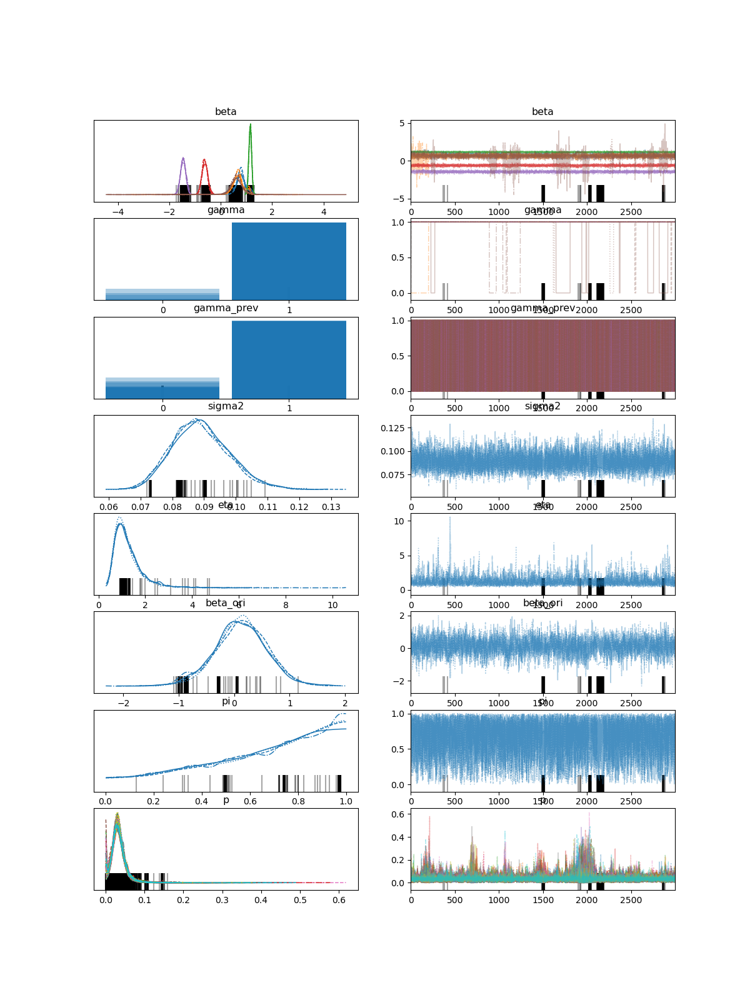

/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


                mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
beta[0]        0.773  0.198   0.372    1.177      0.020    0.014     121.0   
beta[1]        0.671  0.253   0.324    1.132      0.019    0.020     159.0   
beta[2]        1.148  0.054   1.050    1.252      0.002    0.001     997.0   
beta[3]       -0.624  0.109  -0.832   -0.421      0.004    0.003     607.0   
beta[4]       -1.464  0.105  -1.655   -1.263      0.003    0.002    1658.0   
beta[5]        0.578  0.413   0.149    1.188      0.030    0.021     335.0   
gamma[0]       1.000  0.000   1.000    1.000      0.000    0.000   12000.0   
gamma[1]       0.983  0.129   1.000    1.000      0.023    0.016      32.0   
gamma[2]       1.000  0.000   1.000    1.000      0.000    0.000   12000.0   
gamma[3]       1.000  0.000   1.000    1.000      0.000    0.000   12000.0   
gamma[4]       1.000  0.000   1.000    1.000      0.000    0.000   12000.0   
gamma[5]       0.934  0.248   0.000    1.000      0.039    0.028

In [349]:

# Step 1: Generate simulated data
np.random.seed(42)
N = 3000  # Number of samples
D = 6  # Number of predictors


# Step 2: Define the PyMC model
with pm.Model() as model:
    # Priors
    # Beta for regression coefficients, grouped into classes
    alpha = pm.HalfNormal("alpha", sigma=8.0)  # Dirichlet prior concentration parameter
    #alpha=1
    p = pm.Dirichlet("p", a=pm.math.ones(30) * alpha, shape=30)  # Class probabilities
 #10 0 1 2 3 4 
    S = pm.Categorical("S", p=p, shape=D)# bp=nel shape  1 1 1  # Class assignment for predictors (0-9)
    #[1 3 5 7 9]
    eta = pm.InverseGamma("eta", alpha=4, beta=4)  # Variance for beta_m
    mu_0=pm.Normal("beta_ori",mu=0,sigma=2)
    beta_m = pm.Normal("beta_m", mu=mu_0, sigma=pm.math.sqrt(eta), shape=30)  # Regression coefficients for each class
    
    # Ensure S only indexes valid categories of beta_m
    beta = pm.Deterministic("beta", beta_m[S])  # Map beta based on S
    
    # Sparsity indicator gamma
    pi = pm.Beta("pi", alpha=1, beta=1)  # Probability of gamma=1
    gamma_prev = pm.Bernoulli("gamma_prev", p=0.5, shape=D)  # 初始值
    rho = 0.8  # 控制gamma的平稳性（越接近1越稳定）
    gamma = pm.Bernoulli("gamma", p=rho * gamma_prev + (1 - rho) * pi, shape=D)

    #gamma = pm.Bernoulli("gamma", p=pi, shape=D)

    # Noise variance (sigma^2)
    sigma2 = pm.InverseGamma("sigma2", alpha=4, beta=4)  # Prior for noise variance

    # Observed data likelihood
    mu = pm.math.dot(X_with_intercept, beta * gamma)  # Predicted mean
    y_obs = pm.Normal("y_obs", mu=mu, sigma=pm.math.sqrt(sigma2), observed=y)

    # Inference
    
    trace = pm.sample(N, tune=500, chains=4,step=pm.NUTS(target_accept=0.95), return_inferencedata=True)


# Step 3: Analyze and visualize the results
az.plot_trace(trace, var_names=["beta", "gamma", "gamma_prev","sigma2", "eta", "beta_ori","pi", "p"])
plt.show()
summary=az.summary(trace, var_names=["beta", "gamma","gamma_prev", "sigma2", "eta","beta_ori", "pi", "p"])
print(summary)

<IPython.core.display.Javascript object>


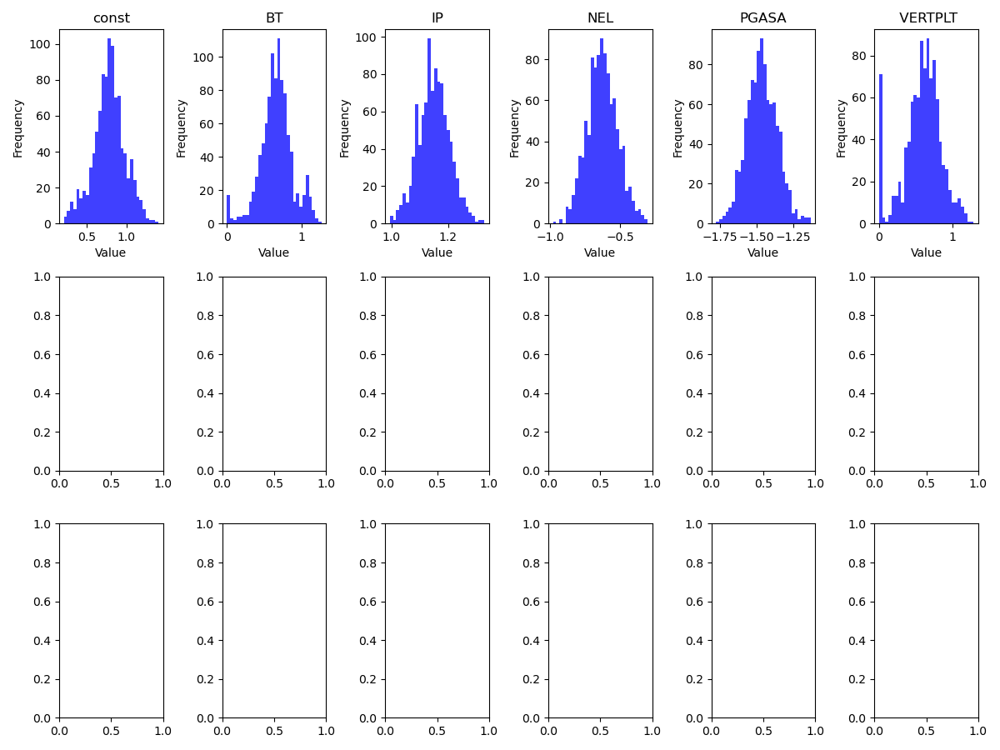

[1.    0.983 1.    1.    1.    0.93 ]
[ 0.7799359   0.66347832  1.14997411 -0.62695956 -1.4649176   0.59242532]
[14.784 14.625 14.275 15.434 14.125 14.558]
1000 samples' R² values=: 0.8703


In [350]:
# 从后验中随机抽取 10 个样本
num_samples = 1000
posterior_indices = np.random.choice(
    trace.posterior["beta"].stack(samples=["chain", "draw"]).shape[1], 
    size=num_samples, 
    replace=False
)

# 定义新数据
 # 新数据 (10 个样本)

# 存储预测结果
beta_new_look = []
predictions = []
S_new = []
gamma_new=[]
for idx in posterior_indices:
    beta_sample = trace.posterior["beta"].stack(samples=["chain", "draw"]).values[:, idx]
    gamma_sample = trace.posterior["gamma"].stack(samples=["chain", "draw"]).values[:, idx]
    S_sample = trace.posterior["S"].stack(samples=["chain", "draw"]).values[:, idx]
    sigma_sample = np.sqrt(trace.posterior["sigma2"].stack(samples=["chain", "draw"]).values[idx])
    #gamma_binary = (gamma_post_mean > 0.5).astype(int)
    # 计算预测值
    mu_pred = X_with_intercept @ (beta_sample * gamma_sample)  # 预测均值
    y_pred = np.random.normal(mu_pred, sigma_sample, size=X_with_intercept.shape[0])  # 从预测分布采样
    S_new.append(gamma_sample*beta_sample)
    beta_new_look.append(S_sample)
    gamma_new.append(gamma_sample)
    predictions.append(y_pred)
S_new1 = np.array(S_new)
gamma_new = np.array(gamma_new)
fig, axes = plt.subplots(nrows=3, ncols=6, figsize=(12, 9))
axes = axes.flatten()

for i in range(6):
    ax = axes[i]
    # 只考虑 gamma 为 1 的情况
    #filtered_beta = S_new1[:, i][gamma_new[:, i] == 1]
    filtered_beta = S_new1[:, i]
    ax.hist(filtered_beta, bins=30, alpha=0.75, color='blue')
    ax.set_title(f'{X_with_intercept.columns[i]}')
    ax.set_xlabel('Value')
    ax.set_ylabel('Frequency')

plt.tight_layout()
plt.savefig('distribution.png', format='png', dpi=300, transparent=True)
plt.show()
S_mean_new = np.array(S_new).mean(axis=0)
beta_new_look_new = np.array(beta_new_look).mean(axis=0)
gamma_mean = np.array(gamma_new).mean(axis=0) 
gamma_binary = (gamma_mean > 0.5).astype(int)
print(gamma_mean)

predictions = np.array(predictions).T  
pred_mean = predictions.mean(axis=1) 
print(S_mean_new)
print(beta_new_look_new)
SS_res = np.sum((pred_mean - y) ** 2)
SS_tot = np.sum((y - np.mean(y)) ** 2)
R_squared = 1 - (SS_res / SS_tot)
print(f"1000 samples' R² values=: {R_squared:.4f}")

In [351]:

trace.to_netcdf("low_branch_trace_only_config.nc")

# 查看并保存summary
summary_df = az.summary(trace, var_names=["beta", "gamma","gamma_prev", "sigma2", "beta_ori","eta", "pi", "p"])
print(summary_df)
summary_df.to_csv("low_branch_trace_only_config.csv")

/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


                mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
beta[0]        0.773  0.198   0.372    1.177      0.020    0.014     121.0   
beta[1]        0.671  0.253   0.324    1.132      0.019    0.020     159.0   
beta[2]        1.148  0.054   1.050    1.252      0.002    0.001     997.0   
beta[3]       -0.624  0.109  -0.832   -0.421      0.004    0.003     607.0   
beta[4]       -1.464  0.105  -1.655   -1.263      0.003    0.002    1658.0   
beta[5]        0.578  0.413   0.149    1.188      0.030    0.021     335.0   
gamma[0]       1.000  0.000   1.000    1.000      0.000    0.000   12000.0   
gamma[1]       0.983  0.129   1.000    1.000      0.023    0.016      32.0   
gamma[2]       1.000  0.000   1.000    1.000      0.000    0.000   12000.0   
gamma[3]       1.000  0.000   1.000    1.000      0.000    0.000   12000.0   
gamma[4]       1.000  0.000   1.000    1.000      0.000    0.000   12000.0   
gamma[5]       0.934  0.248   0.000    1.000      0.039    0.028

<IPython.core.display.Javascript object>


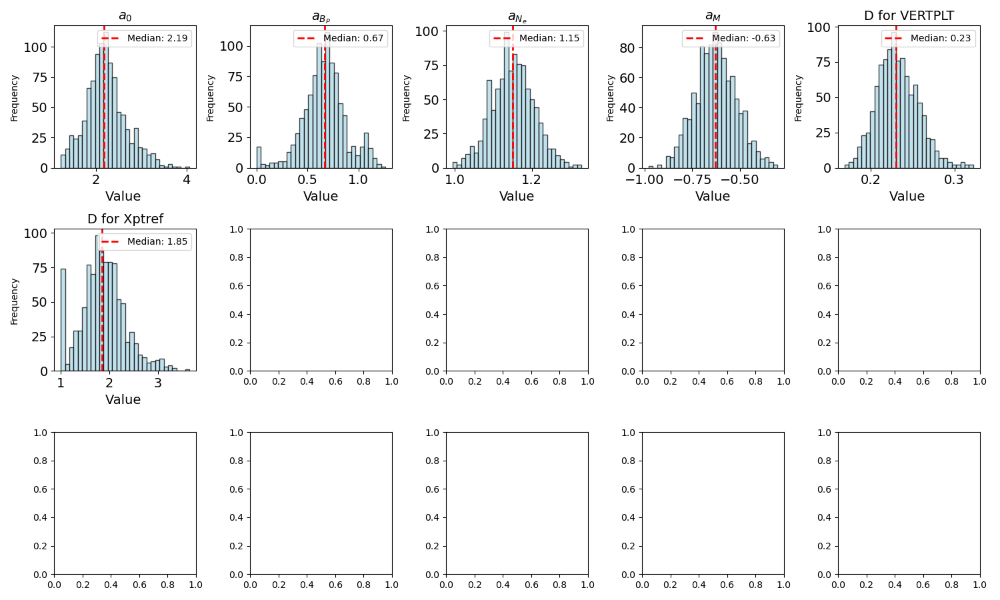

[1.    0.983 1.    1.    1.    0.93 ]
[ 0.7799359   0.66347832  1.14997411 -0.62695956 -1.4649176   0.59242532]
[14.784 14.625 14.275 15.434 14.125 14.558]
(207,)
1000 samples' RMSE: 0.2244


In [353]:
import numpy as np
import matplotlib.pyplot as plt
titles = ["$a_0$", "$a_{B_P}$", "$a_{N_e}$", "$a_{M}$", "D for VERTPLT", "D for Xptref", "D for Xpthigh", "D for Xptin", "D for V5", "D for CORNER", "D for VT", "D for V5L", "D for V5E", "D for V5C", "D for HT3R"]
S_new1 = np.array(S_new)  # 转换为 NumPy 数组
gamma_new = np.array(gamma_new)
D=6
# 绘制直方图
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(15, 9))
axes = axes.flatten()

for i in range(D):
    if i ==12 or i ==13:
        continue
    else:
        ax = axes[i]


        # 只有第一张 (i=0) 和最后一张 (i=D-1) 需要 exp 变换
        if i == 0 or i in [4, 5, 6, 7, 8, 9, 10, 11, 12,13,14]:

            filtered_beta = np.exp(S_new1[:, i])  # 只对特定索引应用 exp
            xlabel_text = 'Value '
        else:
            filtered_beta = S_new1[:, i]
            xlabel_text = 'Value'

        # 计算中位数
        median_value = np.median(filtered_beta)

        # 绘制直方图（颜色设为浅蓝）
        ax.hist(filtered_beta, bins=30, alpha=0.75, color='lightblue', edgecolor='black')

        # 标出中位数
        ax.axvline(median_value, color='red', linestyle='dashed', linewidth=2, label=f'Median: {median_value:.2f}')
        ax.legend()

        # 设置标题和标签
        #ax.set_title(f'{X_with_intercept.columns[i]}')
        ax.set_title(titles[i], fontsize=14)
        ax.set_xlabel(xlabel_text, fontsize=14)
        ax.tick_params(axis='both', which='major', labelsize=14)
        ax.set_ylabel('Frequency')

plt.tight_layout()
#plt.savefig('distribution_exp_all_config_median.png', format='png', dpi=300, transparent=True)
plt.show()

# 计算均值
S_mean_new = S_new1.mean(axis=0)
beta_new_look_new = np.array(beta_new_look).mean(axis=0)  
gamma_mean = np.array(gamma_new).mean(axis=0) 
gamma_binary = (gamma_mean > 0.5).astype(int)

print(gamma_mean)
print(S_mean_new)
print(beta_new_look_new)

#predictions = np.array(predictions).T  
#pred_mean = predictions.mean(axis=1) 
'''SS_res = np.sum((pred_mean - y) ** 2)
SS_tot = np.sum((y - np.mean(y)) ** 2)
R_squared = 1 - (SS_res / SS_tot)

print(f"1000 samples' R² values=: {R_squared:.4f}")'''
from sklearn.metrics import mean_squared_error
pred_mean = predictions.mean(axis=1)  # 在采样维度上取均值，使得 pred_mean 变为 (483,)
print(pred_mean.shape)
rmse = np.sqrt(mean_squared_error(y, pred_mean))
print(f"1000 samples' RMSE: {rmse:.4f}")

In [355]:
file_path = 'LH_metal_DB_v1.12.csv'  # 替换为你的文件路径
df = pd.read_csv(file_path)
df.loc[:, 'TOK'] = df['TOK'].str.strip()
df['IP']=df['IP'].abs()/1000000
df['BT']=df['BT'].abs()
df['PLTH']=df['PLTH']/1000000
df['NEL']=df['NEL']/1e19


df.loc[:, 'TOK'] = df['TOK'].str.strip()

reference_dict = {
    1.00:  "Hydrogen",
    2.00:  "Deuterium",
    2.50:  "Deuterium and tritium",
    3.00:  "3He or tritium",
    4.00:  "4He",
    14.01: "Nitrogen"
}

# 定义一个函数，用来根据某一观测值PGASA，返回对应的分类名称
def categorize_pgasa(value, ref_dict, tolerance=0.2):
    """
    value: 待分类的数值
    ref_dict: {参考值: 分类名称}
    tolerance: 容忍度，即 |value - 参考值| 需小于等于该值才视为同一类
    """
    # 1) 找到离 value 最近的参考值
    closest_ref = min(ref_dict.keys(), key=lambda x: abs(x - value))
    # 2) 判断两者差值是否在容忍度以内
    if abs(closest_ref - value) <= tolerance:
        return ref_dict[closest_ref]
    else:
        return np.nan  # 或者 "Other"

# 将 categorize_pgasa 应用于 df["PGASA"] 列，生成新的分类列
df["Category"] = df["PGASA"].apply(lambda x: categorize_pgasa(x, reference_dict, tolerance=0.1))




# 假设 subset1 是你的数据框
colors = df['SELEC2024'].map({1: 'red', 0: 'blue'})


# 分类 BT 值
#subset2_2 = df[(ip < 2.6) & (ip >=2.4)&(bt < 3.2) & (bt >=2.8)& (df['Category'] == 'Deuterium')& (df['DIVCON'] == 'VT')]
#df = df.drop(subset2_2.index)

import statsmodels.api as sm
print(df.columns.tolist())

# 指定你想在新 DataFrame 中包含的列
columns_to_include = ['TOK', 'SPLASMA','AMIN','BT','IP','RGEO','PLTH','NEL','PGASA','KAPPA','Q95','AUXHEAT',"DIVCON"]
new_df = df[df['SELEC2024'] == 0][columns_to_include].copy()
mu0 = 4 * np.pi * 1e-7

new_df['BP']=1000000*(mu0 * new_df['IP']) / (new_df['SPLASMA']/(2 * np.pi * new_df['RGEO']))

new_df['PLTH/S/2']=new_df['PLTH']/2
new_df['a1']=new_df['SPLASMA']/(np.pi*new_df['RGEO']*2)
new_df['a']=new_df['AMIN']/new_df['RGEO']
#new_df['PLTH/S/2']=new_df['PLTH']
# 显示新 DataFrame



columns_to_include_for_regre = ['BP','IP','BT','a','a1','SPLASMA','AMIN','RGEO','KAPPA','Q95','PLTH/S/2','NEL','PGASA']
unique_divcon = new_df['DIVCON'].unique()
unique_heating = new_df['AUXHEAT'].unique()
print(unique_heating)
# 2. 向原始 DataFrame 添加新列
for divcon_type in unique_divcon:
    new_df[divcon_type] = (new_df['DIVCON'] == divcon_type).astype(int)
multi_df = new_df[columns_to_include_for_regre].copy()
multi_df = multi_df.apply(np.log)
x = multi_df[['BT','IP','BP','SPLASMA','a1','a','NEL','PGASA']] 
#x = multi_df[['BT','NEL','PGASA']]
x[unique_divcon] = new_df[unique_divcon]
#x['Xp'] = x[['Xptref','Xpthigh','Xptin']].max(axis=1)
x.drop(['STANDARD'], axis=1, inplace=True)
x.drop(['Xptref','Xptin'], axis=1, inplace=True)
#x['CV'] = x[['CORNER','VT']].max(axis=1)
x.drop(['V5L','HT3','HT3R','HT3L','VT','CORNER','V5'], axis=1, inplace=True)

X_with_intercept = sm.add_constant(x)
y=multi_df["PLTH/S/2"]
model = sm.OLS(y, X_with_intercept)
results = model.fit()

# 打印详细统计结果
print(results.summary())
print(unique_divcon)
# 输出系数和标准误差
coefficients = results.params
std_errors = results.bse

labels = X_with_intercept.columns  # 获取变量名
for label, coef, std_err in zip(labels, coefficients, std_errors):
    print(f"{label}: {coef:.3f} ± {std_err:.3f}")
    # 打印 RMSE
y_pred = results.predict(X_with_intercept)  # 预测值
rmse = np.sqrt(np.mean((y - y_pred) ** 2))  # 计算 RMSE

print(f"RMSE: {rmse:.3f}")
# 获取 90% 置信区间
conf_int_90 = results.conf_int(alpha=0.1)


print("\n90% 置信区间：\n", conf_int_90)


['TOK', 'SHOT', 'TIME', 'PHASE', 'PGASA', 'RGEO', 'AMIN', 'KAPPA', 'SPLASMA', 'CONFIG', 'IGRADB', 'WALMAT', 'DIVMAT', 'LIMMAT', 'EVAP', 'BT', 'IP', 'Q95', 'NEL', 'ZEFF', 'DIVNAME', 'PL', 'PLTH', 'PFLOSS', 'PRADCORE', 'DIVCON', 'FRACNMIN', 'LHTIME', 'AUXHEAT', 'SELEC2024', 'Category']
['IC' 'EC' 'NBEC' 'ECIC' 'NB' 'NBIC' nan]
                            OLS Regression Results                            
Dep. Variable:               PLTH/S/2   R-squared:                       0.882
Model:                            OLS   Adj. R-squared:                  0.877
Method:                 Least Squares   F-statistic:                     185.0
Date:                Fri, 18 Apr 2025   Prob (F-statistic):           1.57e-87
Time:                        17:31:21   Log-Likelihood:                 25.356
No. Observations:                 207   AIC:                            -32.71
Df Residuals:                     198   BIC:                            -2.718
Df Model:                           8    

/var/folders/5g/7cwc8n193kz9d4h5lc3ky_0c0000gn/T/ipykernel_9077/3983901776.py:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x[unique_divcon] = new_df[unique_divcon]
/var/folders/5g/7cwc8n193kz9d4h5lc3ky_0c0000gn/T/ipykernel_9077/3983901776.py:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x[unique_divcon] = new_df[unique_divcon]
/var/folders/5g/7cwc8n193kz9d4h5lc3ky_0c0000gn/T/ipykernel_9077/3983901776.py:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.


Multiprocess sampling (4 chains in 4 jobs)
CompoundStep
>NUTS: [alpha, p, eta, beta_ori, beta_m, pi, sigma2]
>CategoricalGibbsMetropolis: [S]
>BinaryGibbsMetropolis: [gamma_prev, gamma]


Output()

Sampling 4 chains for 500 tune and 3_000 draw iterations (2_000 + 12_000 draws total) took 490 seconds.
/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
There were 3332 divergences after tuning. Increase `target_accept` or reparameterize.
Chain 0 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


<IPython.core.display.Javascript object>


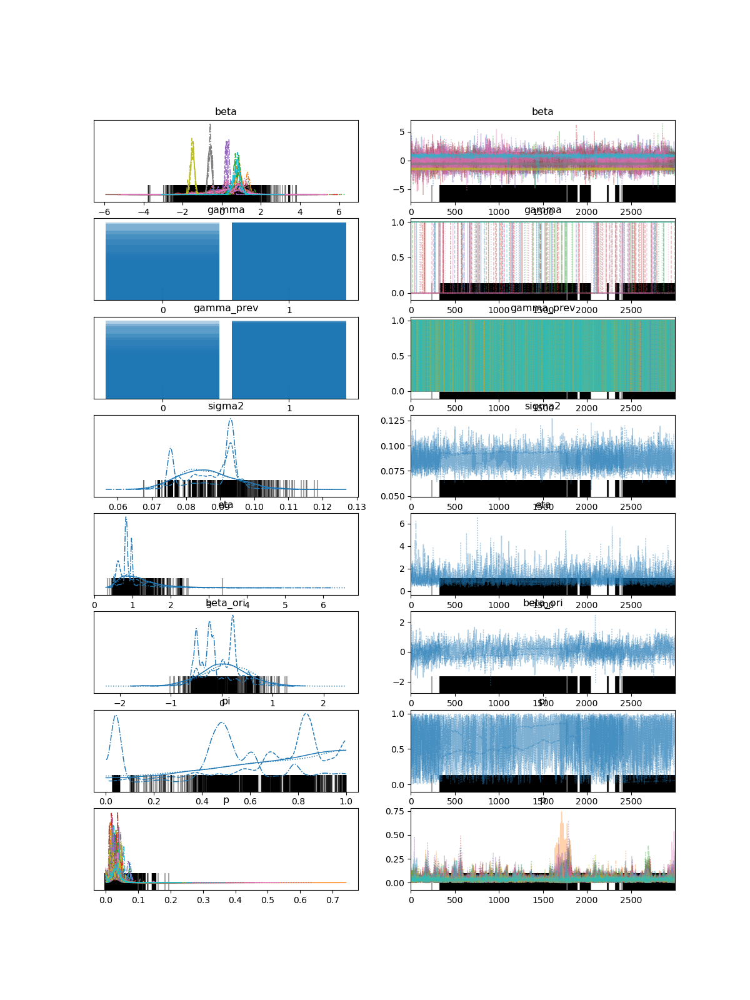

/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


          mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
beta[0]  0.165  1.003  -1.899    1.782      0.099    0.070      92.0   
beta[1]  0.921  0.226   0.578    1.438      0.062    0.048      17.0   
beta[2]  0.747  0.602  -0.574    1.739      0.042    0.047     125.0   
beta[3]  0.120  0.904  -1.786    1.448      0.058    0.041     234.0   
beta[4]  0.146  0.780  -1.605    1.537      0.023    0.101     289.0   
...        ...    ...     ...      ...        ...      ...       ...   
p[25]    0.034  0.019   0.000    0.060      0.001    0.001     177.0   
p[26]    0.036  0.024   0.000    0.061      0.001    0.001     342.0   
p[27]    0.033  0.021   0.000    0.059      0.002    0.001     117.0   
p[28]    0.030  0.018   0.000    0.055      0.002    0.002      48.0   
p[29]    0.033  0.019   0.000    0.057      0.001    0.001     339.0   

         ess_tail  r_hat  
beta[0]    1436.0   1.03  
beta[1]      31.0   1.16  
beta[2]     169.0   1.15  
beta[3]     470.0   1.02  


In [356]:

# Step 1: Generate simulated data
np.random.seed(42)
N = 3000  # Number of samples
D = 10  # Number of predictors


# Step 2: Define the PyMC model
with pm.Model() as model:
    # Priors
    # Beta for regression coefficients, grouped into classes
    alpha = pm.HalfNormal("alpha", sigma=8.0)  # Dirichlet prior concentration parameter
    #alpha=1
    p = pm.Dirichlet("p", a=pm.math.ones(30) * alpha, shape=30)  # Class probabilities
 #10 0 1 2 3 4 
    S = pm.Categorical("S", p=p, shape=D)# bp=nel shape  1 1 1  # Class assignment for predictors (0-9)
    #[1 3 5 7 9]
    eta = pm.InverseGamma("eta", alpha=4, beta=4)  # Variance for beta_m
    mu_0=pm.Normal("beta_ori",mu=0,sigma=2)
    beta_m = pm.Normal("beta_m", mu=mu_0, sigma=pm.math.sqrt(eta), shape=30)  # Regression coefficients for each class
    
    # Ensure S only indexes valid categories of beta_m
    beta = pm.Deterministic("beta", beta_m[S])  # Map beta based on S
    
    # Sparsity indicator gamma
    pi = pm.Beta("pi", alpha=1, beta=1)  # Probability of gamma=1
    gamma_prev = pm.Bernoulli("gamma_prev", p=0.5, shape=D)  # 初始值
    rho = 0.8  # 控制gamma的平稳性（越接近1越稳定）
    gamma = pm.Bernoulli("gamma", p=rho * gamma_prev + (1 - rho) * pi, shape=D)

    #gamma = pm.Bernoulli("gamma", p=pi, shape=D)

    # Noise variance (sigma^2)
    sigma2 = pm.InverseGamma("sigma2", alpha=4, beta=4)  # Prior for noise variance

    # Observed data likelihood
    mu = pm.math.dot(X_with_intercept, beta * gamma)  # Predicted mean
    y_obs = pm.Normal("y_obs", mu=mu, sigma=pm.math.sqrt(sigma2), observed=y)

    # Inference
    
    trace = pm.sample(N, tune=500, chains=4,step=pm.NUTS(target_accept=0.95), return_inferencedata=True)


# Step 3: Analyze and visualize the results
az.plot_trace(trace, var_names=["beta", "gamma", "gamma_prev","sigma2", "eta", "beta_ori","pi", "p"])
plt.show()
summary=az.summary(trace, var_names=["beta", "gamma","gamma_prev", "sigma2", "eta","beta_ori", "pi", "p"])
print(summary)

<IPython.core.display.Javascript object>


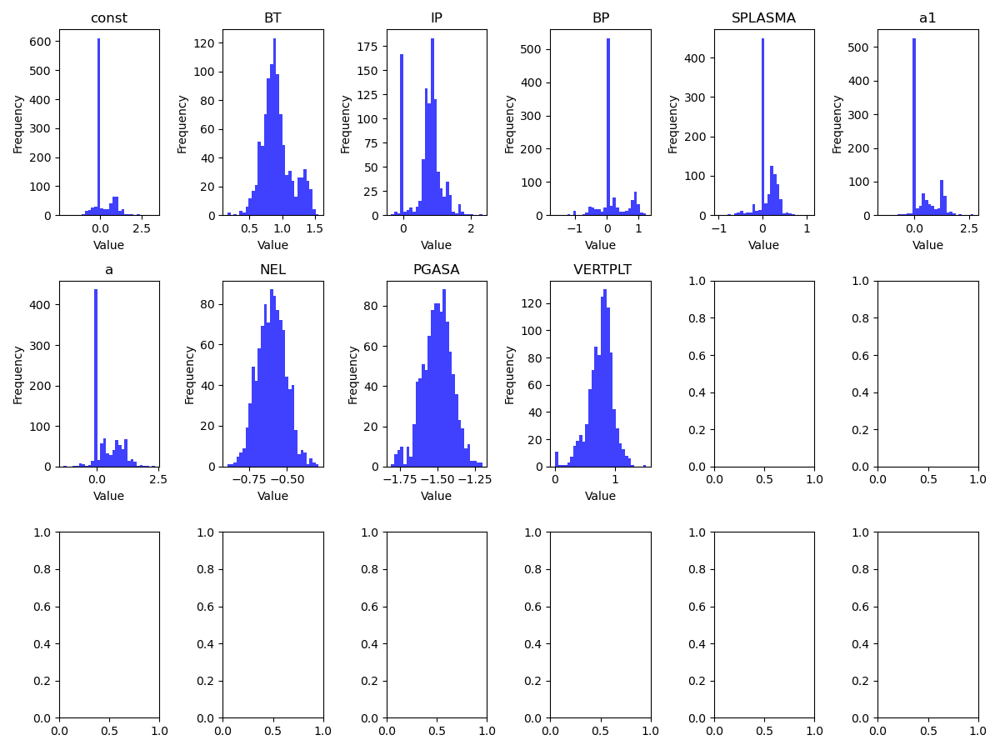

[0.415 1.    0.836 0.486 0.559 0.484 0.581 1.    1.    0.989]
[ 0.19222392  0.9186578   0.71243357  0.14453806  0.09353191  0.4070558
  0.39426056 -0.60093202 -1.50108595  0.75899644]
[14.215 16.068 13.843 14.144 14.484 14.989 14.189 13.883 12.363 14.451]
1000 samples' R² values=: 0.8772


In [357]:
# 从后验中随机抽取 10 个样本
num_samples = 1000
posterior_indices = np.random.choice(
    trace.posterior["beta"].stack(samples=["chain", "draw"]).shape[1], 
    size=num_samples, 
    replace=False
)

# 定义新数据
 # 新数据 (10 个样本)

# 存储预测结果
beta_new_look = []
predictions = []
S_new = []
gamma_new=[]
for idx in posterior_indices:
    beta_sample = trace.posterior["beta"].stack(samples=["chain", "draw"]).values[:, idx]
    gamma_sample = trace.posterior["gamma"].stack(samples=["chain", "draw"]).values[:, idx]
    S_sample = trace.posterior["S"].stack(samples=["chain", "draw"]).values[:, idx]
    sigma_sample = np.sqrt(trace.posterior["sigma2"].stack(samples=["chain", "draw"]).values[idx])
    #gamma_binary = (gamma_post_mean > 0.5).astype(int)
    # 计算预测值
    mu_pred = X_with_intercept @ (beta_sample * gamma_sample)  # 预测均值
    y_pred = np.random.normal(mu_pred, sigma_sample, size=X_with_intercept.shape[0])  # 从预测分布采样
    S_new.append(gamma_sample*beta_sample)
    beta_new_look.append(S_sample)
    gamma_new.append(gamma_sample)
    predictions.append(y_pred)
S_new1 = np.array(S_new)
gamma_new = np.array(gamma_new)
fig, axes = plt.subplots(nrows=3, ncols=6, figsize=(12, 9))
axes = axes.flatten()

for i in range(10):
    ax = axes[i]
    # 只考虑 gamma 为 1 的情况
    #filtered_beta = S_new1[:, i][gamma_new[:, i] == 1]
    filtered_beta = S_new1[:, i]
    ax.hist(filtered_beta, bins=30, alpha=0.75, color='blue')
    ax.set_title(f'{X_with_intercept.columns[i]}')
    ax.set_xlabel('Value')
    ax.set_ylabel('Frequency')

plt.tight_layout()
plt.savefig('distribution.png', format='png', dpi=300, transparent=True)
plt.show()
S_mean_new = np.array(S_new).mean(axis=0)
beta_new_look_new = np.array(beta_new_look).mean(axis=0)
gamma_mean = np.array(gamma_new).mean(axis=0) 
gamma_binary = (gamma_mean > 0.5).astype(int)
print(gamma_mean)

predictions = np.array(predictions).T  
pred_mean = predictions.mean(axis=1) 
print(S_mean_new)
print(beta_new_look_new)
SS_res = np.sum((pred_mean - y) ** 2)
SS_tot = np.sum((y - np.mean(y)) ** 2)
R_squared = 1 - (SS_res / SS_tot)
print(f"1000 samples' R² values=: {R_squared:.4f}")

In [358]:

trace.to_netcdf("low_branch_trace_all_config.nc")

# 查看并保存summary
summary_df = az.summary(trace, var_names=["beta", "gamma","gamma_prev", "sigma2", "beta_ori","eta", "pi", "p"])
print(summary_df)
summary_df.to_csv("low_branch_trace_all_config.csv")

/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


          mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
beta[0]  0.165  1.003  -1.899    1.782      0.099    0.070      92.0   
beta[1]  0.921  0.226   0.578    1.438      0.062    0.048      17.0   
beta[2]  0.747  0.602  -0.574    1.739      0.042    0.047     125.0   
beta[3]  0.120  0.904  -1.786    1.448      0.058    0.041     234.0   
beta[4]  0.146  0.780  -1.605    1.537      0.023    0.101     289.0   
...        ...    ...     ...      ...        ...      ...       ...   
p[25]    0.034  0.019   0.000    0.060      0.001    0.001     177.0   
p[26]    0.036  0.024   0.000    0.061      0.001    0.001     342.0   
p[27]    0.033  0.021   0.000    0.059      0.002    0.001     117.0   
p[28]    0.030  0.018   0.000    0.055      0.002    0.002      48.0   
p[29]    0.033  0.019   0.000    0.057      0.001    0.001     339.0   

         ess_tail  r_hat  
beta[0]    1436.0   1.03  
beta[1]      31.0   1.16  
beta[2]     169.0   1.15  
beta[3]     470.0   1.02  


Multiprocess sampling (4 chains in 4 jobs)
CompoundStep
>NUTS: [alpha, p, eta, beta_ori, beta_m, pi, sigma2]
>CategoricalGibbsMetropolis: [S]
>BinaryGibbsMetropolis: [gamma_prev, gamma]


Output()

Sampling 4 chains for 500 tune and 3_000 draw iterations (2_000 + 12_000 draws total) took 595 seconds.
/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
There were 916 divergences after tuning. Increase `target_accept` or reparameterize.
Chain 0 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 2 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 3 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is 

<IPython.core.display.Javascript object>


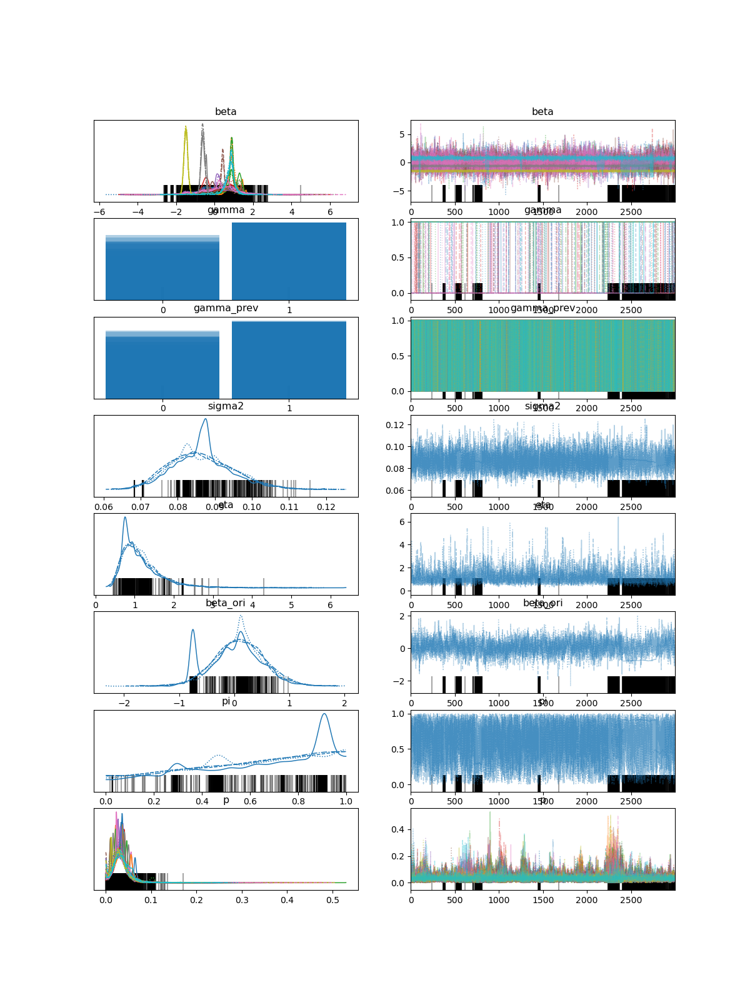

/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


          mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
beta[0]  0.134  1.058  -1.768    2.187      0.077    0.055     184.0   
beta[1]  0.899  0.207   0.455    1.298      0.031    0.026      66.0   
beta[2]  0.793  0.602  -0.628    1.582      0.046    0.044     112.0   
beta[3]  0.141  0.931  -1.647    1.736      0.057    0.041     251.0   
beta[4]  0.124  0.978  -1.738    2.051      0.015    0.035    3078.0   
...        ...    ...     ...      ...        ...      ...       ...   
p[25]    0.033  0.019   0.000    0.062      0.001    0.001     249.0   
p[26]    0.035  0.024   0.000    0.065      0.001    0.001     469.0   
p[27]    0.032  0.018   0.000    0.059      0.001    0.000     493.0   
p[28]    0.032  0.019   0.000    0.061      0.001    0.001     376.0   
p[29]    0.035  0.021   0.000    0.064      0.001    0.001     373.0   

         ess_tail  r_hat  
beta[0]     657.0   1.02  
beta[1]      24.0   1.06  
beta[2]     149.0   1.16  
beta[3]    1103.0   1.01  


In [359]:

# Step 1: Generate simulated data
np.random.seed(42)
N = 3000  # Number of samples
D = 10  # Number of predictors


# Step 2: Define the PyMC model
with pm.Model() as model:
    # Priors
    # Beta for regression coefficients, grouped into classes
    alpha = pm.HalfNormal("alpha", sigma=8.0)  # Dirichlet prior concentration parameter
    #alpha=1
    p = pm.Dirichlet("p", a=pm.math.ones(30) * alpha, shape=30)  # Class probabilities
 #10 0 1 2 3 4 
    S = pm.Categorical("S", p=p, shape=D)# bp=nel shape  1 1 1  # Class assignment for predictors (0-9)
    #[1 3 5 7 9]
    eta = pm.InverseGamma("eta", alpha=4, beta=4)  # Variance for beta_m
    mu_0=pm.Normal("beta_ori",mu=0,sigma=2)
    beta_m = pm.Normal("beta_m", mu=mu_0, sigma=pm.math.sqrt(eta), shape=30)  # Regression coefficients for each class
    
    # Ensure S only indexes valid categories of beta_m
    beta = pm.Deterministic("beta", beta_m[S])  # Map beta based on S
    
    # Sparsity indicator gamma
    pi = pm.Beta("pi", alpha=1, beta=1)  # Probability of gamma=1
    gamma_prev = pm.Bernoulli("gamma_prev", p=0.5, shape=D)  # 初始值
    rho = 0.8  # 控制gamma的平稳性（越接近1越稳定）
    gamma = pm.Bernoulli("gamma", p=rho * gamma_prev + (1 - rho) * pi, shape=D)

    #gamma = pm.Bernoulli("gamma", p=pi, shape=D)

    # Noise variance (sigma^2)
    sigma2 = pm.InverseGamma("sigma2", alpha=4, beta=4)  # Prior for noise variance

    # Observed data likelihood
    mu = pm.math.dot(X_with_intercept, beta * gamma)  # Predicted mean
    y_obs = pm.Normal("y_obs", mu=mu, sigma=pm.math.sqrt(sigma2), observed=y)

    # Inference
    
    trace = pm.sample(N, tune=500, chains=4,step=pm.NUTS(target_accept=0.95), return_inferencedata=True)


# Step 3: Analyze and visualize the results
az.plot_trace(trace, var_names=["beta", "gamma", "gamma_prev","sigma2", "eta", "beta_ori","pi", "p"])
plt.show()
summary=az.summary(trace, var_names=["beta", "gamma","gamma_prev", "sigma2", "eta","beta_ori", "pi", "p"])
print(summary)

<IPython.core.display.Javascript object>


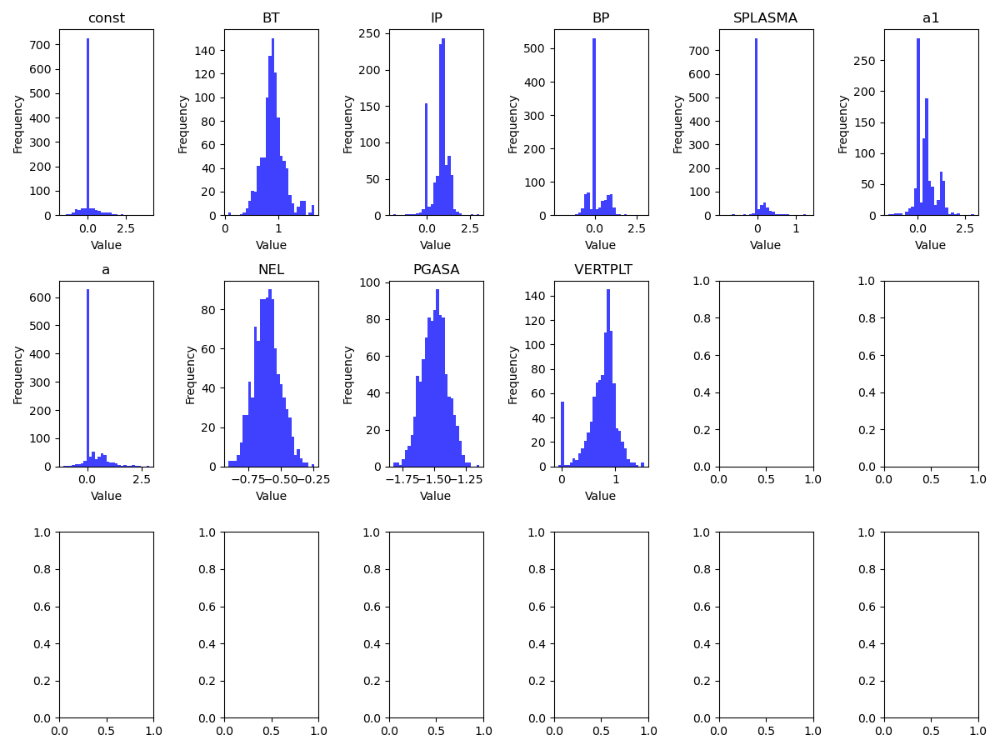

[0.316 1.    0.854 0.491 0.259 0.73  0.402 1.    1.    0.949]
[ 0.07723284  0.89905839  0.76015921  0.12017875  0.05702705  0.42298227
  0.20000244 -0.60447912 -1.49641317  0.75462649]
[13.805 14.158 15.023 15.011 14.053 16.172 13.88  14.242 17.505 13.794]
1000 samples' R² values=: 0.8767


In [360]:
# 从后验中随机抽取 10 个样本
num_samples = 1000
posterior_indices = np.random.choice(
    trace.posterior["beta"].stack(samples=["chain", "draw"]).shape[1], 
    size=num_samples, 
    replace=False
)

# 定义新数据
 # 新数据 (10 个样本)

# 存储预测结果
beta_new_look = []
predictions = []
S_new = []
gamma_new=[]
for idx in posterior_indices:
    beta_sample = trace.posterior["beta"].stack(samples=["chain", "draw"]).values[:, idx]
    gamma_sample = trace.posterior["gamma"].stack(samples=["chain", "draw"]).values[:, idx]
    S_sample = trace.posterior["S"].stack(samples=["chain", "draw"]).values[:, idx]
    sigma_sample = np.sqrt(trace.posterior["sigma2"].stack(samples=["chain", "draw"]).values[idx])
    #gamma_binary = (gamma_post_mean > 0.5).astype(int)
    # 计算预测值
    mu_pred = X_with_intercept @ (beta_sample * gamma_sample)  # 预测均值
    y_pred = np.random.normal(mu_pred, sigma_sample, size=X_with_intercept.shape[0])  # 从预测分布采样
    S_new.append(gamma_sample*beta_sample)
    beta_new_look.append(S_sample)
    gamma_new.append(gamma_sample)
    predictions.append(y_pred)
S_new1 = np.array(S_new)
gamma_new = np.array(gamma_new)
fig, axes = plt.subplots(nrows=3, ncols=6, figsize=(12, 9))
axes = axes.flatten()

for i in range(10):
    ax = axes[i]
    # 只考虑 gamma 为 1 的情况
    #filtered_beta = S_new1[:, i][gamma_new[:, i] == 1]
    filtered_beta = S_new1[:, i]
    ax.hist(filtered_beta, bins=30, alpha=0.75, color='blue')
    ax.set_title(f'{X_with_intercept.columns[i]}')
    ax.set_xlabel('Value')
    ax.set_ylabel('Frequency')

plt.tight_layout()
plt.savefig('distribution.png', format='png', dpi=300, transparent=True)
plt.show()
S_mean_new = np.array(S_new).mean(axis=0)
beta_new_look_new = np.array(beta_new_look).mean(axis=0)
gamma_mean = np.array(gamma_new).mean(axis=0) 
gamma_binary = (gamma_mean > 0.5).astype(int)
print(gamma_mean)

predictions = np.array(predictions).T  
pred_mean = predictions.mean(axis=1) 
print(S_mean_new)
print(beta_new_look_new)
SS_res = np.sum((pred_mean - y) ** 2)
SS_tot = np.sum((y - np.mean(y)) ** 2)
R_squared = 1 - (SS_res / SS_tot)
print(f"1000 samples' R² values=: {R_squared:.4f}")

In [361]:

trace.to_netcdf("low_branch_trace_all_config2.nc")

# 查看并保存summary
summary_df = az.summary(trace, var_names=["beta", "gamma","gamma_prev", "sigma2", "beta_ori","eta", "pi", "p"])
print(summary_df)
summary_df.to_csv("low_branch_trace_all_config2.csv")

/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


          mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
beta[0]  0.134  1.058  -1.768    2.187      0.077    0.055     184.0   
beta[1]  0.899  0.207   0.455    1.298      0.031    0.026      66.0   
beta[2]  0.793  0.602  -0.628    1.582      0.046    0.044     112.0   
beta[3]  0.141  0.931  -1.647    1.736      0.057    0.041     251.0   
beta[4]  0.124  0.978  -1.738    2.051      0.015    0.035    3078.0   
...        ...    ...     ...      ...        ...      ...       ...   
p[25]    0.033  0.019   0.000    0.062      0.001    0.001     249.0   
p[26]    0.035  0.024   0.000    0.065      0.001    0.001     469.0   
p[27]    0.032  0.018   0.000    0.059      0.001    0.000     493.0   
p[28]    0.032  0.019   0.000    0.061      0.001    0.001     376.0   
p[29]    0.035  0.021   0.000    0.064      0.001    0.001     373.0   

         ess_tail  r_hat  
beta[0]     657.0   1.02  
beta[1]      24.0   1.06  
beta[2]     149.0   1.16  
beta[3]    1103.0   1.01  


In [362]:
file_path = 'LH_metal_DB_v1.12.csv'  # 替换为你的文件路径
df = pd.read_csv(file_path)
df.loc[:, 'TOK'] = df['TOK'].str.strip()
df['IP']=df['IP'].abs()/1000000
df['BT']=df['BT'].abs()
df['PLTH']=df['PLTH']/1000000
df['NEL']=df['NEL']/1e19


df.loc[:, 'TOK'] = df['TOK'].str.strip()

reference_dict = {
    1.00:  "Hydrogen",
    2.00:  "Deuterium",
    2.50:  "Deuterium and tritium",
    3.00:  "3He or tritium",
    4.00:  "4He",
    14.01: "Nitrogen"
}

# 定义一个函数，用来根据某一观测值PGASA，返回对应的分类名称
def categorize_pgasa(value, ref_dict, tolerance=0.2):
    """
    value: 待分类的数值
    ref_dict: {参考值: 分类名称}
    tolerance: 容忍度，即 |value - 参考值| 需小于等于该值才视为同一类
    """
    # 1) 找到离 value 最近的参考值
    closest_ref = min(ref_dict.keys(), key=lambda x: abs(x - value))
    # 2) 判断两者差值是否在容忍度以内
    if abs(closest_ref - value) <= tolerance:
        return ref_dict[closest_ref]
    else:
        return np.nan  # 或者 "Other"

# 将 categorize_pgasa 应用于 df["PGASA"] 列，生成新的分类列
df["Category"] = df["PGASA"].apply(lambda x: categorize_pgasa(x, reference_dict, tolerance=0.1))




# 假设 subset1 是你的数据框
colors = df['SELEC2024'].map({1: 'red', 0: 'blue'})


# 分类 BT 值
#subset2_2 = df[(ip < 2.6) & (ip >=2.4)&(bt < 3.2) & (bt >=2.8)& (df['Category'] == 'Deuterium')& (df['DIVCON'] == 'VT')]
#df = df.drop(subset2_2.index)

import statsmodels.api as sm
print(df.columns.tolist())

# 指定你想在新 DataFrame 中包含的列
columns_to_include = ['TOK', 'SPLASMA','AMIN','BT','IP','RGEO','PLTH','NEL','PGASA','KAPPA','Q95','AUXHEAT',"DIVCON"]
new_df = df[df['SELEC2024'] == 0][columns_to_include].copy()
mu0 = 4 * np.pi * 1e-7

new_df['BP']=1000000*(mu0 * new_df['IP']) / (new_df['SPLASMA']/(2 * np.pi * new_df['RGEO']))

new_df['PLTH/S/2']=new_df['PLTH']/2
new_df['a1']=new_df['SPLASMA']/(np.pi*new_df['RGEO']*2)
new_df['a']=new_df['AMIN']/new_df['RGEO']
#new_df['PLTH/S/2']=new_df['PLTH']
# 显示新 DataFrame



columns_to_include_for_regre = ['BP','IP','BT','a','a1','SPLASMA','AMIN','RGEO','KAPPA','Q95','PLTH/S/2','NEL','PGASA']
unique_divcon = new_df['DIVCON'].unique()
unique_heating = new_df['AUXHEAT'].unique()
print(unique_heating)
# 2. 向原始 DataFrame 添加新列
for divcon_type in unique_divcon:
    new_df[divcon_type] = (new_df['DIVCON'] == divcon_type).astype(int)
multi_df = new_df[columns_to_include_for_regre].copy()
multi_df = multi_df.apply(np.log)
x = multi_df[['BT','BP','SPLASMA','a1','NEL','PGASA']] 
#x = multi_df[['BT','NEL','PGASA']]
x[unique_divcon] = new_df[unique_divcon]
#x['Xp'] = x[['Xptref','Xpthigh','Xptin']].max(axis=1)
x.drop(['STANDARD'], axis=1, inplace=True)
x.drop(['Xptref','Xptin'], axis=1, inplace=True)
#x['CV'] = x[['CORNER','VT']].max(axis=1)
x.drop(['V5L','HT3','HT3R','HT3L','VT','CORNER','V5'], axis=1, inplace=True)

X_with_intercept = sm.add_constant(x)
y=multi_df["PLTH/S/2"]
model = sm.OLS(y, X_with_intercept)
results = model.fit()

# 打印详细统计结果
print(results.summary())
print(unique_divcon)
# 输出系数和标准误差
coefficients = results.params
std_errors = results.bse

labels = X_with_intercept.columns  # 获取变量名
for label, coef, std_err in zip(labels, coefficients, std_errors):
    print(f"{label}: {coef:.3f} ± {std_err:.3f}")
    # 打印 RMSE
y_pred = results.predict(X_with_intercept)  # 预测值
rmse = np.sqrt(np.mean((y - y_pred) ** 2))  # 计算 RMSE

print(f"RMSE: {rmse:.3f}")
# 获取 90% 置信区间
conf_int_90 = results.conf_int(alpha=0.1)


print("\n90% 置信区间：\n", conf_int_90)


['TOK', 'SHOT', 'TIME', 'PHASE', 'PGASA', 'RGEO', 'AMIN', 'KAPPA', 'SPLASMA', 'CONFIG', 'IGRADB', 'WALMAT', 'DIVMAT', 'LIMMAT', 'EVAP', 'BT', 'IP', 'Q95', 'NEL', 'ZEFF', 'DIVNAME', 'PL', 'PLTH', 'PFLOSS', 'PRADCORE', 'DIVCON', 'FRACNMIN', 'LHTIME', 'AUXHEAT', 'SELEC2024', 'Category']
['IC' 'EC' 'NBEC' 'ECIC' 'NB' 'NBIC' nan]
                            OLS Regression Results                            
Dep. Variable:               PLTH/S/2   R-squared:                       0.882
Model:                            OLS   Adj. R-squared:                  0.877
Method:                 Least Squares   F-statistic:                     211.5
Date:                Fri, 18 Apr 2025   Prob (F-statistic):           1.53e-88
Time:                        18:08:05   Log-Likelihood:                 24.952
No. Observations:                 207   AIC:                            -33.90
Df Residuals:                     199   BIC:                            -7.242
Df Model:                           7    

/var/folders/5g/7cwc8n193kz9d4h5lc3ky_0c0000gn/T/ipykernel_9077/273262367.py:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x[unique_divcon] = new_df[unique_divcon]
/var/folders/5g/7cwc8n193kz9d4h5lc3ky_0c0000gn/T/ipykernel_9077/273262367.py:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x[unique_divcon] = new_df[unique_divcon]
/var/folders/5g/7cwc8n193kz9d4h5lc3ky_0c0000gn/T/ipykernel_9077/273262367.py:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

Multiprocess sampling (4 chains in 4 jobs)
CompoundStep
>NUTS: [alpha, p, eta, beta_ori, beta_m, pi, sigma2]
>CategoricalGibbsMetropolis: [S]
>BinaryGibbsMetropolis: [gamma_prev, gamma]


Output()

Sampling 4 chains for 500 tune and 3_000 draw iterations (2_000 + 12_000 draws total) took 388 seconds.
/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
There were 2097 divergences after tuning. Increase `target_accept` or reparameterize.
Chain 0 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 3 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


<IPython.core.display.Javascript object>


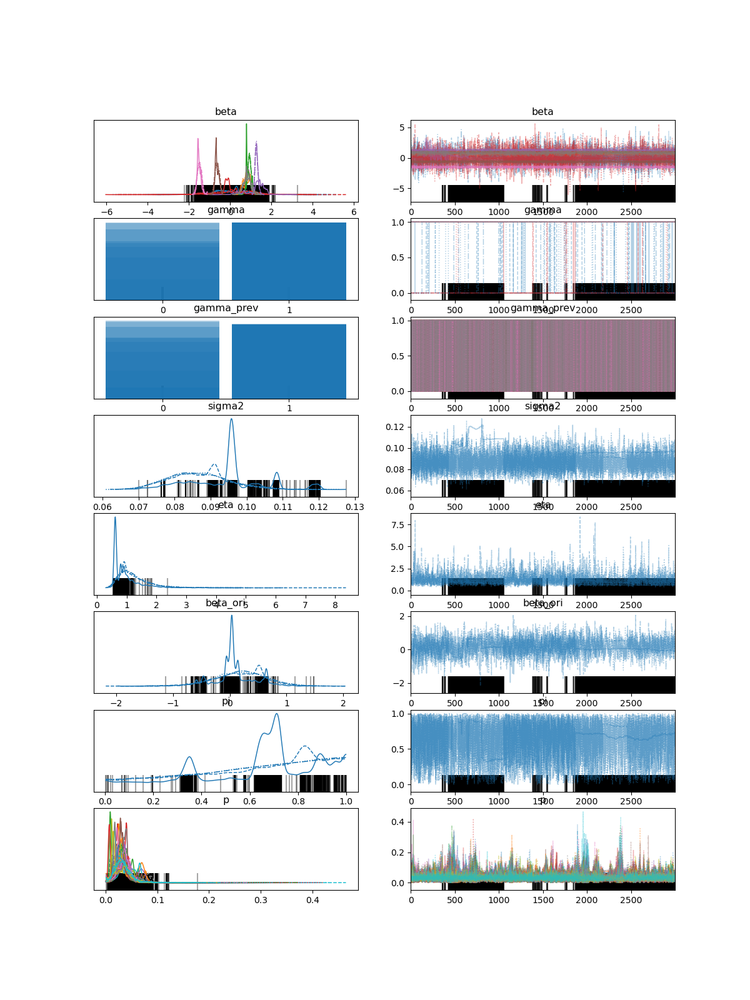

/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


                mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
beta[0]        0.052  0.987  -1.730    1.935      0.031    0.022     915.0   
beta[1]        0.820  0.170   0.484    1.118      0.015    0.011     126.0   
beta[2]        0.910  0.103   0.729    1.100      0.012    0.008      80.0   
beta[3]        0.151  1.061  -1.846    2.168      0.021    0.065    1509.0   
beta[4]        1.270  0.241   1.028    1.826      0.058    0.042      17.0   
beta[5]       -0.638  0.098  -0.803   -0.443      0.009    0.007     124.0   
beta[6]       -1.502  0.102  -1.683   -1.304      0.005    0.004     399.0   
beta[7]        0.821  0.196   0.388    1.173      0.011    0.008     304.0   
gamma[0]       0.322  0.467   0.000    1.000      0.095    0.068      24.0   
gamma[1]       1.000  0.000   1.000    1.000      0.000    0.000   12000.0   
gamma[2]       1.000  0.000   1.000    1.000      0.000    0.000   12000.0   
gamma[3]       0.211  0.408   0.000    1.000      0.155    0.115

In [363]:

# Step 1: Generate simulated data
np.random.seed(42)
N = 3000  # Number of samples
D = 8  # Number of predictors


# Step 2: Define the PyMC model
with pm.Model() as model:
    # Priors
    # Beta for regression coefficients, grouped into classes
    alpha = pm.HalfNormal("alpha", sigma=8.0)  # Dirichlet prior concentration parameter
    #alpha=1
    p = pm.Dirichlet("p", a=pm.math.ones(30) * alpha, shape=30)  # Class probabilities
 #10 0 1 2 3 4 
    S = pm.Categorical("S", p=p, shape=D)# bp=nel shape  1 1 1  # Class assignment for predictors (0-9)
    #[1 3 5 7 9]
    eta = pm.InverseGamma("eta", alpha=4, beta=4)  # Variance for beta_m
    mu_0=pm.Normal("beta_ori",mu=0,sigma=2)
    beta_m = pm.Normal("beta_m", mu=mu_0, sigma=pm.math.sqrt(eta), shape=30)  # Regression coefficients for each class
    
    # Ensure S only indexes valid categories of beta_m
    beta = pm.Deterministic("beta", beta_m[S])  # Map beta based on S
    
    # Sparsity indicator gamma
    pi = pm.Beta("pi", alpha=1, beta=1)  # Probability of gamma=1
    gamma_prev = pm.Bernoulli("gamma_prev", p=0.5, shape=D)  # 初始值
    rho = 0.8  # 控制gamma的平稳性（越接近1越稳定）
    gamma = pm.Bernoulli("gamma", p=rho * gamma_prev + (1 - rho) * pi, shape=D)

    #gamma = pm.Bernoulli("gamma", p=pi, shape=D)

    # Noise variance (sigma^2)
    sigma2 = pm.InverseGamma("sigma2", alpha=4, beta=4)  # Prior for noise variance

    # Observed data likelihood
    mu = pm.math.dot(X_with_intercept, beta * gamma)  # Predicted mean
    y_obs = pm.Normal("y_obs", mu=mu, sigma=pm.math.sqrt(sigma2), observed=y)

    # Inference
    
    trace = pm.sample(N, tune=500, chains=4,step=pm.NUTS(target_accept=0.95), return_inferencedata=True)


# Step 3: Analyze and visualize the results
az.plot_trace(trace, var_names=["beta", "gamma", "gamma_prev","sigma2", "eta", "beta_ori","pi", "p"])
plt.show()
summary=az.summary(trace, var_names=["beta", "gamma","gamma_prev", "sigma2", "eta","beta_ori", "pi", "p"])
print(summary)

/var/folders/5g/7cwc8n193kz9d4h5lc3ky_0c0000gn/T/ipykernel_9077/2081340893.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(nrows=3, ncols=6, figsize=(12, 9))


<IPython.core.display.Javascript object>


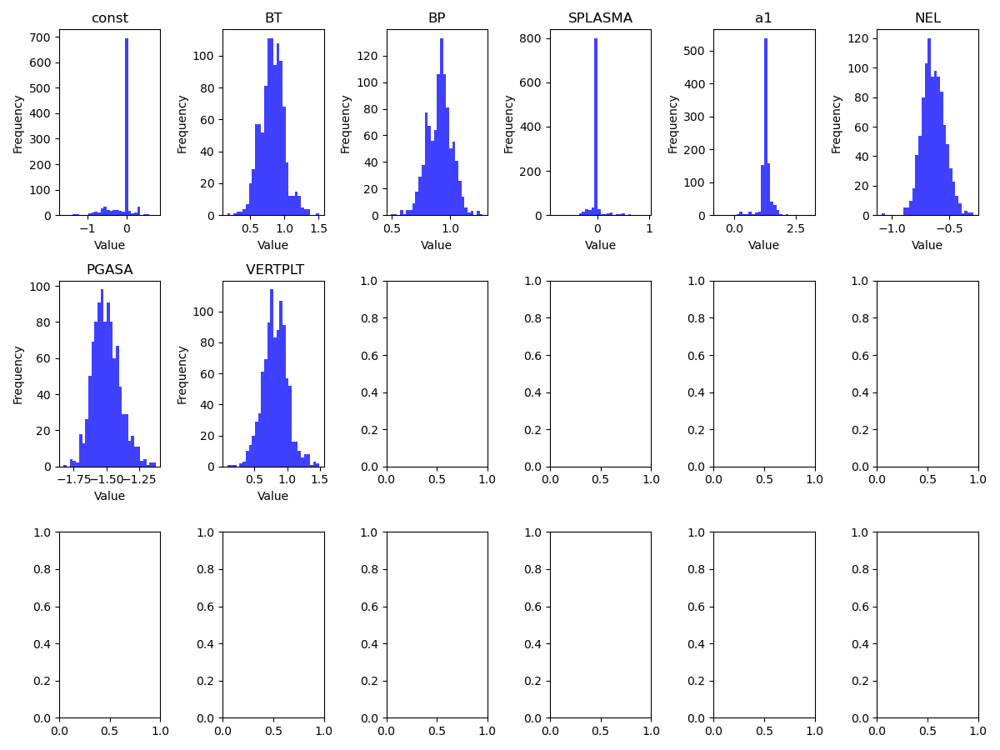

[0.322 1.    1.    0.214 1.    1.    1.    1.   ]
[-9.61678615e-02  8.24509763e-01  9.09517437e-01 -2.16016258e-04
  1.27313300e+00 -6.37350990e-01 -1.50092536e+00  8.16312902e-01]
[13.602 13.779 15.178 14.934 12.414 12.09  16.714 14.607]
1000 samples' R² values=: 0.8760


In [364]:
# 从后验中随机抽取 10 个样本
num_samples = 1000
posterior_indices = np.random.choice(
    trace.posterior["beta"].stack(samples=["chain", "draw"]).shape[1], 
    size=num_samples, 
    replace=False
)

# 定义新数据
 # 新数据 (10 个样本)

# 存储预测结果
beta_new_look = []
predictions = []
S_new = []
gamma_new=[]
for idx in posterior_indices:
    beta_sample = trace.posterior["beta"].stack(samples=["chain", "draw"]).values[:, idx]
    gamma_sample = trace.posterior["gamma"].stack(samples=["chain", "draw"]).values[:, idx]
    S_sample = trace.posterior["S"].stack(samples=["chain", "draw"]).values[:, idx]
    sigma_sample = np.sqrt(trace.posterior["sigma2"].stack(samples=["chain", "draw"]).values[idx])
    #gamma_binary = (gamma_post_mean > 0.5).astype(int)
    # 计算预测值
    mu_pred = X_with_intercept @ (beta_sample * gamma_sample)  # 预测均值
    y_pred = np.random.normal(mu_pred, sigma_sample, size=X_with_intercept.shape[0])  # 从预测分布采样
    S_new.append(gamma_sample*beta_sample)
    beta_new_look.append(S_sample)
    gamma_new.append(gamma_sample)
    predictions.append(y_pred)
S_new1 = np.array(S_new)
gamma_new = np.array(gamma_new)
fig, axes = plt.subplots(nrows=3, ncols=6, figsize=(12, 9))
axes = axes.flatten()

for i in range(8):
    ax = axes[i]
    # 只考虑 gamma 为 1 的情况
    #filtered_beta = S_new1[:, i][gamma_new[:, i] == 1]
    filtered_beta = S_new1[:, i]
    ax.hist(filtered_beta, bins=30, alpha=0.75, color='blue')
    ax.set_title(f'{X_with_intercept.columns[i]}')
    ax.set_xlabel('Value')
    ax.set_ylabel('Frequency')

plt.tight_layout()
plt.savefig('distribution.png', format='png', dpi=300, transparent=True)
plt.show()
S_mean_new = np.array(S_new).mean(axis=0)
beta_new_look_new = np.array(beta_new_look).mean(axis=0)
gamma_mean = np.array(gamma_new).mean(axis=0) 
gamma_binary = (gamma_mean > 0.5).astype(int)
print(gamma_mean)

predictions = np.array(predictions).T  
pred_mean = predictions.mean(axis=1) 
print(S_mean_new)
print(beta_new_look_new)
SS_res = np.sum((pred_mean - y) ** 2)
SS_tot = np.sum((y - np.mean(y)) ** 2)
R_squared = 1 - (SS_res / SS_tot)
print(f"1000 samples' R² values=: {R_squared:.4f}")

<IPython.core.display.Javascript object>


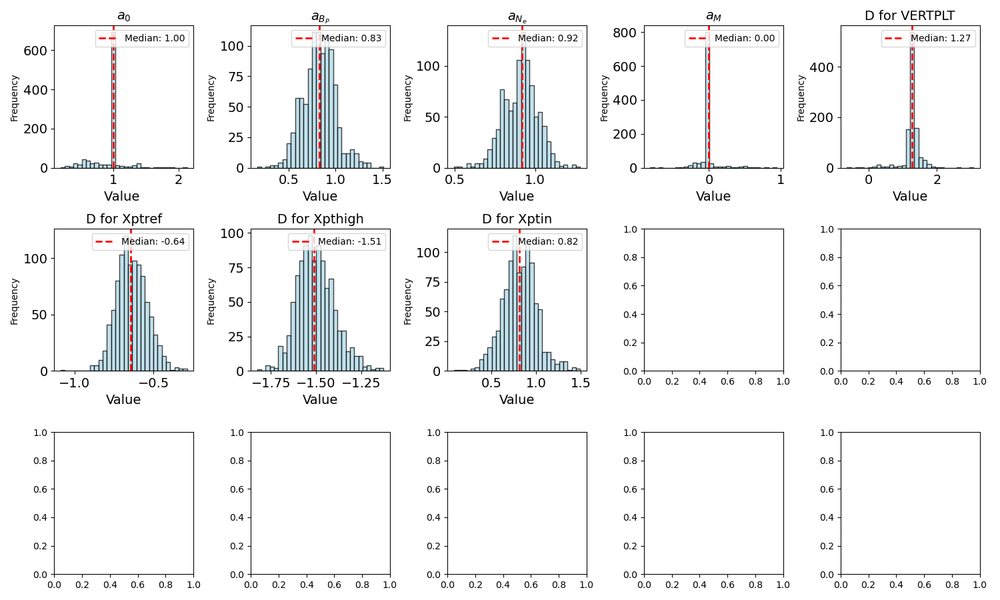

[0.322 1.    1.    0.214 1.    1.    1.    1.   ]
[-9.61678615e-02  8.24509763e-01  9.09517437e-01 -2.16016258e-04
  1.27313300e+00 -6.37350990e-01 -1.50092536e+00  8.16312902e-01]
[13.602 13.779 15.178 14.934 12.414 12.09  16.714 14.607]
(207,)
1000 samples' RMSE: 0.2194


In [367]:
import numpy as np
import matplotlib.pyplot as plt
titles = ["$a_0$", "$a_{B_P}$", "$a_{N_e}$", "$a_{M}$", "D for VERTPLT", "D for Xptref", "D for Xpthigh", "D for Xptin", "D for V5", "D for CORNER", "D for VT", "D for V5L", "D for V5E", "D for V5C", "D for HT3R"]
S_new1 = np.array(S_new)  # 转换为 NumPy 数组
gamma_new = np.array(gamma_new)
D=8
# 绘制直方图
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(15, 9))
axes = axes.flatten()

for i in range(D):
    if i ==12 or i ==13:
        continue
    else:
        ax = axes[i]


        # 只有第一张 (i=0) 和最后一张 (i=D-1) 需要 exp 变换
        if i == 0 :

            filtered_beta = np.exp(S_new1[:, i])  # 只对特定索引应用 exp
            xlabel_text = 'Value '
        else:
            filtered_beta = S_new1[:, i]
            xlabel_text = 'Value'

        # 计算中位数
        median_value = np.median(filtered_beta)

        # 绘制直方图（颜色设为浅蓝）
        ax.hist(filtered_beta, bins=30, alpha=0.75, color='lightblue', edgecolor='black')

        # 标出中位数
        ax.axvline(median_value, color='red', linestyle='dashed', linewidth=2, label=f'Median: {median_value:.2f}')
        ax.legend()

        # 设置标题和标签
        #ax.set_title(f'{X_with_intercept.columns[i]}')
        ax.set_title(titles[i], fontsize=14)
        ax.set_xlabel(xlabel_text, fontsize=14)
        ax.tick_params(axis='both', which='major', labelsize=14)
        ax.set_ylabel('Frequency')

plt.tight_layout()
#plt.savefig('distribution_exp_all_config_median.png', format='png', dpi=300, transparent=True)
plt.show()

# 计算均值
S_mean_new = S_new1.mean(axis=0)
beta_new_look_new = np.array(beta_new_look).mean(axis=0)  
gamma_mean = np.array(gamma_new).mean(axis=0) 
gamma_binary = (gamma_mean > 0.5).astype(int)

print(gamma_mean)
print(S_mean_new)
print(beta_new_look_new)

#predictions = np.array(predictions).T  
#pred_mean = predictions.mean(axis=1) 
'''SS_res = np.sum((pred_mean - y) ** 2)
SS_tot = np.sum((y - np.mean(y)) ** 2)
R_squared = 1 - (SS_res / SS_tot)

print(f"1000 samples' R² values=: {R_squared:.4f}")'''
from sklearn.metrics import mean_squared_error
pred_mean = predictions.mean(axis=1)  # 在采样维度上取均值，使得 pred_mean 变为 (483,)
print(pred_mean.shape)
rmse = np.sqrt(mean_squared_error(y, pred_mean))
print(f"1000 samples' RMSE: {rmse:.4f}")

In [368]:

trace.to_netcdf("low_branch_trace_noIP_config3.nc")

# 查看并保存summary
summary_df = az.summary(trace, var_names=["beta", "gamma","gamma_prev", "sigma2", "beta_ori","eta", "pi", "p"])
print(summary_df)
summary_df.to_csv("low_branch_trace_noIP_config3.csv")

/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


                mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
beta[0]        0.052  0.987  -1.730    1.935      0.031    0.022     915.0   
beta[1]        0.820  0.170   0.484    1.118      0.015    0.011     126.0   
beta[2]        0.910  0.103   0.729    1.100      0.012    0.008      80.0   
beta[3]        0.151  1.061  -1.846    2.168      0.021    0.065    1509.0   
beta[4]        1.270  0.241   1.028    1.826      0.058    0.042      17.0   
beta[5]       -0.638  0.098  -0.803   -0.443      0.009    0.007     124.0   
beta[6]       -1.502  0.102  -1.683   -1.304      0.005    0.004     399.0   
beta[7]        0.821  0.196   0.388    1.173      0.011    0.008     304.0   
gamma[0]       0.322  0.467   0.000    1.000      0.095    0.068      24.0   
gamma[1]       1.000  0.000   1.000    1.000      0.000    0.000   12000.0   
gamma[2]       1.000  0.000   1.000    1.000      0.000    0.000   12000.0   
gamma[3]       0.211  0.408   0.000    1.000      0.155    0.115

In [377]:
file_path = 'LH_metal_DB_v1.12.csv'  # 替换为你的文件路径
df = pd.read_csv(file_path)
df.loc[:, 'TOK'] = df['TOK'].str.strip()
df['IP']=df['IP'].abs()/1000000
df['BT']=df['BT'].abs()
df['PLTH']=df['PLTH']/1000000
df['NEL']=df['NEL']/1e19


df.loc[:, 'TOK'] = df['TOK'].str.strip()

reference_dict = {
    1.00:  "Hydrogen",
    2.00:  "Deuterium",
    2.50:  "Deuterium and tritium",
    3.00:  "3He or tritium",
    4.00:  "4He",
    14.01: "Nitrogen"
}

# 定义一个函数，用来根据某一观测值PGASA，返回对应的分类名称
def categorize_pgasa(value, ref_dict, tolerance=0.2):
    """
    value: 待分类的数值
    ref_dict: {参考值: 分类名称}
    tolerance: 容忍度，即 |value - 参考值| 需小于等于该值才视为同一类
    """
    # 1) 找到离 value 最近的参考值
    closest_ref = min(ref_dict.keys(), key=lambda x: abs(x - value))
    # 2) 判断两者差值是否在容忍度以内
    if abs(closest_ref - value) <= tolerance:
        return ref_dict[closest_ref]
    else:
        return np.nan  # 或者 "Other"

# 将 categorize_pgasa 应用于 df["PGASA"] 列，生成新的分类列
df["Category"] = df["PGASA"].apply(lambda x: categorize_pgasa(x, reference_dict, tolerance=0.1))




# 假设 subset1 是你的数据框
colors = df['SELEC2024'].map({1: 'red', 0: 'blue'})


# 分类 BT 值
#subset2_2 = df[(ip < 2.6) & (ip >=2.4)&(bt < 3.2) & (bt >=2.8)& (df['Category'] == 'Deuterium')& (df['DIVCON'] == 'VT')]
#df = df.drop(subset2_2.index)

import statsmodels.api as sm
print(df.columns.tolist())

# 指定你想在新 DataFrame 中包含的列
columns_to_include = ['TOK', 'SPLASMA','AMIN','BT','IP','RGEO','PLTH','NEL','PGASA','KAPPA','Q95','AUXHEAT',"DIVCON"]
new_df = df[df['SELEC2024'] == 0][columns_to_include].copy()
mu0 = 4 * np.pi * 1e-7

new_df['BP']=1000000*(mu0 * new_df['IP']) / (new_df['SPLASMA']/(2 * np.pi * new_df['RGEO']))

new_df['PLTH/S/2']=new_df['PLTH']/2
new_df['a1']=new_df['SPLASMA']/(np.pi*new_df['RGEO']*2)
new_df['a']=new_df['AMIN']/new_df['RGEO']
#new_df['PLTH/S/2']=new_df['PLTH']
# 显示新 DataFrame



columns_to_include_for_regre = ['BP','IP','BT','a','a1','SPLASMA','AMIN','RGEO','KAPPA','Q95','PLTH/S/2','NEL','PGASA']
unique_divcon = new_df['DIVCON'].unique()
unique_heating = new_df['AUXHEAT'].unique()
print(unique_heating)
# 2. 向原始 DataFrame 添加新列
for divcon_type in unique_divcon:
    new_df[divcon_type] = (new_df['DIVCON'] == divcon_type).astype(int)
multi_df = new_df[columns_to_include_for_regre].copy()
multi_df = multi_df.apply(np.log)
x = multi_df[['BT','BP','SPLASMA','a1','NEL','PGASA']] 
#x = multi_df[['BT','NEL','PGASA']]
x[unique_divcon] = new_df[unique_divcon]
#x['Xp'] = x[['Xptref','Xpthigh','Xptin']].max(axis=1)
x.drop(['STANDARD'], axis=1, inplace=True)
x.drop(['Xptref','Xptin'], axis=1, inplace=True)
#x['CV'] = x[['CORNER','VT']].max(axis=1)
x.drop(['V5L','HT3','HT3R','HT3L','VT','CORNER','V5',' VERTPLT'], axis=1, inplace=True)

X_with_intercept = sm.add_constant(x)
y=multi_df["PLTH/S/2"]
model = sm.OLS(y, X_with_intercept)
results = model.fit()

# 打印详细统计结果
print(results.summary())
print(unique_divcon)
# 输出系数和标准误差
coefficients = results.params
std_errors = results.bse

labels = X_with_intercept.columns  # 获取变量名
for label, coef, std_err in zip(labels, coefficients, std_errors):
    print(f"{label}: {coef:.3f} ± {std_err:.3f}")
    # 打印 RMSE
y_pred = results.predict(X_with_intercept)  # 预测值
rmse = np.sqrt(np.mean((y - y_pred) ** 2))  # 计算 RMSE

print(f"RMSE: {rmse:.3f}")
# 获取 90% 置信区间
conf_int_90 = results.conf_int(alpha=0.1)


print("\n90% 置信区间：\n", conf_int_90)


['TOK', 'SHOT', 'TIME', 'PHASE', 'PGASA', 'RGEO', 'AMIN', 'KAPPA', 'SPLASMA', 'CONFIG', 'IGRADB', 'WALMAT', 'DIVMAT', 'LIMMAT', 'EVAP', 'BT', 'IP', 'Q95', 'NEL', 'ZEFF', 'DIVNAME', 'PL', 'PLTH', 'PFLOSS', 'PRADCORE', 'DIVCON', 'FRACNMIN', 'LHTIME', 'AUXHEAT', 'SELEC2024', 'Category']
['IC' 'EC' 'NBEC' 'ECIC' 'NB' 'NBIC' nan]
                            OLS Regression Results                            
Dep. Variable:               PLTH/S/2   R-squared:                       0.865
Model:                            OLS   Adj. R-squared:                  0.860
Method:                 Least Squares   F-statistic:                     212.7
Date:                Fri, 18 Apr 2025   Prob (F-statistic):           5.87e-84
Time:                        19:48:41   Log-Likelihood:                 11.090
No. Observations:                 207   AIC:                            -8.180
Df Residuals:                     200   BIC:                             15.15
Df Model:                           6    

/var/folders/5g/7cwc8n193kz9d4h5lc3ky_0c0000gn/T/ipykernel_9077/1207285728.py:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x[unique_divcon] = new_df[unique_divcon]
/var/folders/5g/7cwc8n193kz9d4h5lc3ky_0c0000gn/T/ipykernel_9077/1207285728.py:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  x[unique_divcon] = new_df[unique_divcon]
/var/folders/5g/7cwc8n193kz9d4h5lc3ky_0c0000gn/T/ipykernel_9077/1207285728.py:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.


Multiprocess sampling (4 chains in 4 jobs)
CompoundStep
>NUTS: [alpha, p, eta, beta_ori, beta_m, pi, sigma2]
>CategoricalGibbsMetropolis: [S]
>BinaryGibbsMetropolis: [gamma_prev, gamma]


Output()

Sampling 4 chains for 500 tune and 3_000 draw iterations (2_000 + 12_000 draws total) took 600 seconds.
/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
There were 183 divergences after tuning. Increase `target_accept` or reparameterize.
Chain 0 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 1 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 2 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
Chain 3 reached the maximum tree depth. Increase `max_treedepth`, increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008

<IPython.core.display.Javascript object>


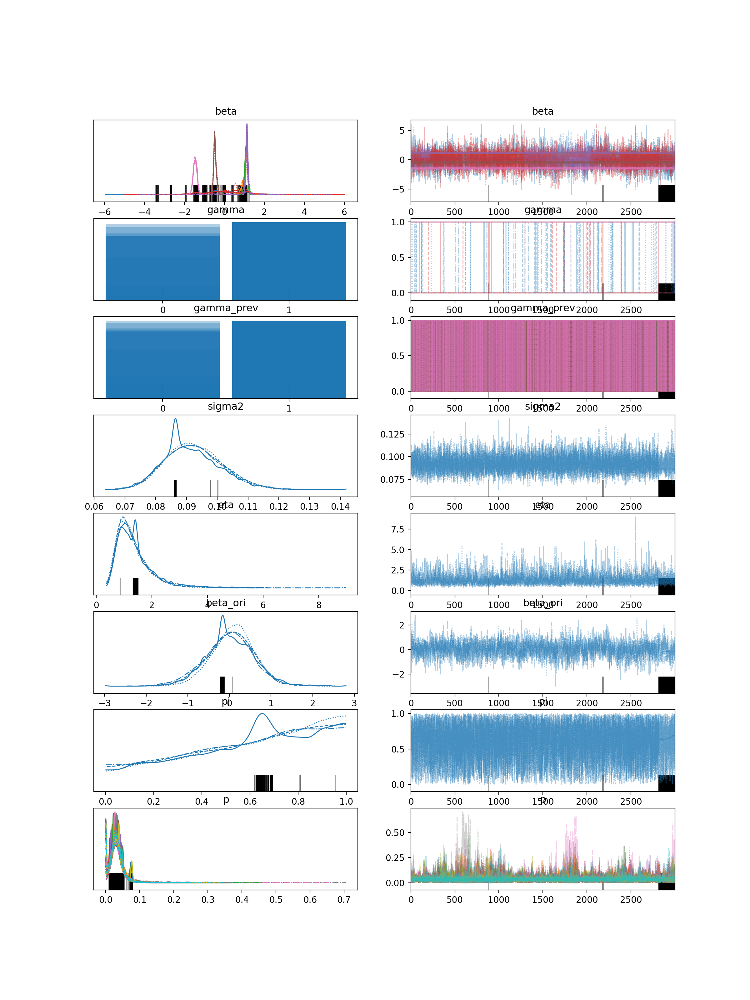

/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


                mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
beta[0]        0.006  1.173  -2.088    2.282      0.027    0.019    1780.0   
beta[1]        1.044  0.144   0.735    1.291      0.013    0.009     163.0   
beta[2]        1.094  0.082   0.941    1.256      0.006    0.005     140.0   
beta[3]        0.089  1.140  -2.191    2.122      0.027    0.032    1798.0   
beta[4]        1.051  0.489  -0.045    1.654      0.062    0.044     266.0   
beta[5]       -0.463  0.074  -0.589   -0.307      0.002    0.002    1035.0   
beta[6]       -1.463  0.097  -1.651   -1.286      0.002    0.001    2616.0   
gamma[0]       0.172  0.377   0.000    1.000      0.037    0.026     106.0   
gamma[1]       1.000  0.000   1.000    1.000      0.000    0.000   12000.0   
gamma[2]       1.000  0.000   1.000    1.000      0.000    0.000   12000.0   
gamma[3]       0.176  0.381   0.000    1.000      0.091    0.065      18.0   
gamma[4]       0.938  0.242   0.000    1.000      0.059    0.043

In [379]:

# Step 1: Generate simulated data
np.random.seed(42)
N = 3000  # Number of samples
D = 7  # Number of predictors


# Step 2: Define the PyMC model
with pm.Model() as model:
    # Priors
    # Beta for regression coefficients, grouped into classes
    alpha = pm.HalfNormal("alpha", sigma=8.0)  # Dirichlet prior concentration parameter
    #alpha=1
    p = pm.Dirichlet("p", a=pm.math.ones(30) * alpha, shape=30)  # Class probabilities
 #10 0 1 2 3 4 
    S = pm.Categorical("S", p=p, shape=D)# bp=nel shape  1 1 1  # Class assignment for predictors (0-9)
    #[1 3 5 7 9]
    eta = pm.InverseGamma("eta", alpha=4, beta=4)  # Variance for beta_m
    mu_0=pm.Normal("beta_ori",mu=0,sigma=2)
    beta_m = pm.Normal("beta_m", mu=mu_0, sigma=pm.math.sqrt(eta), shape=30)  # Regression coefficients for each class
    
    # Ensure S only indexes valid categories of beta_m
    beta = pm.Deterministic("beta", beta_m[S])  # Map beta based on S
    
    # Sparsity indicator gamma
    pi = pm.Beta("pi", alpha=1, beta=1)  # Probability of gamma=1
    gamma_prev = pm.Bernoulli("gamma_prev", p=0.5, shape=D)  # 初始值
    rho = 0.8  # 控制gamma的平稳性（越接近1越稳定）
    gamma = pm.Bernoulli("gamma", p=rho * gamma_prev + (1 - rho) * pi, shape=D)

    #gamma = pm.Bernoulli("gamma", p=pi, shape=D)

    # Noise variance (sigma^2)
    sigma2 = pm.InverseGamma("sigma2", alpha=4, beta=4)  # Prior for noise variance

    # Observed data likelihood
    mu = pm.math.dot(X_with_intercept, beta * gamma)  # Predicted mean
    y_obs = pm.Normal("y_obs", mu=mu, sigma=pm.math.sqrt(sigma2), observed=y)

    # Inference
    
    trace = pm.sample(N, tune=500, chains=4,step=pm.NUTS(target_accept=0.95), return_inferencedata=True)


# Step 3: Analyze and visualize the results
az.plot_trace(trace, var_names=["beta", "gamma", "gamma_prev","sigma2", "eta", "beta_ori","pi", "p"])
plt.show()
summary=az.summary(trace, var_names=["beta", "gamma","gamma_prev", "sigma2", "eta","beta_ori", "pi", "p"])
print(summary)

<IPython.core.display.Javascript object>


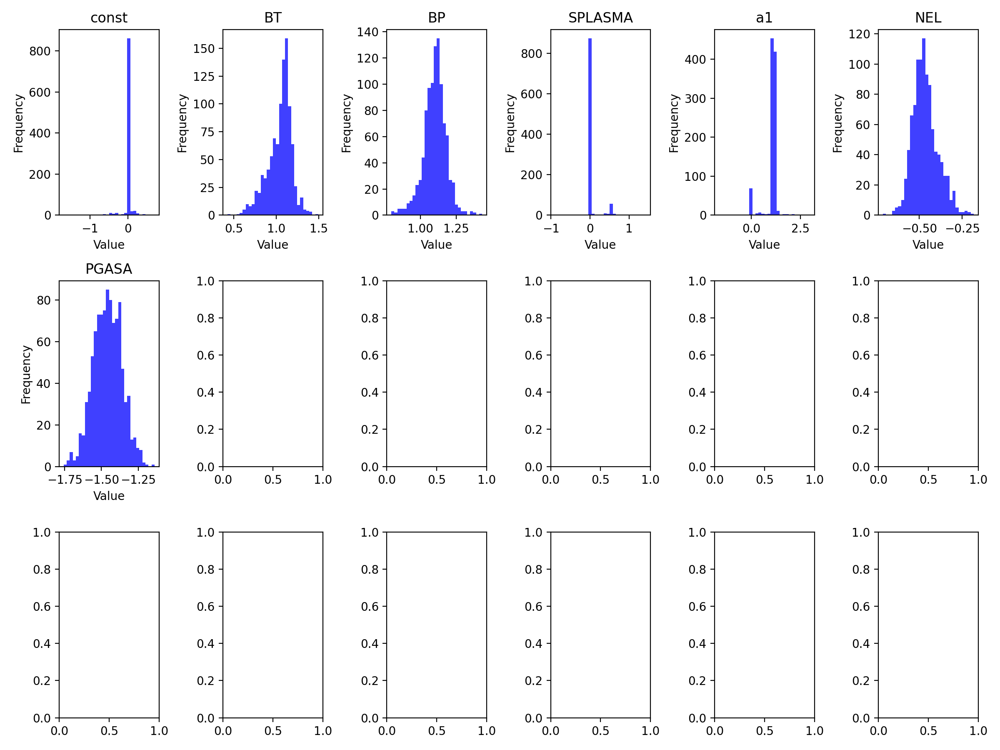

[0.154 1.    1.    0.156 0.931 1.    1.   ]
[-0.01886214  1.04170823  1.10023338  0.04463726  1.04058295 -0.46510585
 -1.45873794]
[14.911 15.463 14.714 14.274 15.037 13.266 13.793]
1000 samples' R² values=: 0.8616


In [381]:
# 从后验中随机抽取 10 个样本
num_samples = 1000
posterior_indices = np.random.choice(
    trace.posterior["beta"].stack(samples=["chain", "draw"]).shape[1], 
    size=num_samples, 
    replace=False
)

# 定义新数据
 # 新数据 (10 个样本)

# 存储预测结果
beta_new_look = []
predictions = []
S_new = []
gamma_new=[]
for idx in posterior_indices:
    beta_sample = trace.posterior["beta"].stack(samples=["chain", "draw"]).values[:, idx]
    gamma_sample = trace.posterior["gamma"].stack(samples=["chain", "draw"]).values[:, idx]
    S_sample = trace.posterior["S"].stack(samples=["chain", "draw"]).values[:, idx]
    sigma_sample = np.sqrt(trace.posterior["sigma2"].stack(samples=["chain", "draw"]).values[idx])
    #gamma_binary = (gamma_post_mean > 0.5).astype(int)
    # 计算预测值
    mu_pred = X_with_intercept @ (beta_sample * gamma_sample)  # 预测均值
    y_pred = np.random.normal(mu_pred, sigma_sample, size=X_with_intercept.shape[0])  # 从预测分布采样
    S_new.append(gamma_sample*beta_sample)
    beta_new_look.append(S_sample)
    gamma_new.append(gamma_sample)
    predictions.append(y_pred)
S_new1 = np.array(S_new)
gamma_new = np.array(gamma_new)
fig, axes = plt.subplots(nrows=3, ncols=6, figsize=(12, 9))
axes = axes.flatten()

for i in range(7):
    ax = axes[i]
    # 只考虑 gamma 为 1 的情况
    #filtered_beta = S_new1[:, i][gamma_new[:, i] == 1]
    filtered_beta = S_new1[:, i]
    ax.hist(filtered_beta, bins=30, alpha=0.75, color='blue')
    ax.set_title(f'{X_with_intercept.columns[i]}')
    ax.set_xlabel('Value')
    ax.set_ylabel('Frequency')

plt.tight_layout()
plt.savefig('distribution.png', format='png', dpi=300, transparent=True)
plt.show()
S_mean_new = np.array(S_new).mean(axis=0)
beta_new_look_new = np.array(beta_new_look).mean(axis=0)
gamma_mean = np.array(gamma_new).mean(axis=0) 
gamma_binary = (gamma_mean > 0.5).astype(int)
print(gamma_mean)

predictions = np.array(predictions).T  
pred_mean = predictions.mean(axis=1) 
print(S_mean_new)
print(beta_new_look_new)
SS_res = np.sum((pred_mean - y) ** 2)
SS_tot = np.sum((y - np.mean(y)) ** 2)
R_squared = 1 - (SS_res / SS_tot)
print(f"1000 samples' R² values=: {R_squared:.4f}")

<IPython.core.display.Javascript object>


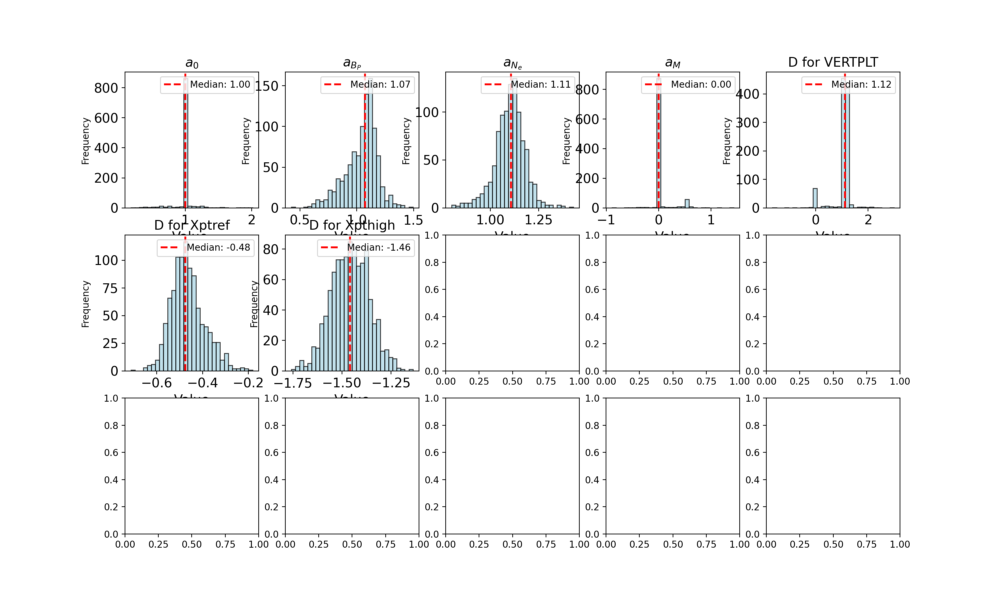

IndexError: index 7 is out of bounds for axis 1 with size 7

In [382]:
import numpy as np
import matplotlib.pyplot as plt
titles = ["$a_0$", "$a_{B_P}$", "$a_{N_e}$", "$a_{M}$", "D for VERTPLT", "D for Xptref", "D for Xpthigh", "D for Xptin", "D for V5", "D for CORNER", "D for VT", "D for V5L", "D for V5E", "D for V5C", "D for HT3R"]
S_new1 = np.array(S_new)  # 转换为 NumPy 数组
gamma_new = np.array(gamma_new)
D=8
# 绘制直方图
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(15, 9))
axes = axes.flatten()

for i in range(D):
    if i ==12 or i ==13:
        continue
    else:
        ax = axes[i]


        # 只有第一张 (i=0) 和最后一张 (i=D-1) 需要 exp 变换
        if i == 0 :

            filtered_beta = np.exp(S_new1[:, i])  # 只对特定索引应用 exp
            xlabel_text = 'Value '
        else:
            filtered_beta = S_new1[:, i]
            xlabel_text = 'Value'

        # 计算中位数
        median_value = np.median(filtered_beta)

        # 绘制直方图（颜色设为浅蓝）
        ax.hist(filtered_beta, bins=30, alpha=0.75, color='lightblue', edgecolor='black')

        # 标出中位数
        ax.axvline(median_value, color='red', linestyle='dashed', linewidth=2, label=f'Median: {median_value:.2f}')
        ax.legend()

        # 设置标题和标签
        #ax.set_title(f'{X_with_intercept.columns[i]}')
        ax.set_title(titles[i], fontsize=14)
        ax.set_xlabel(xlabel_text, fontsize=14)
        ax.tick_params(axis='both', which='major', labelsize=14)
        ax.set_ylabel('Frequency')

plt.tight_layout()
#plt.savefig('distribution_exp_all_config_median.png', format='png', dpi=300, transparent=True)
plt.show()

# 计算均值
S_mean_new = S_new1.mean(axis=0)
beta_new_look_new = np.array(beta_new_look).mean(axis=0)  
gamma_mean = np.array(gamma_new).mean(axis=0) 
gamma_binary = (gamma_mean > 0.5).astype(int)

print(gamma_mean)
print(S_mean_new)
print(beta_new_look_new)

#predictions = np.array(predictions).T  
#pred_mean = predictions.mean(axis=1) 
'''SS_res = np.sum((pred_mean - y) ** 2)
SS_tot = np.sum((y - np.mean(y)) ** 2)
R_squared = 1 - (SS_res / SS_tot)

print(f"1000 samples' R² values=: {R_squared:.4f}")'''
from sklearn.metrics import mean_squared_error
pred_mean = predictions.mean(axis=1)  # 在采样维度上取均值，使得 pred_mean 变为 (483,)
print(pred_mean.shape)
rmse = np.sqrt(mean_squared_error(y, pred_mean))
print(f"1000 samples' RMSE: {rmse:.4f}")

In [383]:

trace.to_netcdf("low_branch_trace_noIP_config4.nc")

# 查看并保存summary
summary_df = az.summary(trace, var_names=["beta", "gamma","gamma_prev", "sigma2", "beta_ori","eta", "pi", "p"])
print(summary_df)
summary_df.to_csv("low_branch_trace_noIP_config4.csv")

/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/opt/anaconda3/envs/pymc_env/lib/python3.12/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


                mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
beta[0]        0.006  1.173  -2.088    2.282      0.027    0.019    1780.0   
beta[1]        1.044  0.144   0.735    1.291      0.013    0.009     163.0   
beta[2]        1.094  0.082   0.941    1.256      0.006    0.005     140.0   
beta[3]        0.089  1.140  -2.191    2.122      0.027    0.032    1798.0   
beta[4]        1.051  0.489  -0.045    1.654      0.062    0.044     266.0   
beta[5]       -0.463  0.074  -0.589   -0.307      0.002    0.002    1035.0   
beta[6]       -1.463  0.097  -1.651   -1.286      0.002    0.001    2616.0   
gamma[0]       0.172  0.377   0.000    1.000      0.037    0.026     106.0   
gamma[1]       1.000  0.000   1.000    1.000      0.000    0.000   12000.0   
gamma[2]       1.000  0.000   1.000    1.000      0.000    0.000   12000.0   
gamma[3]       0.176  0.381   0.000    1.000      0.091    0.065      18.0   
gamma[4]       0.938  0.242   0.000    1.000      0.059    0.043